# Comparativa con datos de prueba

### Carga de librerías

In [1]:
import os

src_path = os.path.abspath(os.path.join(os.getcwd(), '..'))
os.chdir(src_path)

from src.seacast_tools.np_loaders import TargetsFromNumpy, PredictionsFromNumpy
from weatherbenchX.metrics import deterministic
from weatherbenchX.metrics import base as metrics_base
from weatherbenchX import aggregation
from matplotlib.colors import Normalize
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from matplotlib.colors import Normalize
from src.seacast_tools.np_loaders import TargetsFromNumpy, PredictionsFromNumpy
from weatherbenchX.metrics import probabilistic
from weatherbenchX.metrics import base as metrics_base
from weatherbenchX import aggregation, weighting, binning
from src.seacast_tools.ensemble_loaders import EnsembleFromNpLoaders

In [2]:
def get_directories(path):
    dirs = []
    for d in os.listdir(path):
        if d.startswith("unified"):
            continue
        full_dir = os.path.join(path, d)
        target_path = os.path.join(full_dir, "files", "predictions")
        if os.path.isdir(target_path):
            dirs.append(target_path)
    return dirs


##### Funicón para ver media de sst por miembro de ensemble

In [3]:
def plot_ensemble_mean_sst(ds):
    #sst = ds['sst_temperature'].isel(init_time=0)
    sst = ds['sst_temperature'].mean(dim='init_time')
    sst_mean = sst.mean(dim='lead_time')

    n_members = sst_mean.sizes['number']

    ncols = int(np.ceil(np.sqrt(n_members)))
    nrows = int(np.ceil(n_members / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 4*nrows),
                             subplot_kw={'xticks': [], 'yticks': []})

    if nrows == 1:
        axes = np.expand_dims(axes, axis=0)
    if ncols == 1:
        axes = np.expand_dims(axes, axis=1)

    vmin = sst_mean.min().item()
    vmax = sst_mean.max().item()

    for i in range(n_members):
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]
        im = ax.imshow(
            sst_mean.isel(number=i),
            origin='lower',
            cmap='viridis',
            vmin=vmin,
            vmax=vmax
        )
        ax.set_title(f'Miembro {i+1}', fontsize=10)

    for i in range(n_members, nrows * ncols):
        row = i // ncols
        col = i % ncols
        fig.delaxes(axes[row, col])

    fig.subplots_adjust(right=0.9, hspace=0.3, wspace=0.1)
    cbar_ax = fig.add_axes([0.92, 0.2, 0.015, 0.6])
    fig.colorbar(im, cax=cbar_ax, label='SST media (K)')

    plt.suptitle("Media SST en lead_time por miembro del ensemble", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

##### Función para ver diferencias miembros de ensemble con target

In [4]:
def plot_ensemble_differences(ds, target):
    #sst_ens = ds['sst_temperature'].isel(init_time=0)
    sst_ens = ds['sst_temperature'].mean(dim='init_time')
    sst_ens_mean = sst_ens.mean(dim='lead_time')

    sst_target = target['sst_temperature'].isel(init_time=0)
    sst_target_mean = sst_target.mean(dim='lead_time')

    diff = sst_ens_mean - sst_target_mean

    n_members = diff.sizes['number']
    ncols = int(np.ceil(np.sqrt(n_members)))
    nrows = int(np.ceil(n_members / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 4*nrows),
                             subplot_kw={'xticks': [], 'yticks': []})

    if nrows == 1:
        axes = np.expand_dims(axes, axis=0)
    if ncols == 1:
        axes = np.expand_dims(axes, axis=1)

    vlim = np.nanmax(np.abs(diff.values))
    vmin, vmax = -vlim, vlim

    for i in range(n_members):
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]
        im = ax.imshow(
            diff.isel(number=i),
            origin='lower',
            cmap='RdBu_r',
            vmin=vmin,
            vmax=vmax
        )
        ax.set_title(f'Dif Miembro {i+1}', fontsize=10)

    for i in range(n_members, nrows * ncols):
        row = i // ncols
        col = i % ncols
        fig.delaxes(axes[row, col])

    fig.subplots_adjust(right=0.9, hspace=0.3, wspace=0.1)
    cbar_ax = fig.add_axes([0.92, 0.2, 0.015, 0.6])
    fig.colorbar(im, cax=cbar_ax, label='Diferencia SST (K)')

    plt.suptitle("Diferencia de SST media por miembro respecto al target", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

##### Función para ver media por lead time de ensembles unificados

In [5]:
def plot_mean_sst_for_lead_times(ds, lead_times_to_plot=(1, 3, 6, 9, 12, 15)):

    lead_days = ds['lead_time'].dt.days
    ds = ds.assign_coords(lead_day=("lead_time", lead_days.data))

    sst = ds['sst_temperature'].mean(dim='init_time')

    selected = sst.sel(lead_time=sst['lead_day'].isin(lead_times_to_plot))

    n = selected.sizes['lead_time']
    ncols = int(np.ceil(np.sqrt(n)))
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 4*nrows),
                             subplot_kw={'xticks': [], 'yticks': []})

    axes = np.array(axes).reshape(nrows, ncols)

    vmin = selected.min().item()
    vmax = selected.max().item()

    for i, lead_idx in enumerate(selected['lead_time']):
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]

        im = ax.imshow(selected.sel(lead_time=lead_idx),
                       origin='lower',
                       cmap='viridis',
                       vmin=vmin,
                       vmax=vmax)

        lead_day = lead_idx.dt.days.item()
        ax.set_title(f'Lead Time {lead_day} días')

    for j in range(n, nrows * ncols):
        row = j // ncols
        col = j % ncols
        fig.delaxes(axes[row, col])

    fig.subplots_adjust(right=0.9, hspace=0.3, wspace=0.1)
    cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
    fig.colorbar(im, cax=cbar_ax, label='SST media (K)')

    plt.suptitle("SST media por lead_time seleccionado", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

In [6]:
variables = ["sst_temperature"]
extra_variables = ["coordinates", "mask"]
extra_files = [r"data\atlantic\static\coordinates.npy", r"data\atlantic\static\sea_mask.npy"]

def get_ensemble_dataset_loaders(directories):
  
    loaders = []
    for directory in directories:
        predictions = PredictionsFromNumpy(
            path=directory,
            variables=variables,
            extra_variables=extra_variables,
            extra_files=extra_files
        )
        loaders.append(predictions)
    
    return loaders

### Diccionario métricas

In [7]:
dict_metric_names = {
    "crps.sst_temperature": "CRPS",
    "rmse_unb.sst_temperature": "RMSE (sin sesgo)",
    "spread_skill_ratio.sst_temperature": "Spread/skill",
    "spread_skill_ratio_unb.sst_temperature": "Spread/skill (sin sesgo)",
    "rmse.sst_temperature": "RMSE",
    "mae.sst_temperature": "MAE",
    "bias.sst_temperature": "Sesgo",
}

### Diccionario estadísticas

In [8]:
"UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True", "SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True", "EnsembleVariance_number_skipna_ensemble_True", "CRPSSkill_number", "CRPSSpread_number_fair_predictions"

dict_statistic_names = {
    "UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True": "RMSE (sin sesgo)",
    "SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True": "RMSE",
    "EnsembleVariance_number_skipna_ensemble_True": "Desviación estándar ($\sigma$)",
    "CRPSSkill_number": "CRPS Skill",
    "CRPSSpread_number_fair_predictions": "CRPS Spread",
}

metrics_with_stats = {
    "crps.sst_temperature": ["CRPSSkill_number", "CRPSSpread_number_fair_predictions"],
    "rmse_unb.sst_temperature": ["UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True"],
    "spread_skill_ratio.sst_temperature": ["EnsembleVariance_number_skipna_ensemble_True", "SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True"],
    "spread_skill_ratio_unb.sst_temperature": ["EnsembleVariance_number_skipna_ensemble_True", "UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True"],
}

sqrt_stats = {
    "UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True",
    "SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True",
    "EnsembleVariance_number_skipna_ensemble_True"
}

### Cargando datos reales

In [9]:
directory = r"data\atlantic\samples\test"

targets = TargetsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

Loaded 1 data entries from data\atlantic\samples\test


In [10]:
targets_dataset = targets.load_chunk()

targets_dataset

<xarray.Dataset> Size: 4MB
Dimensions:          (latitude: 300, longitude: 300, init_time: 1, lead_time: 15)
Coordinates:
  * latitude         (latitude) float64 2kB 19.57 19.62 19.68 ... 34.48 34.52
  * longitude        (longitude) float64 2kB -20.93 -20.88 ... -6.025 -5.975
  * init_time        (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time        (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
    mask             (init_time, lead_time, latitude, longitude) bool 1MB Tru...
    valid_time       (init_time, lead_time) datetime64[ns] 120B 2022-01-03 .....
Data variables:
    sst_temperature  (init_time, lead_time, latitude, longitude) float16 3MB ...

### Cargando datos predicción sin ruido y sin ensemble

In [11]:
directory = r"data\atlantic\predictions mock\without_noise\run-20250623_225335-nfyrtegq\files\predictions"
prediction_without_noise = PredictionsFromNumpy(directory, variables=variables, extra_variables=extra_variables, extra_files=extra_files)
predictions_without_noise_dataset = prediction_without_noise.load_chunk()
predictions_without_noise_dataset

Loaded 1 data entries from data\atlantic\predictions mock\without_noise\run-20250623_225335-nfyrtegq\files\predictions


<xarray.Dataset> Size: 4MB
Dimensions:          (latitude: 300, longitude: 300, init_time: 1, lead_time: 15)
Coordinates:
  * latitude         (latitude) float64 2kB 19.57 19.62 19.68 ... 34.48 34.52
  * longitude        (longitude) float64 2kB -20.93 -20.88 ... -6.025 -5.975
  * init_time        (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time        (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
    mask             (init_time, lead_time, latitude, longitude) bool 1MB Tru...
Data variables:
    sst_temperature  (init_time, lead_time, latitude, longitude) float16 3MB ...

### Cálculo métricas manual desde estadísticas

In [12]:
def get_skill_spread_ratio(mse, std):
    return np.sqrt(std) / np.sqrt(mse)

def get_crps(skill, spread):
    return skill - 0.5 * spread

def get_rmse_unb(mse):
    return np.sqrt(mse)

def get_metrics_probabilistic(statistics):
    var = statistics.mean_statistics()

    mse_unbiased = var["UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True"]['sst_temperature']
    mse_biased = var["SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True"]['sst_temperature']
    spread = var["EnsembleVariance_number_skipna_ensemble_True"]['sst_temperature']
    crps_skill = var["CRPSSkill_number"]['sst_temperature']
    crps_spread = var["CRPSSpread_number_fair_predictions"]['sst_temperature']

    spread_skill_ratio_unb = get_skill_spread_ratio(mse_unbiased, spread)
    spread_skill_ratio = get_skill_spread_ratio(mse_biased, spread)
    crps_diff = get_crps(crps_skill, crps_spread)
    rmse_unbiased = get_rmse_unb(mse_unbiased)

    ds = xr.Dataset({
        "crps.sst_temperature": crps_diff.astype("float16"),
        "rmse_unb.sst_temperature": rmse_unbiased,
        "spread_skill_ratio.sst_temperature": spread_skill_ratio,
        "spread_skill_ratio_unb.sst_temperature": spread_skill_ratio_unb,
    })

    if "lead_time" in ds.coords:
        ds["lead_time"] = ds["lead_time"].astype("timedelta64[D]")

    return ds

## Prueba 5 miembros ensemble

### Comparación de pruebas con tipos de ruido segun métricas probabilísticas

#### Definición de métricas

In [13]:
metrics = {
    "crps" : probabilistic.CRPSEnsemble(),
    "rmse_unb": probabilistic.UnbiasedEnsembleMeanRMSE(skipna_ensemble=True),
    "spread_skill_ratio": probabilistic.SpreadSkillRatio(skipna_ensemble=True),
    "spread_skill_ratio_unb": probabilistic.UnbiasedSpreadSkillRatio(skipna_ensemble=True),
}

weigh_by = [weighting.GridAreaWeighting()]
regions = {
    # ((lat_min, lat_max), (lon_min, lon_max))
    'canarias': ((19.55, 34.525), (-20.97, -5.975)),
}
bin_by = [binning.Regions(regions)]

#aggregator = aggregation.Aggregator(
#  reduce_dims=['latitude', 'longitude'],
#  bin_by=bin_by,
#  weigh_by=weigh_by,
#  skipna=True
#)
aggregator = aggregation.Aggregator(
  reduce_dims=['latitude', 'longitude'], skipna=True
)

#### Cargando datos Gaussiano std 0.1

In [14]:
ensemble_gaussian_01_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\gaussian_01"))
ensemble_gaussian_01 = EnsembleFromNpLoaders(loaders=ensemble_gaussian_01_loaders)
ensemble_gaussian_01_dataset = ensemble_gaussian_01.build_ensemble()

statistics_gaussian_01_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_gaussian_01_dataset, targets_dataset)
aggregation_state_gaussian_01_ens_5 = aggregator.aggregate_statistics(statistics_gaussian_01_ens_5)
dataset_metrics_gaussian_01_ens_5_manual = get_metrics_probabilistic(aggregation_state_gaussian_01_ens_5)
dataset_metrics_gaussian_01_ens_5 = aggregation_state_gaussian_01_ens_5.metric_values(metrics)
dataset_metrics_gaussian_01_ens_5["lead_time"] = dataset_metrics_gaussian_01_ens_5["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\run-20250623_173928-gbp74pck\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\run-20250623_174214-r2ek9l48\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\run-20250623_174506-wbt22vo4\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\run-20250623_174831-3y0kvpx8\files\predictions


Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\run-20250623_175100-02dtpyi1\files\predictions


In [15]:
get_skill_spread_ratio_manual = metrics_base.compute_metrics_from_statistics(
    metrics, aggregation_state_gaussian_01_ens_5.mean_statistics()
)

In [16]:
statistics_gaussian_01_ens_5

{'CRPSSkill_number': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15,
                                       latitude: 300, longitude: 300)> Size: 3MB
  array([[[[0.2 , 0.1 , 0.1 , ...,  nan,  nan,  nan],
           [0.15, 0.05, 0.1 , ...,  nan,  nan,  nan],
           [0.1 , 0.05, 0.05, ...,  nan,  nan,  nan],
           ...,
           [0.15, 0.05, 0.  , ...,  nan,  nan,  nan],
           [0.  , 0.05, 0.05, ...,  nan,  nan,  nan],
           [0.2 , 0.1 , 0.05, ...,  nan,  nan,  nan]],
  
          [[0.25, 0.1 , 0.3 , ...,  nan,  nan,  nan],
           [0.2 , 0.05, 0.2 , ...,  nan,  nan,  nan],
           [0.15, 0.1 , 0.2 , ...,  nan,  nan,  nan],
           ...,
           [0.35, 0.1 , 0.  , ...,  nan,  nan,  nan],
           [0.1 , 0.05, 0.1 , ...,  nan,  nan,  nan],
           [0.2 , 0.  , 0.15, ...,  nan,  nan,  nan]],
  
          [[0.4 , 0.1 , 0.3 , ...,  nan,  nan,  nan],
           [0.2 , 0.1 , 0.2 , ...,  nan,  nan,  nan],
           [0.45

In [17]:
aggregation_state_gaussian_01_ens_5

AggregationState(sum_weighted_statistics={'CRPSSkill_number': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 30B
array([[ 6432.,  8296.,  9728., 10608., 11032., 11328., 11704., 12088.,
        12424., 12576., 12824., 13112., 13320., 13288., 13760.]],
      dtype=float16)
Coordinates:
  * init_time   (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time   (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
    valid_time  (init_time, lead_time) datetime64[ns] 120B 2022-01-03 ... 202...}, 'CRPSSpread_number_fair_predictions': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 30B
array([[ 8768., 10608., 11536., 11960., 12104., 12088., 11928., 11704.,
        11480., 11208., 10928., 10656., 10408., 10152.,  9912.]],
      dtype=float16)
Coordinates:
  * init_time  (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time  (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days}, 'UnbiasedEnsemb

In [18]:
aggregation_state_gaussian_01_ens_5.mean_statistics()["EnsembleVariance_number_skipna_ensemble_True"]

{'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 60B
 array([[0.03029938, 0.04217005, 0.04922738, 0.05292911, 0.05444865,
         0.05454343, 0.05342546, 0.05175076, 0.05000548, 0.04792526,
         0.0458694 , 0.0438747 , 0.04207747, 0.04027894, 0.03858142]],
       dtype=float32)
 Coordinates:
   * init_time  (init_time) datetime64[ns] 8B 2022-01-02
   * lead_time  (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days}

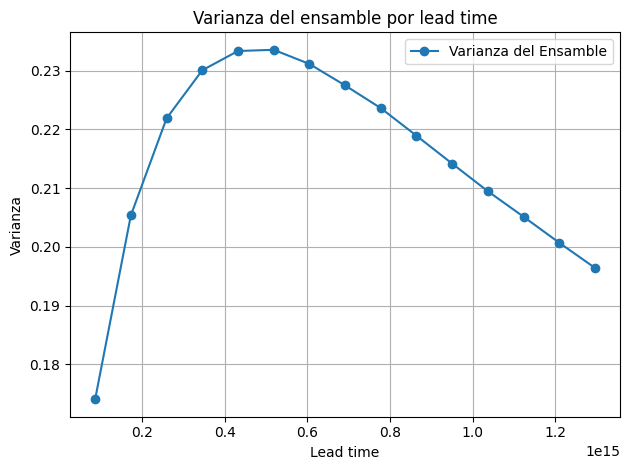

In [19]:
var_ens_gaussian_01 = aggregation_state_gaussian_01_ens_5.mean_statistics()["EnsembleVariance_number_skipna_ensemble_True"]['sst_temperature']
var_ens_gaussian_01 = np.sqrt(var_ens_gaussian_01)
var_ens_gaussian_01.plot(x='lead_time', marker='o', label='Varianza del Ensamble')

plt.title("Varianza del ensamble por lead time")
plt.ylabel("Varianza")
plt.xlabel("Lead time")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

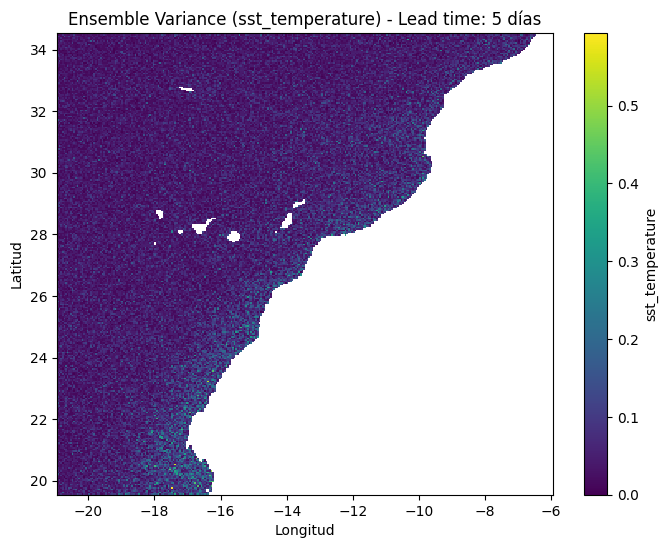

In [20]:
import xarray as xr
import matplotlib.pyplot as plt

ensemble_variance = statistics_gaussian_01_ens_5['EnsembleVariance_number_skipna_ensemble_True']['sst_temperature']

da_plot = ensemble_variance.sel(init_time='2022-01-02', lead_time='5 days')

plt.figure(figsize=(8, 6))
da_plot.plot(cmap='viridis')
plt.title('Ensemble Variance (sst_temperature) - Lead time: 5 días')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

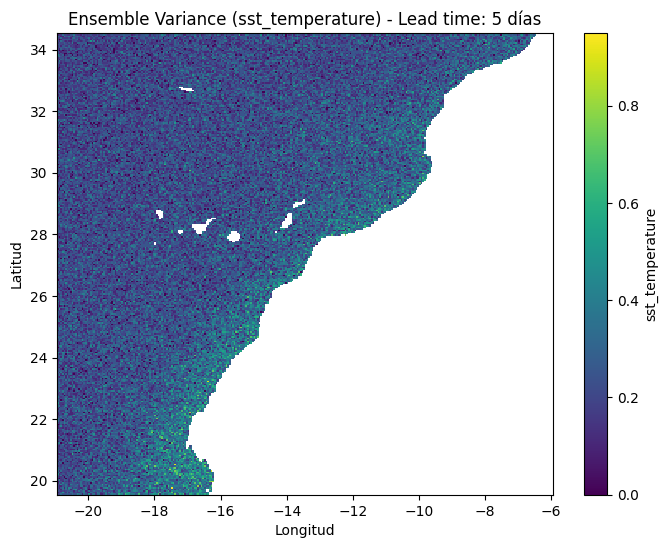

In [21]:
import xarray as xr
import matplotlib.pyplot as plt

ensemble_variance = statistics_gaussian_01_ens_5['CRPSSpread_number_fair_predictions']['sst_temperature']

da_plot = ensemble_variance.sel(init_time='2022-01-02', lead_time='5 days')

plt.figure(figsize=(8, 6))
da_plot.plot(cmap='viridis')
plt.title('Ensemble Variance (sst_temperature) - Lead time: 5 días')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

In [22]:
ensemble_gaussian_01_dataset

<xarray.Dataset> Size: 15MB
Dimensions:          (number: 5, init_time: 1, lead_time: 15, latitude: 300,
                      longitude: 300)
Coordinates:
  * latitude         (latitude) float64 2kB 19.57 19.62 19.68 ... 34.48 34.52
  * longitude        (longitude) float64 2kB -20.93 -20.88 ... -6.025 -5.975
  * init_time        (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time        (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
    mask             (init_time, lead_time, latitude, longitude) bool 1MB Tru...
Dimensions without coordinates: number
Data variables:
    sst_temperature  (number, init_time, lead_time, latitude, longitude) float16 14MB ...

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


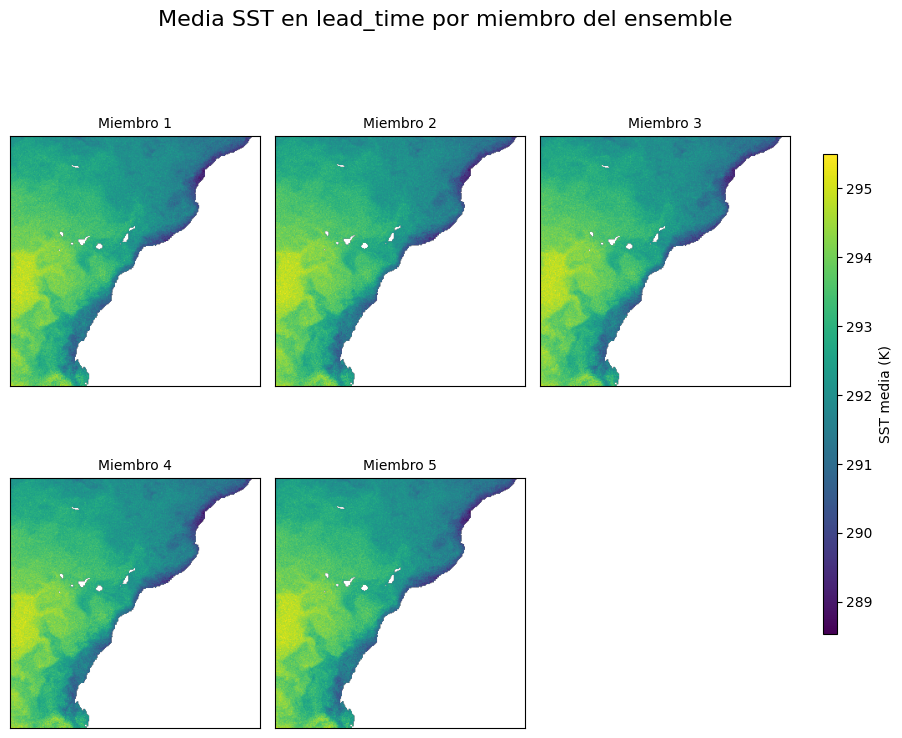

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


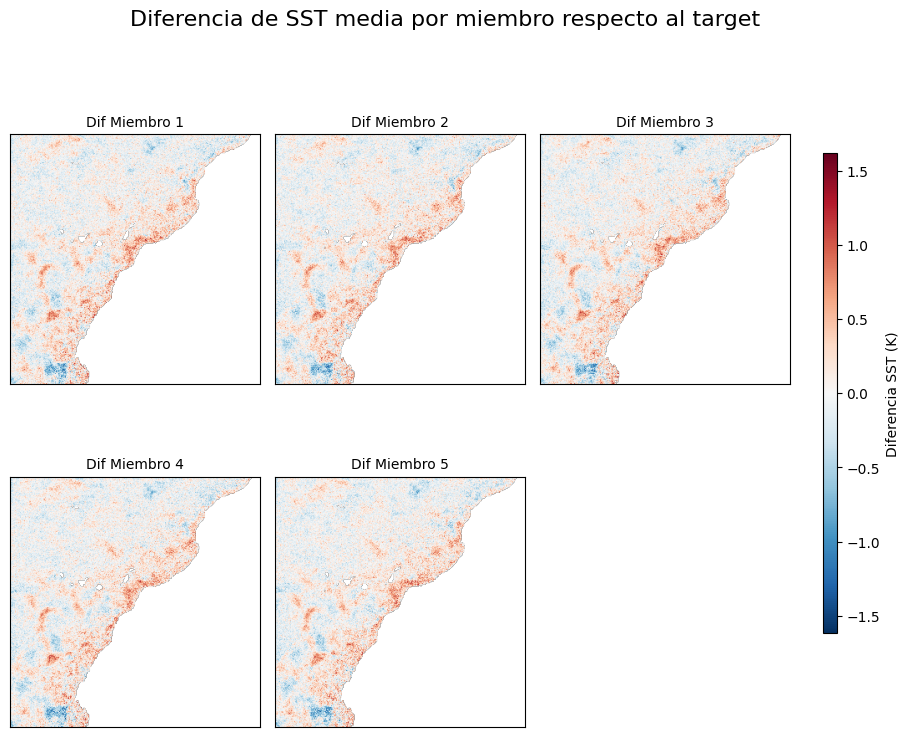

In [23]:
plot_ensemble_mean_sst(ensemble_gaussian_01_dataset)
plot_ensemble_differences(ensemble_gaussian_01_dataset, targets_dataset)

#### Cargando datos gaussian 0.05

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_005\run-20250623_124633-29rli0qf\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_005\run-20250623_124834-gg7slfa3\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_005\run-20250623_125045-svaf63bo\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_005\run-20250623_125242-5y4bax9a\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_005\run-20250623_125517-wuh09wim\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


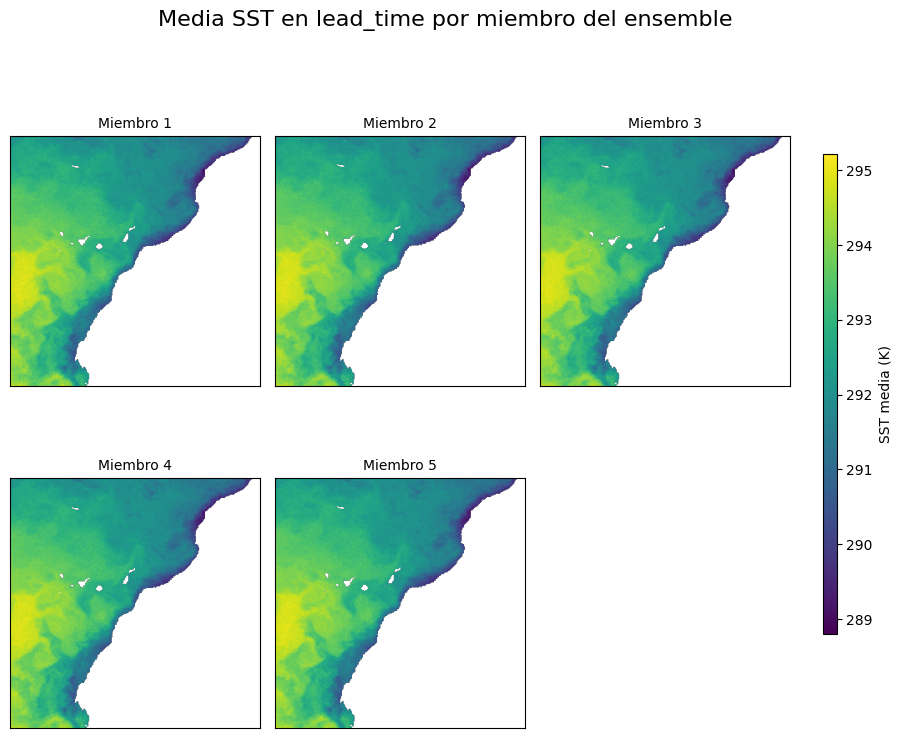

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


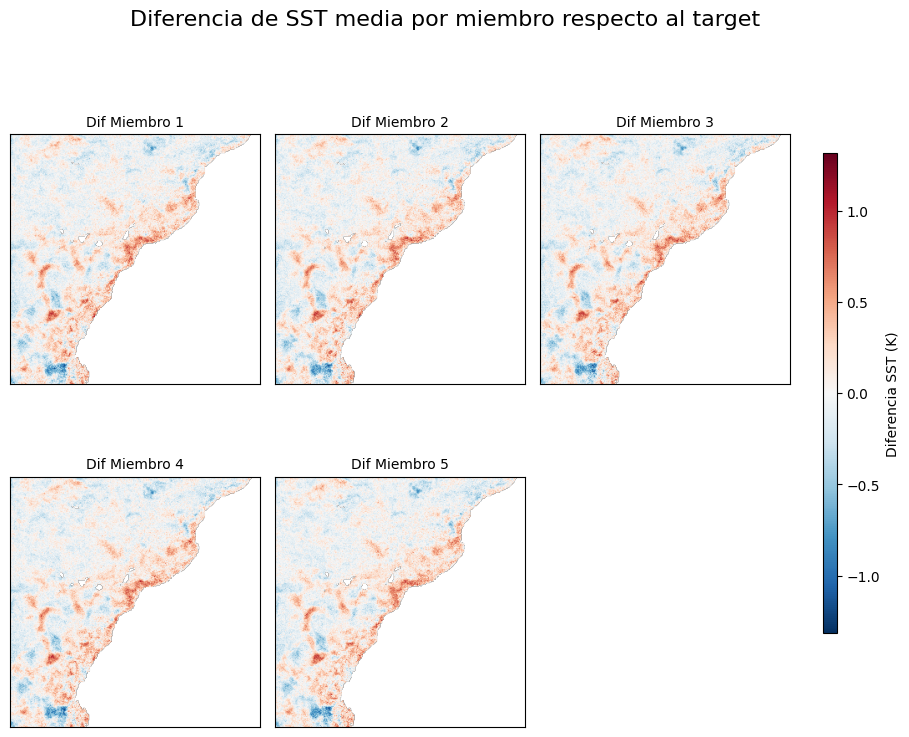

In [24]:
ensemble_gaussian_005_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\gaussian_005"))
ensemble_gaussian_005 = EnsembleFromNpLoaders(loaders=ensemble_gaussian_005_loaders)
ensemble_gaussian_005_dataset = ensemble_gaussian_005.build_ensemble()

statistics_gaussian_005_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_gaussian_005_dataset, targets_dataset)
aggregation_state_gaussian_005_ens_5 = aggregator.aggregate_statistics(statistics_gaussian_005_ens_5)
dataset_metrics_gaussian_005_ens_5_manual = get_metrics_probabilistic(aggregation_state_gaussian_005_ens_5)
dataset_metrics_gaussian_005_ens_5 = aggregation_state_gaussian_005_ens_5.metric_values(metrics)
dataset_metrics_gaussian_005_ens_5["lead_time"] = dataset_metrics_gaussian_005_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_gaussian_005_dataset)
plot_ensemble_differences(ensemble_gaussian_005_dataset, targets_dataset)

In [25]:
aggregation_state_gaussian_005_ens_5.mean_statistics()["EnsembleVariance_number_skipna_ensemble_True"]

{'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 60B
 array([[0.01168964, 0.01481127, 0.01654533, 0.01762562, 0.01811952,
         0.01800575, 0.0177153 , 0.01732663, 0.01690228, 0.0164099 ,
         0.01592645, 0.01543269, 0.01487483, 0.0143064 , 0.01384996]],
       dtype=float32)
 Coordinates:
   * init_time  (init_time) datetime64[ns] 8B 2022-01-02
   * lead_time  (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days}

#### Cargando datos gaussian 0.01

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_001\run-20250623_123345-ft79w4d1\files\predictions


Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_001\run-20250623_123559-0rjpzm21\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_001\run-20250623_123821-058ew24z\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_001\run-20250623_124104-op1jj003\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_001\run-20250623_124309-8ilyerch\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


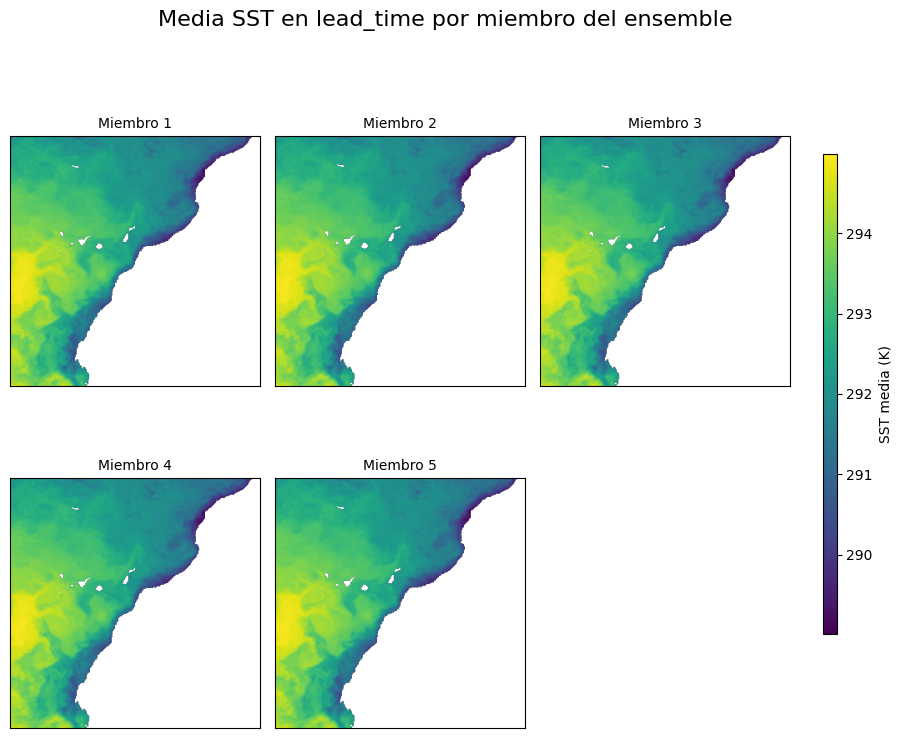

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


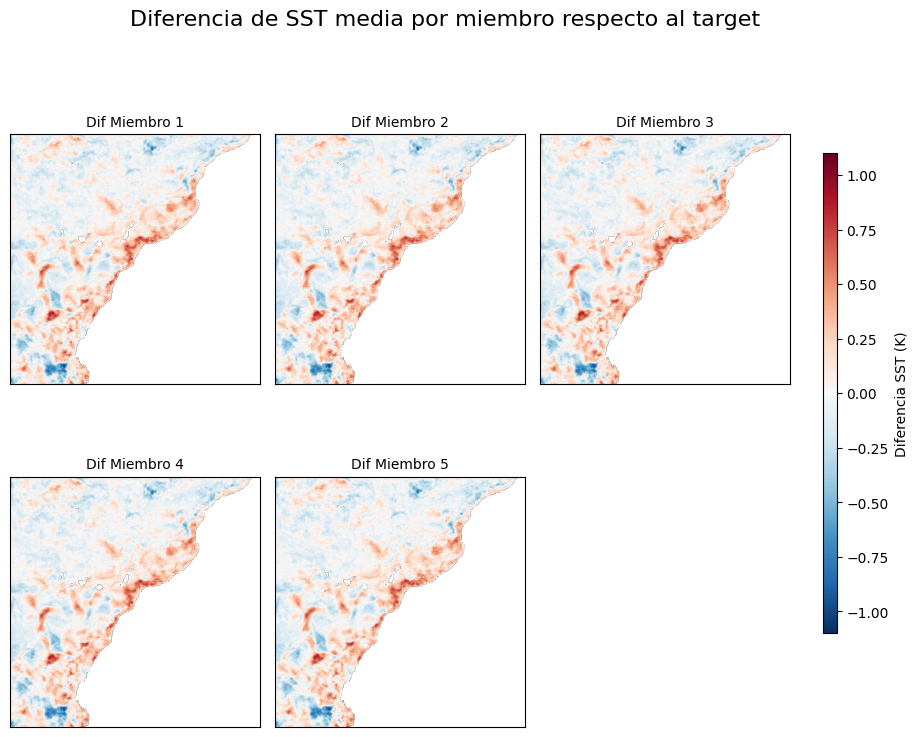

In [26]:
ensemble_gaussian_001_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\gaussian_001"))
ensemble_gaussian_001 = EnsembleFromNpLoaders(loaders=ensemble_gaussian_001_loaders)
ensemble_gaussian_001_dataset = ensemble_gaussian_001.build_ensemble()

statistics_gaussian_001_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_gaussian_001_dataset, targets_dataset)
aggregation_state_gaussian_001_ens_5 = aggregator.aggregate_statistics(statistics_gaussian_001_ens_5)
dataset_metrics_gaussian_001_ens_5_manual = get_metrics_probabilistic(aggregation_state_gaussian_001_ens_5)
dataset_metrics_gaussian_001_ens_5 = aggregation_state_gaussian_001_ens_5.metric_values(metrics)
dataset_metrics_gaussian_001_ens_5["lead_time"] = dataset_metrics_gaussian_001_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_gaussian_001_dataset)
plot_ensemble_differences(ensemble_gaussian_001_dataset, targets_dataset)

In [27]:
dataset_metrics_gaussian_001_ens_5_manual

<xarray.Dataset> Size: 578B
Dimensions:                                 (init_time: 1, lead_time: 15)
Coordinates:
  * init_time                               (init_time) datetime64[ns] 8B 202...
  * lead_time                               (lead_time) timedelta64[s] 120B 1...
    valid_time                              (init_time, lead_time) datetime64[ns] 120B ...
Data variables:
    crps.sst_temperature                    (init_time, lead_time) float16 30B ...
    rmse_unb.sst_temperature                (init_time, lead_time) float64 120B ...
    spread_skill_ratio.sst_temperature      (init_time, lead_time) float32 60B ...
    spread_skill_ratio_unb.sst_temperature  (init_time, lead_time) float64 120B ...

In [28]:
statistics_gaussian_001_ens_5

{'CRPSSkill_number': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15,
                                       latitude: 300, longitude: 300)> Size: 3MB
  array([[[[0.  , 0.  , 0.  , ...,  nan,  nan,  nan],
           [0.  , 0.  , 0.15, ...,  nan,  nan,  nan],
           [0.  , 0.  , 0.  , ...,  nan,  nan,  nan],
           ...,
           [0.25, 0.  , 0.  , ...,  nan,  nan,  nan],
           [0.  , 0.  , 0.  , ...,  nan,  nan,  nan],
           [0.  , 0.  , 0.05, ...,  nan,  nan,  nan]],
  
          [[0.  , 0.  , 0.25, ...,  nan,  nan,  nan],
           [0.05, 0.05, 0.25, ...,  nan,  nan,  nan],
           [0.25, 0.05, 0.  , ...,  nan,  nan,  nan],
           ...,
           [0.25, 0.1 , 0.  , ...,  nan,  nan,  nan],
           [0.  , 0.  , 0.  , ...,  nan,  nan,  nan],
           [0.  , 0.05, 0.05, ...,  nan,  nan,  nan]],
  
          [[0.1 , 0.15, 0.25, ...,  nan,  nan,  nan],
           [0.25, 0.15, 0.25, ...,  nan,  nan,  nan],
           [0.5 

Text(0.5, 0, 'Longitud')

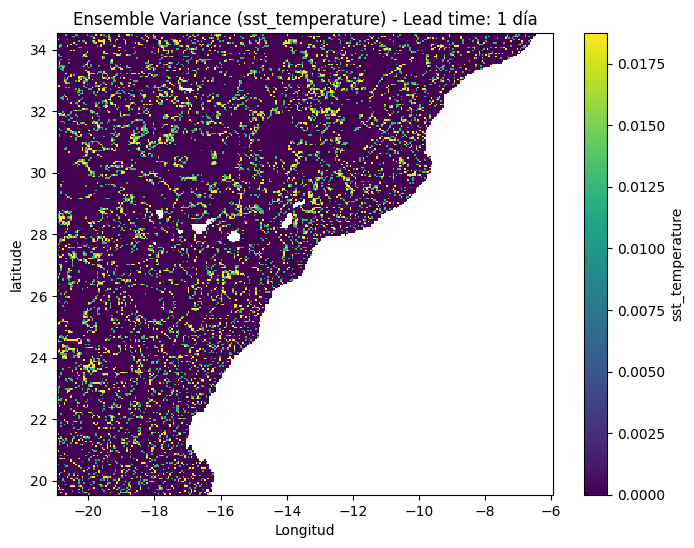

In [29]:
ensemble_variance = statistics_gaussian_001_ens_5['EnsembleVariance_number_skipna_ensemble_True']['sst_temperature']
da_plot = ensemble_variance.sel(init_time='2022-01-02', lead_time='1 days')
plt.figure(figsize=(8, 6))

da_plot.plot(cmap='viridis')
plt.title('Ensemble Variance (sst_temperature) - Lead time: 1 día')
plt.xlabel('Longitud')

Text(0.5, 0, 'Longitud')

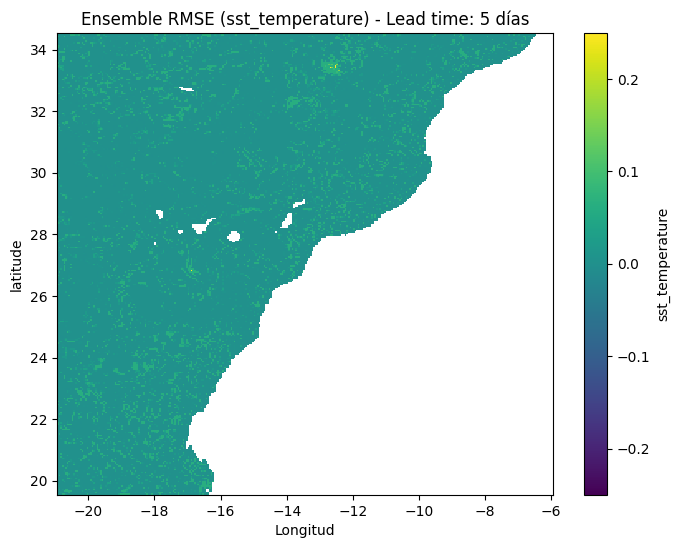

In [30]:
ensemble_variance = statistics_gaussian_001_ens_5['UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True']['sst_temperature']
da_plot = ensemble_variance.sel(init_time='2022-01-02', lead_time='1 days')
plt.figure(figsize=(8, 6))

da_plot.plot(cmap='viridis')
plt.title('Ensemble RMSE (sst_temperature) - Lead time: 5 días')
plt.xlabel('Longitud')

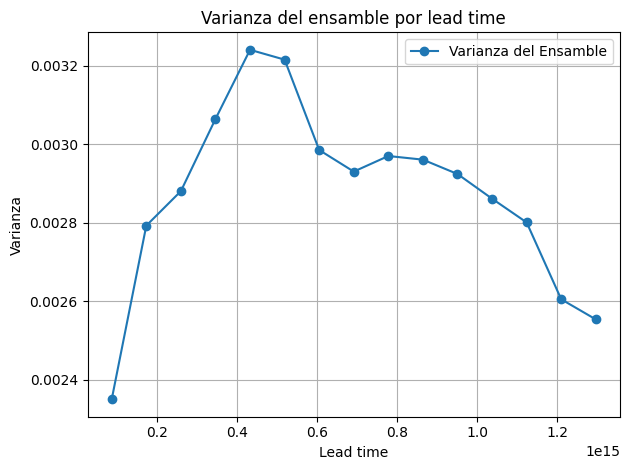

In [31]:
var_ens_gaussian_001 = aggregation_state_gaussian_001_ens_5.mean_statistics()["EnsembleVariance_number_skipna_ensemble_True"]['sst_temperature']
var_ens_gaussian_001.plot(x='lead_time', marker='o', label='Varianza del Ensamble')

plt.title("Varianza del ensamble por lead time")
plt.ylabel("Varianza")
plt.xlabel("Lead time")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [32]:
aggregation_state_gaussian_001_ens_5

AggregationState(sum_weighted_statistics={'CRPSSkill_number': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 30B
array([[ 1679.,  3482.,  5120.,  6172.,  6628.,  7156.,  7872.,  8576.,
         9264.,  9672., 10176., 10720., 11200., 11200., 11712.]],
      dtype=float16)
Coordinates:
  * init_time   (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time   (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
    valid_time  (init_time, lead_time) datetime64[ns] 120B 2022-01-03 ... 202...}, 'CRPSSpread_number_fair_predictions': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 30B
array([[ 922.5, 1096. , 1130. , 1203. , 1272. , 1262. , 1172. , 1150. ,
        1166. , 1162. , 1148. , 1123. , 1099. , 1022.5, 1002. ]],
      dtype=float16)
Coordinates:
  * init_time  (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time  (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days}, 'UnbiasedEnsemb

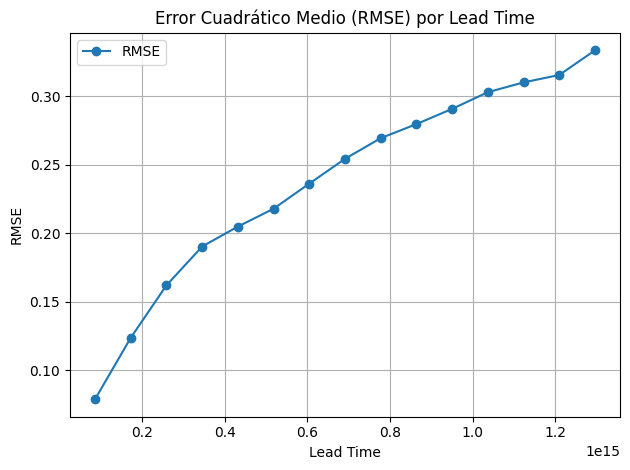

In [33]:
mse = aggregation_state_gaussian_001_ens_5.mean_statistics()["UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True"]['sst_temperature']

rmse = np.sqrt(mse)

rmse.plot(x='lead_time', marker='o', label='RMSE')

plt.title("Error Cuadrático Medio (RMSE) por Lead Time")
plt.ylabel("RMSE")
plt.xlabel("Lead Time")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [34]:
rmse

<xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 120B
array([[0.07891144, 0.12375473, 0.16207383, 0.19037902, 0.20494064,
        0.21797722, 0.23628749, 0.25439209, 0.26945229, 0.27972685,
        0.29083634, 0.30299983, 0.31015057, 0.31557145, 0.33358687]])
Coordinates:
  * init_time   (init_time) datetime64[ns] 8B 2022-01-02
  * lead_time   (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
    valid_time  (init_time, lead_time) datetime64[ns] 120B 2022-01-03 ... 202...

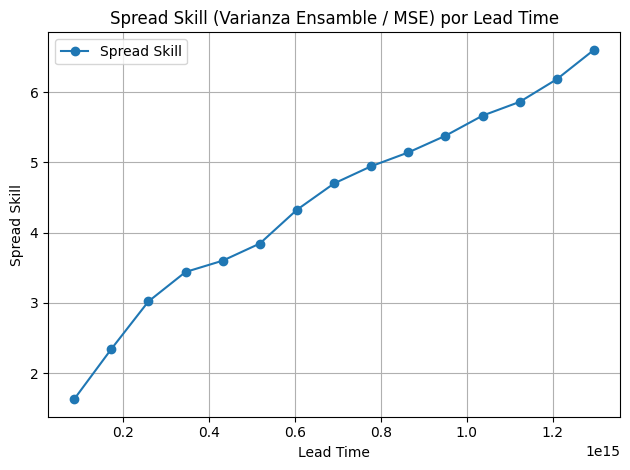

In [35]:
import numpy as np

var_ens = aggregation_state_gaussian_001_ens_5.mean_statistics()["EnsembleVariance_number_skipna_ensemble_True"]['sst_temperature']
mse = aggregation_state_gaussian_001_ens_5.mean_statistics()["UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True"]['sst_temperature']

spread_skill = np.sqrt(mse) / np.sqrt(var_ens)

spread_skill.plot(x='lead_time', marker='o', label='Spread Skill')

plt.title("Spread Skill (Varianza Ensamble / MSE) por Lead Time")
plt.ylabel("Spread Skill")
plt.xlabel("Lead Time")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [36]:
ensemble_gaussian_001_dataset

sst = ensemble_gaussian_001_dataset["sst_temperature"]


lead_time = "15 days"
sst_sel = sst.sel(lead_time=lead_time) 

var_ensemble = sst_sel.var(dim="number", skipna=True)

lat_radians = np.deg2rad(sst_sel.latitude)
weights = np.cos(lat_radians)

weights_broadcast = weights.broadcast_like(var_ensemble)

weighted_var = var_ensemble * weights_broadcast

spread_squared_mean = weighted_var.mean(dim=["init_time", "latitude", "longitude"], skipna=True)

spread = np.sqrt(spread_squared_mean)
print(f"Spread para lead_time={lead_time}: {spread.values:.4f} K")

Spread para lead_time=15 days: 0.0424 K


#### Cargando datos Perlin (2, 12, 12)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin\run-20250623_191234-80ahb5t8\files\predictions


Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin\run-20250623_191557-nwcbeibb\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin\run-20250623_191933-poch6bwy\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin\run-20250623_192326-2rwi63hv\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin\run-20250623_192626-8g7dz33i\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


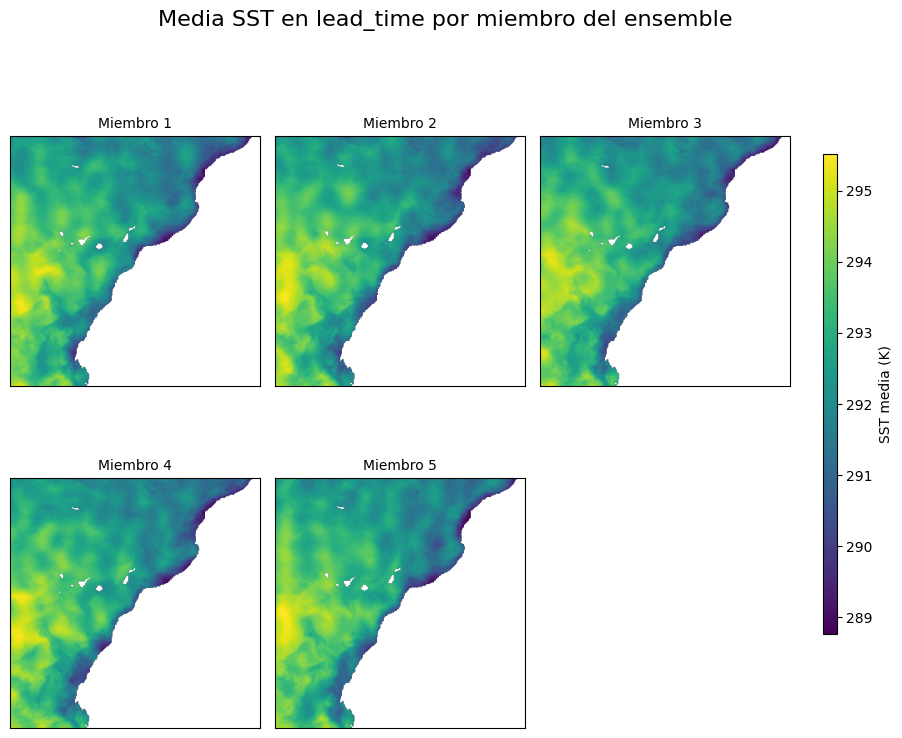

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


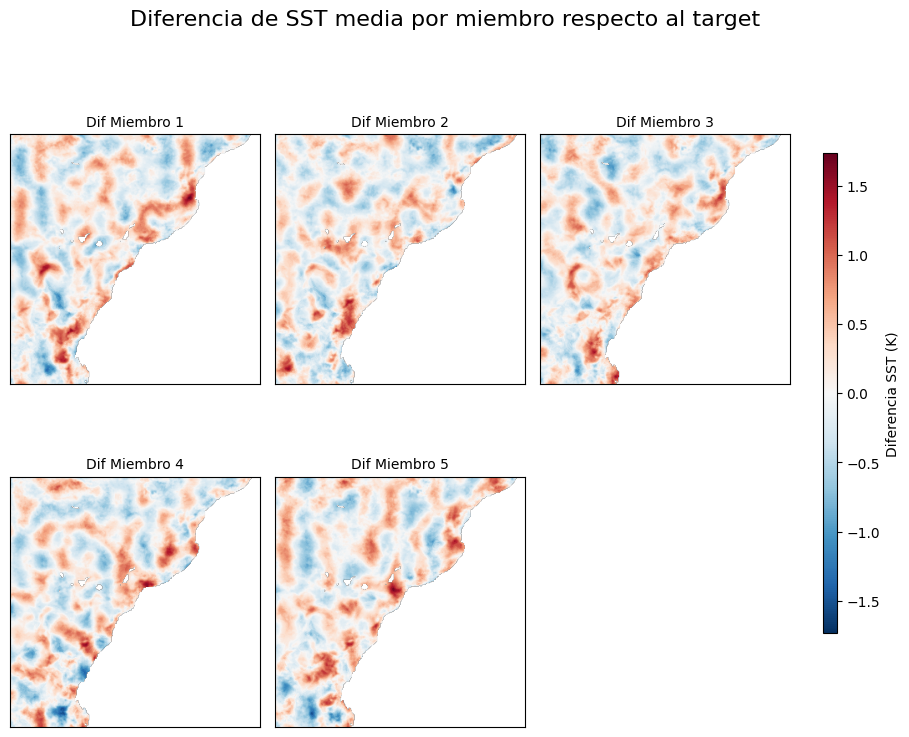

In [37]:
ensemble_perlin_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\perlin"))
ensemble_perlin = EnsembleFromNpLoaders(loaders=ensemble_perlin_loaders)
ensemble_perlin_dataset = ensemble_perlin.build_ensemble()

statistics_perlin_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_dataset, targets_dataset)
aggregation_state_perlin_ens_5 = aggregator.aggregate_statistics(statistics_perlin_ens_5)
dataset_metrics_perlin_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_ens_5)
dataset_metrics_perlin_ens_5 = aggregation_state_perlin_ens_5.metric_values(metrics)
dataset_metrics_perlin_ens_5["lead_time"] = dataset_metrics_perlin_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_dataset)
plot_ensemble_differences(ensemble_perlin_dataset, targets_dataset)

#### Cargando datos Perlin (2, 3, 3)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\run-20250624_133356-1n8na38d\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\run-20250624_133711-5piqciet\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\run-20250624_134004-69xhwdme\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\run-20250624_134345-rzh5rdd4\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\run-20250709_112354-opl29v65\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


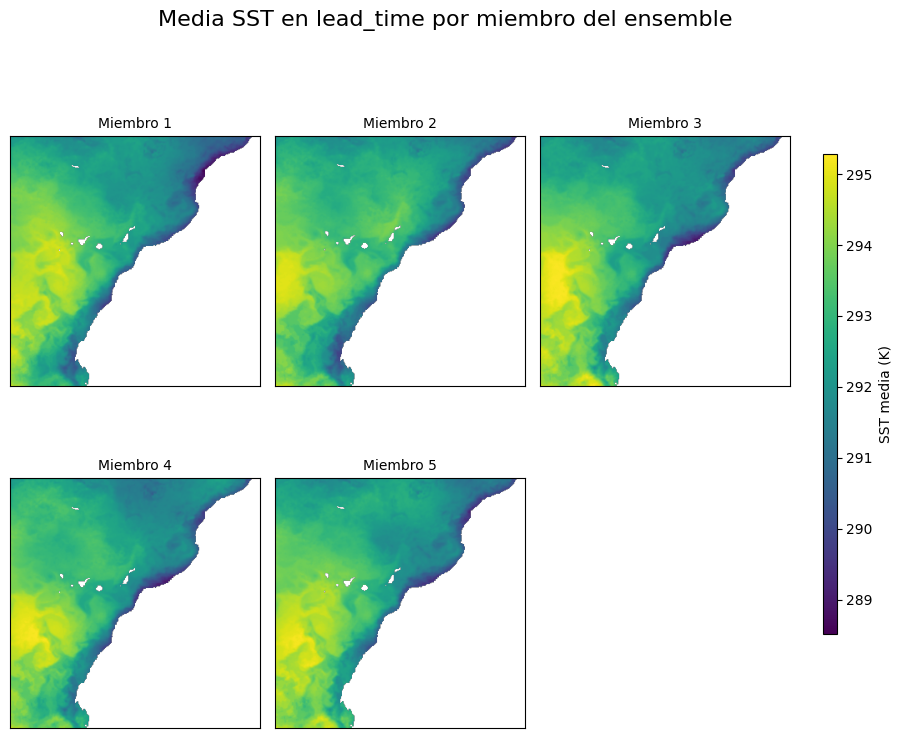

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


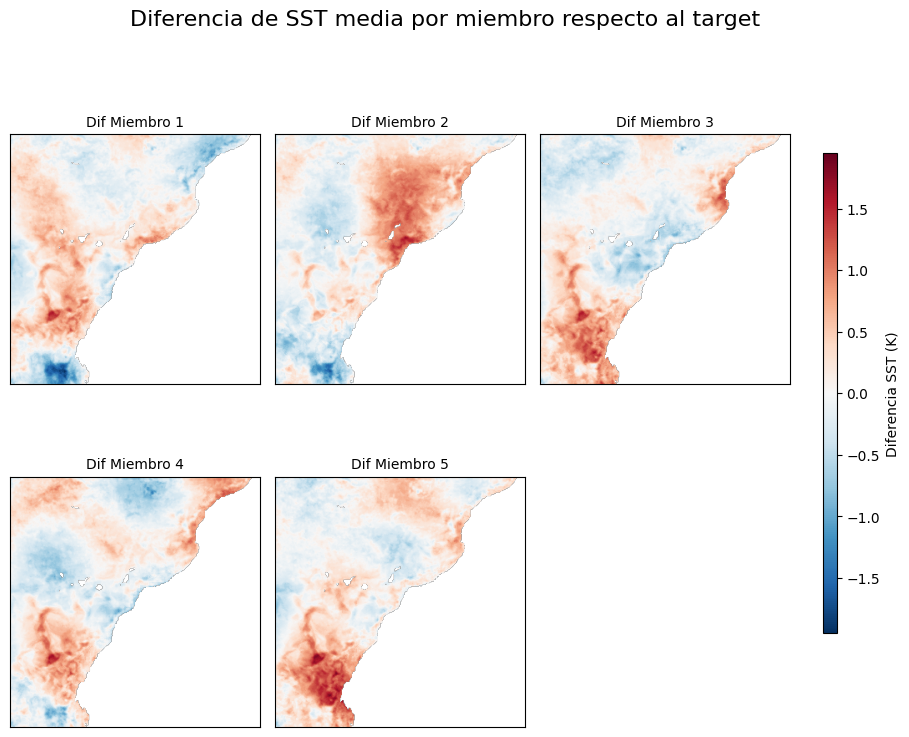

In [38]:
ensemble_perlin_3_3_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3"))
ensemble_perlin_3_3 = EnsembleFromNpLoaders(loaders=ensemble_perlin_3_3_loaders)
ensemble_perlin_3_3_dataset = ensemble_perlin_3_3.build_ensemble()

statistics_perlin_3_3_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_3_3_dataset, targets_dataset)
aggregation_state_perlin_3_3_ens_5 = aggregator.aggregate_statistics(statistics_perlin_3_3_ens_5)
dataset_metrics_perlin_3_3_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_3_3_ens_5)
dataset_metrics_perlin_3_3_ens_5 = aggregation_state_perlin_3_3_ens_5.metric_values(metrics)
dataset_metrics_perlin_3_3_ens_5["lead_time"] = dataset_metrics_perlin_3_3_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_3_3_dataset)
plot_ensemble_differences(ensemble_perlin_3_3_dataset, targets_dataset)

#### Cargando datos Perlin Fractal (3d)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\run-20250623_193257-bl0e0qjh\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\run-20250623_193551-run48772\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\run-20250623_193826-gpyy7su3\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\run-20250623_194225-k5wobmu4\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\run-20250623_194851-e5q123cg\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


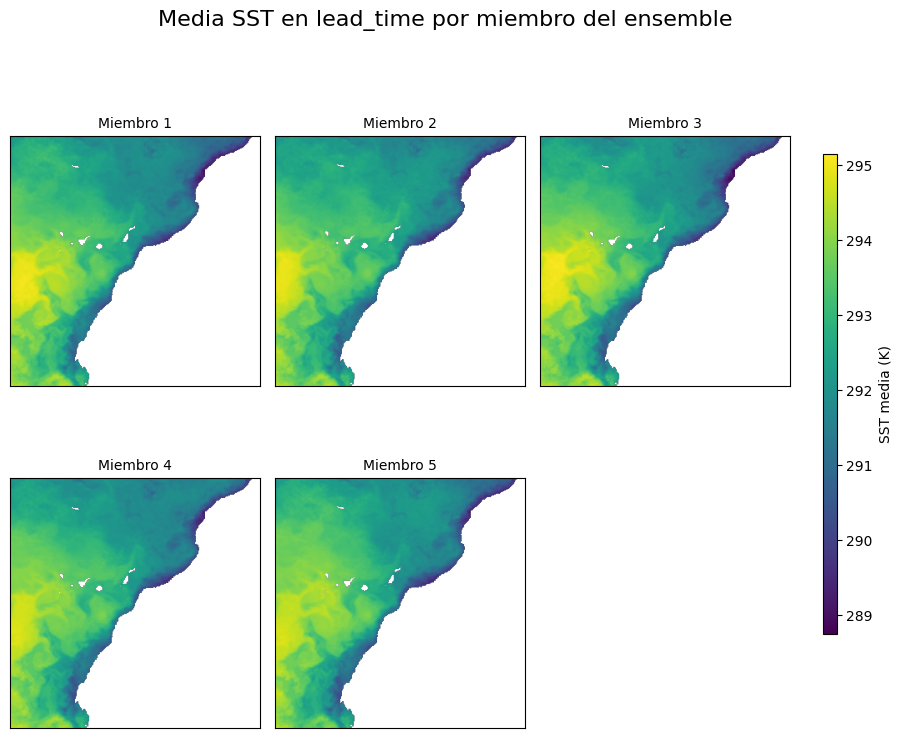

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


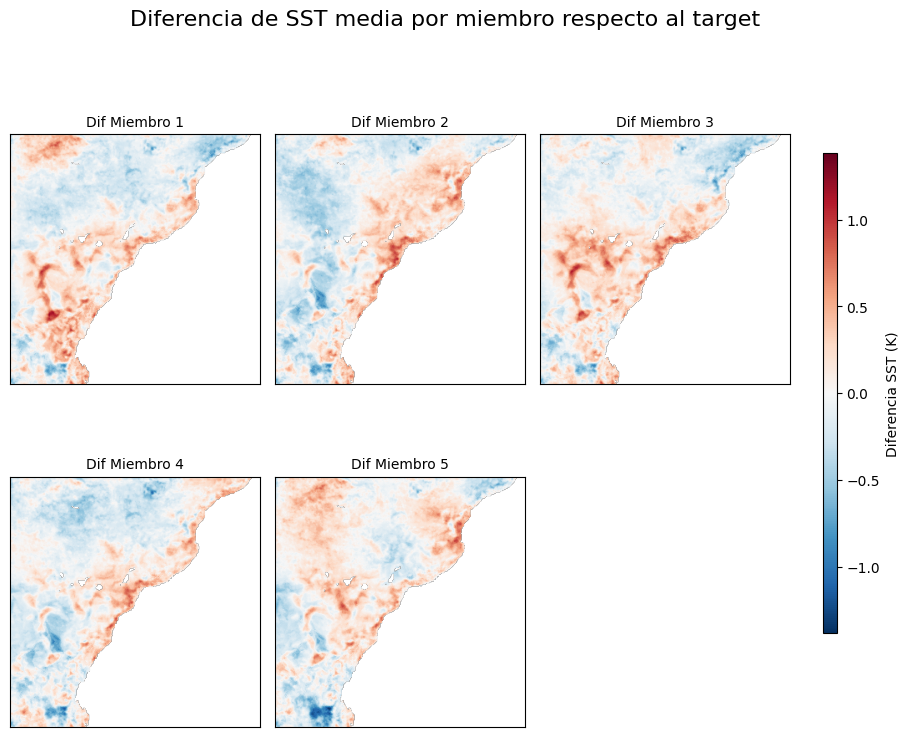

In [39]:
ensemble_perlin_fractal_3d_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d"))
ensemble_perlin_fractal_3d = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_3d_loaders)
ensemble_perlin_fractal_3d_dataset = ensemble_perlin_fractal_3d.build_ensemble()

statistics_perlin_fractal_3d_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_3d_dataset, targets_dataset)
aggregation_state_perlin_fractal_3d_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_3d_ens_5)
dataset_metrics_perlin_fractal_3d_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_fractal_3d_ens_5)
dataset_metrics_perlin_fractal_3d_ens_5 = aggregation_state_perlin_fractal_3d_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_3d_ens_5["lead_time"] = dataset_metrics_perlin_fractal_3d_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_fractal_3d_dataset)
plot_ensemble_differences(ensemble_perlin_fractal_3d_dataset, targets_dataset)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d_1_3_3\run-20250709_110022-0qhfpn7w\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d_1_3_3\run-20250709_110246-i53s8k64\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d_1_3_3\run-20250709_110504-m9pyqx1h\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d_1_3_3\run-20250709_110711-pli6lbij\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d_1_3_3\run-20250709_110935-dnshhx0n\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


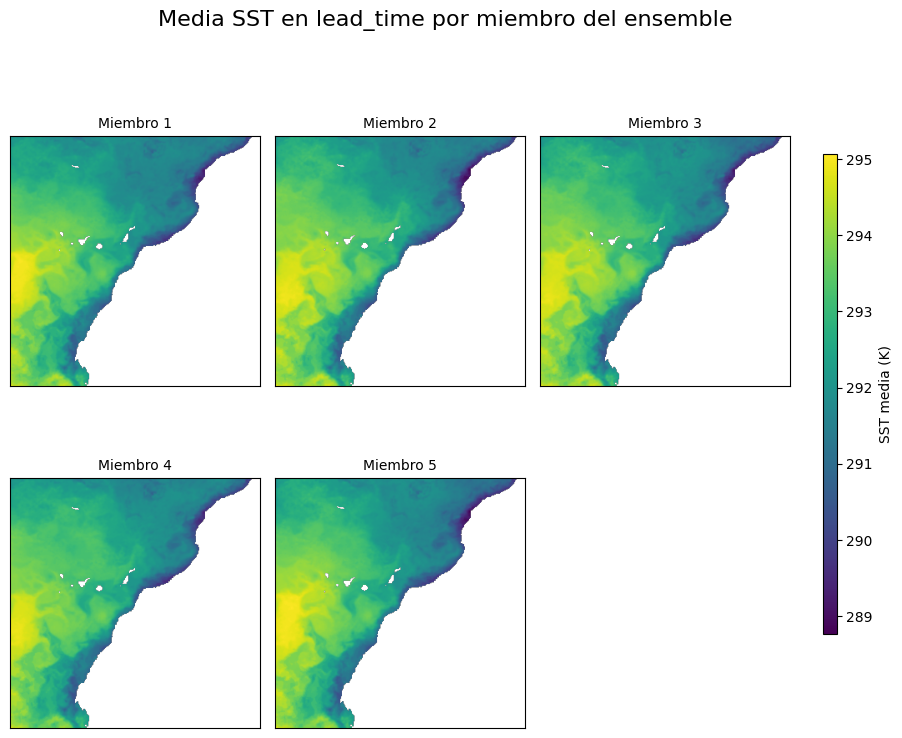

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


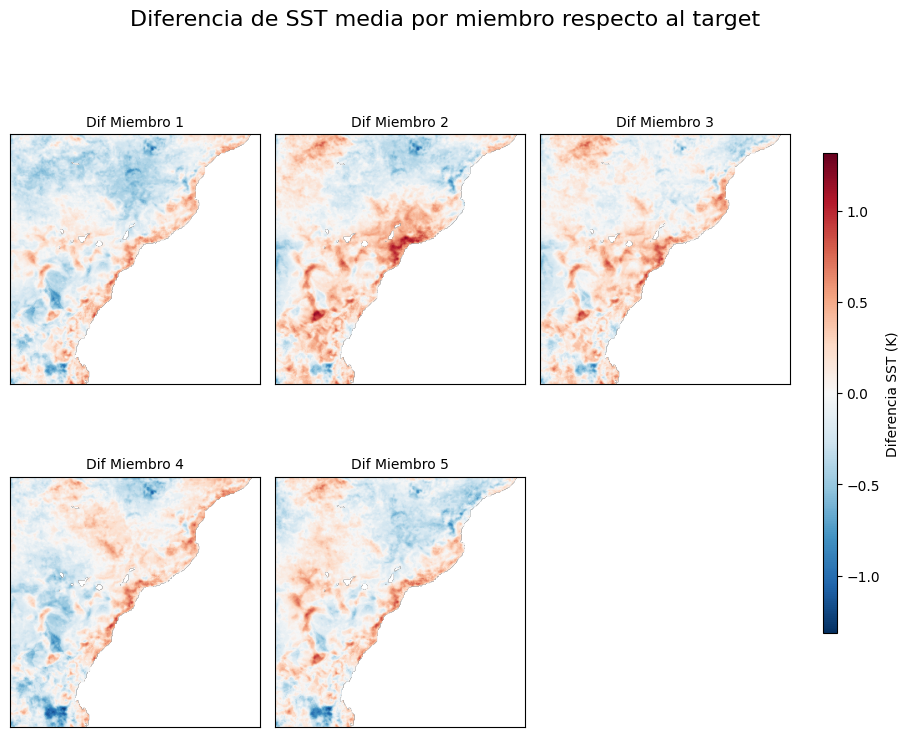

In [40]:
ensemble_perlin_fractal_3d_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d_1_3_3"))
ensemble_perlin_fractal_3d = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_3d_loaders)
ensemble_perlin_fractal_3d_dataset = ensemble_perlin_fractal_3d.build_ensemble()

statistics_perlin_fractal_3d_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_3d_dataset, targets_dataset)
aggregation_state_perlin_fractal_3d_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_3d_ens_5)
dataset_metrics_perlin_fractal_3d_ens_5 = aggregation_state_perlin_fractal_3d_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_3d_ens_5["lead_time"] = dataset_metrics_perlin_fractal_3d_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_fractal_3d_dataset)
plot_ensemble_differences(ensemble_perlin_fractal_3d_dataset, targets_dataset)

#### Cargando datos Perlin Fractal (2d) (15, 15) (False, True)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\run-20250623_134546-qusys4qj\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\run-20250623_134752-xqw3rjs7\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\run-20250623_134949-cfuo7ps2\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\run-20250623_135151-2q5onu8b\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\run-20250623_135534-apym829k\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


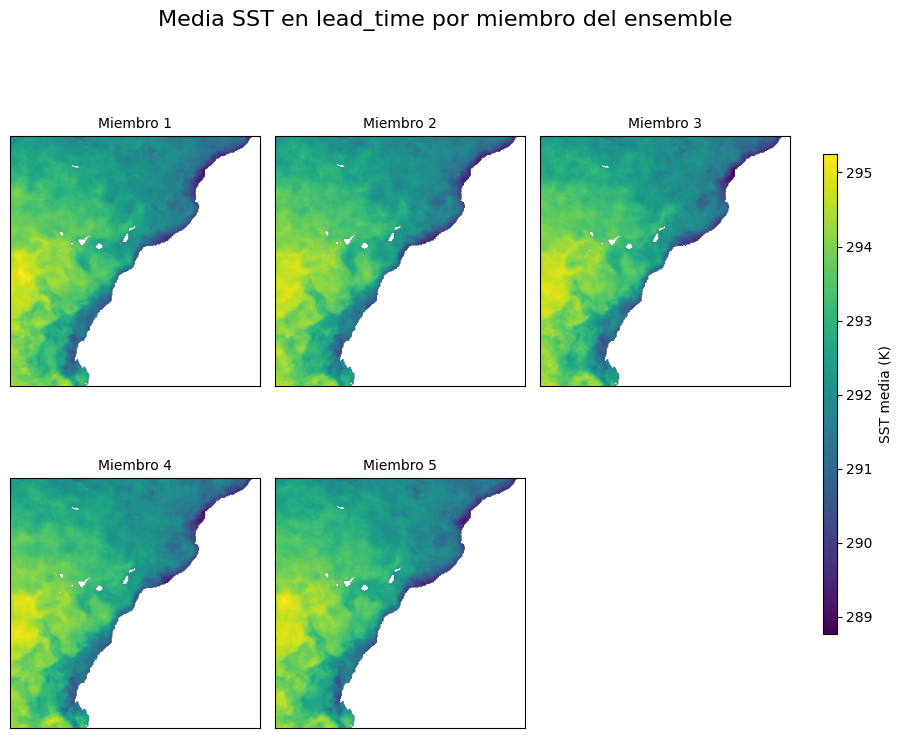

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


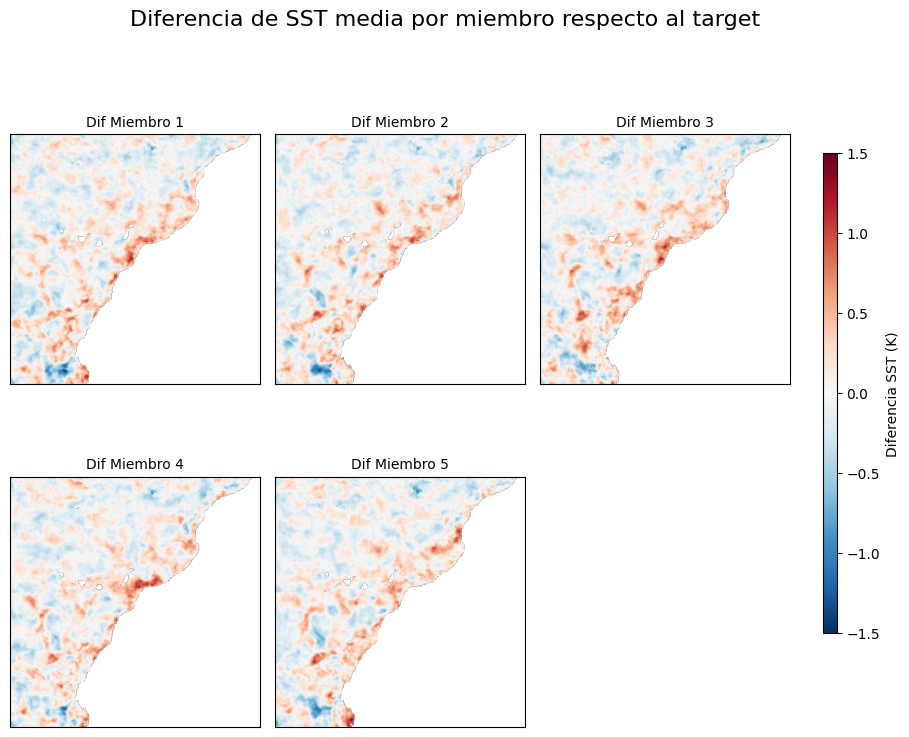

In [41]:
ensemble_perlin_fractal_2d_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d"))
ensemble_perlin_fractal_2d = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_2d_loaders)
ensemble_perlin_fractal_2d_dataset = ensemble_perlin_fractal_2d.build_ensemble()

statistics_perlin_fractal_2d_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_2d_dataset, targets_dataset)
aggregation_state_perlin_fractal_2d_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_ens_5)
dataset_metrics_perlin_fractal_2d_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_fractal_2d_ens_5)
dataset_metrics_perlin_fractal_2d_ens_5 = aggregation_state_perlin_fractal_2d_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_ens_5["lead_time"] = dataset_metrics_perlin_fractal_2d_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_fractal_2d_dataset)
plot_ensemble_differences(ensemble_perlin_fractal_2d_dataset, targets_dataset)

#### Cargando datos Perlin Fractal (2d) (5,5) (False, True)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\run-20250624_002625-sg0w33hd\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\run-20250624_002855-pafgxem9\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\run-20250624_003505-zinswqfc\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\run-20250624_003733-7i3mi8h8\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\run-20250624_004044-lbxhhwzz\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


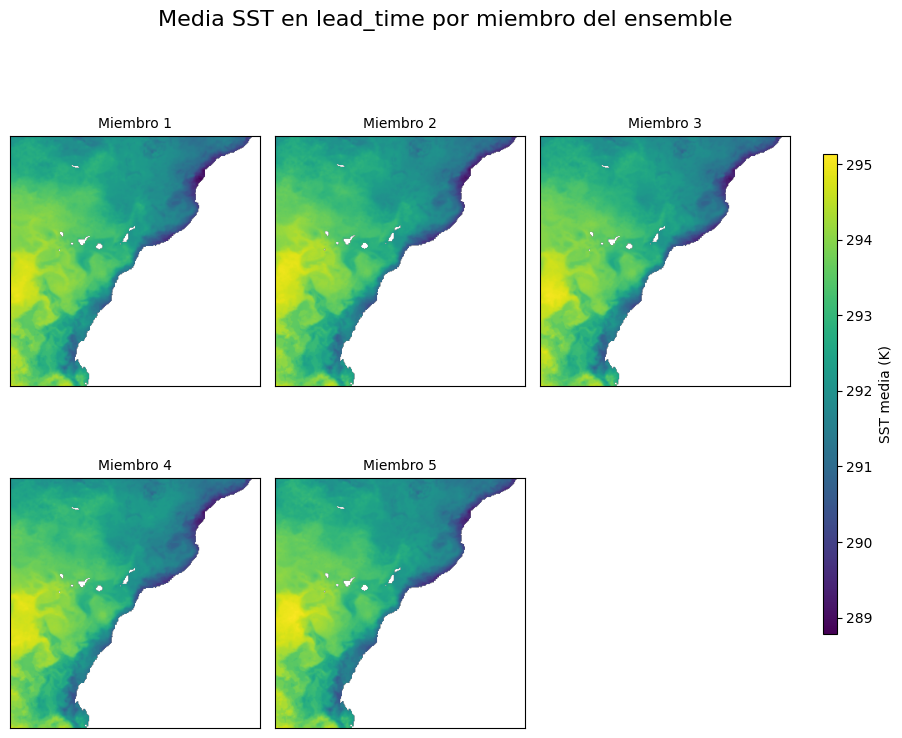

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


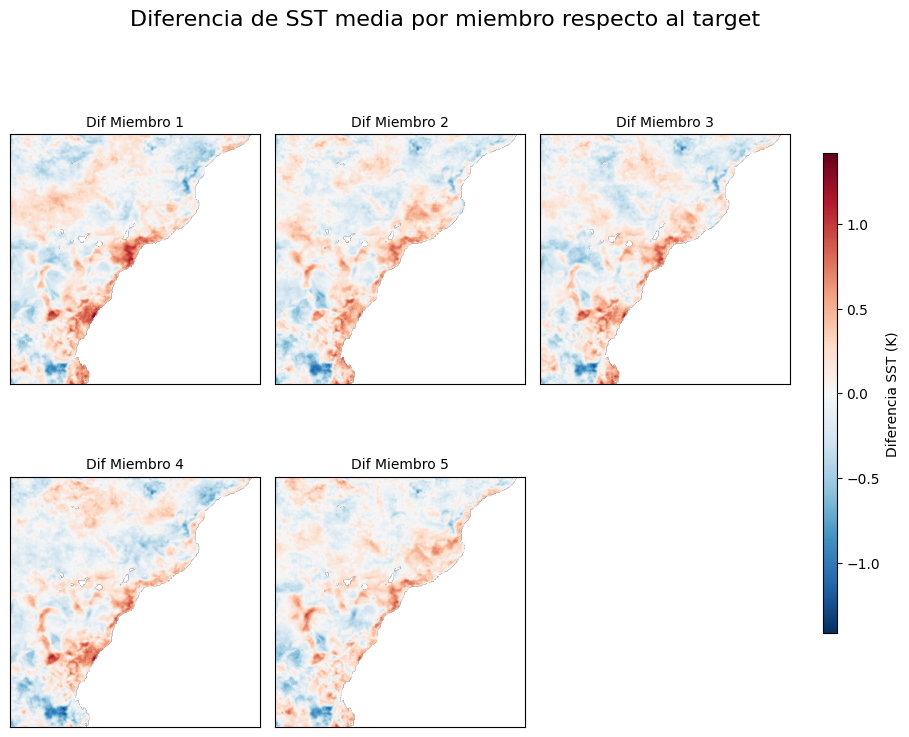

In [42]:
ensemble_perlin_fractal_2d_5_5_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5"))
ensemble_perlin_fractal_2d_5_5 = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_2d_5_5_loaders)
ensemble_perlin_fractal_2d_5_5_dataset = ensemble_perlin_fractal_2d_5_5.build_ensemble()

statistics_perlin_fractal_2d_5_5_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_2d_5_5_dataset, targets_dataset)
aggregation_state_perlin_fractal_2d_5_5_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_5_5_ens_5)
dataset_metrics_perlin_fractal_2d_5_5_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_fractal_2d_5_5_ens_5)
dataset_metrics_perlin_fractal_2d_5_5_ens_5 = aggregation_state_perlin_fractal_2d_5_5_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_5_5_ens_5["lead_time"] = dataset_metrics_perlin_fractal_2d_5_5_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_fractal_2d_5_5_dataset)
plot_ensemble_differences(ensemble_perlin_fractal_2d_5_5_dataset, targets_dataset)

#### Cargando datos Perlin Fractal (2 d) (15, 15) (False, False)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\run-20250624_103720-q0m4k9b8\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\run-20250624_103959-tkyipb2n\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\run-20250624_104335-0dkycw02\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\run-20250624_104615-e48xini7\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\run-20250624_104831-4jadplsq\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


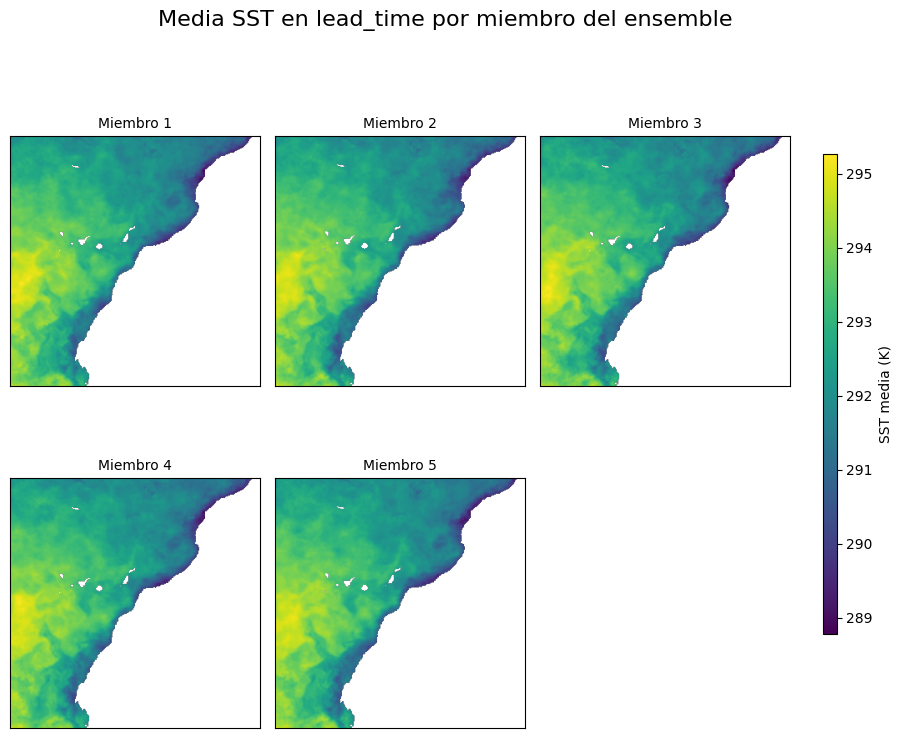

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


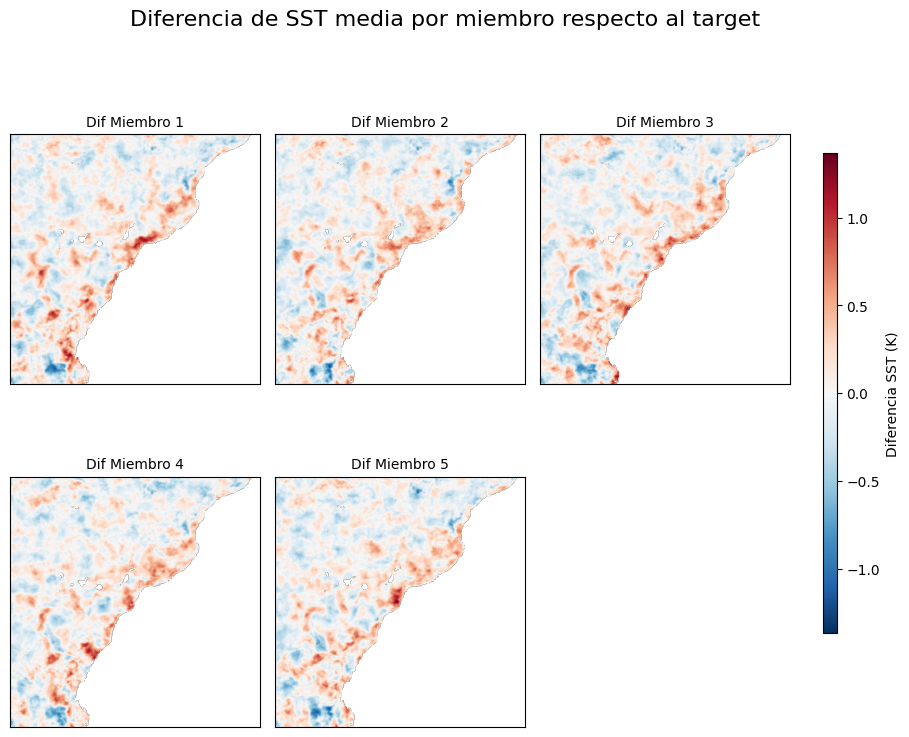

In [43]:
ensemble_perlin_fractal_2d_15_15_f_f = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f"))
ensemble_perlin_fractal_2d_15_15_f_f = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_2d_15_15_f_f)
ensemble_perlin_fractal_2d_15_15_f_f_dataset = ensemble_perlin_fractal_2d_15_15_f_f.build_ensemble()

statistics_perlin_fractal_2d_15_15_f_f_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_2d_15_15_f_f_dataset, targets_dataset)
aggregation_state_perlin_fractal_2d_15_15_f_f_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_f_ens_5)
dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_fractal_2d_15_15_f_f_ens_5)
dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5 = aggregation_state_perlin_fractal_2d_15_15_f_f_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_fractal_2d_15_15_f_f_dataset)
plot_ensemble_differences(ensemble_perlin_fractal_2d_15_15_f_f_dataset, targets_dataset)

#### Carga datos Perlin Fractal (2d) (15, 15) (0.05 escalabilidad) (False, True)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\run-20250624_110405-id7y39ch\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\run-20250624_111151-qctlgg5h\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\run-20250624_111446-d3bj7n50\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\run-20250624_111823-rqo7zw1u\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\run-20250624_112327-v0idukt5\files\predictions


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\980493060.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


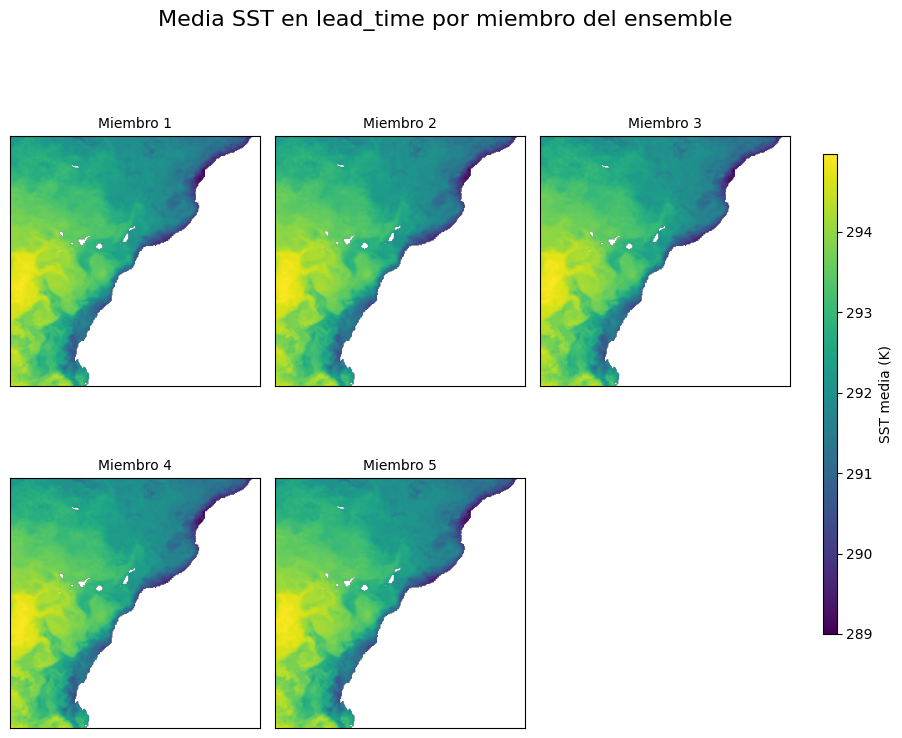

C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\3465621278.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


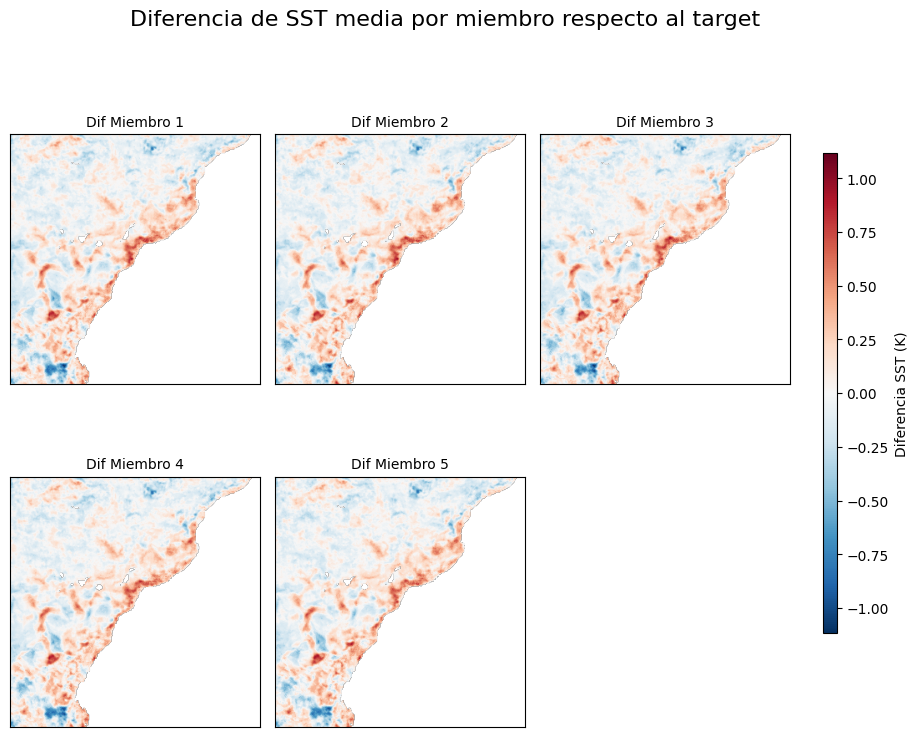

In [44]:
ensemble_perlin_fractal_2d_15_15_f_t_005 = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005"))
ensemble_perlin_fractal_2d_15_15_f_t_005 = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_2d_15_15_f_t_005)
ensemble_perlin_fractal_2d_15_15_f_t_005_dataset = ensemble_perlin_fractal_2d_15_15_f_t_005.build_ensemble()

statistics_perlin_fractal_2d_15_15_f_t_005_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_2d_15_15_f_t_005_dataset, targets_dataset)
aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_t_005_ens_5)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5_manual = get_metrics_probabilistic(aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_5)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5 = aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5["lead_time"].astype("timedelta64[D]")

plot_ensemble_mean_sst(ensemble_perlin_fractal_2d_15_15_f_t_005_dataset)
plot_ensemble_differences(ensemble_perlin_fractal_2d_15_15_f_t_005_dataset, targets_dataset)

#### Perlin Fractal (esc=0.4)

In [45]:
ensemble_perlin_fractal_2d_15_15_f_t_04 = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04"))
ensemble_perlin_fractal_2d_15_15_f_t_04 = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_2d_15_15_f_t_04)
ensemble_perlin_fractal_2d_15_15_f_t_04_dataset = ensemble_perlin_fractal_2d_15_15_f_t_04.build_ensemble()

statistics_perlin_fractal_2d_15_15_f_t_04_ens_5 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_2d_15_15_f_t_04_dataset, targets_dataset)
aggregation_state_perlin_fractal_2d_15_15_f_t_04_ens_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_t_04_ens_5)
dataset_metrics_perlin_fractal_2d_15_15_f_t_04_manual = get_metrics_probabilistic(aggregation_state_perlin_fractal_2d_15_15_f_t_04_ens_5)
dataset_metrics_perlin_fractal_2d_15_15_f_t_04_ens_5 = aggregation_state_perlin_fractal_2d_15_15_f_t_04_ens_5.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_t_04_ens_5["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_t_04_ens_5["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\run-20250722_215746-2lac6t1n\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\run-20250722_220106-f3m82wyh\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\run-20250722_220325-ylb686eu\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\run-20250722_220638-tjwxtguc\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\run-20250722_221007-62e6u312\files\predictions


### Comparación gráficas

##### Comparación entre Perlin

In [46]:
lead_days = (dataset_metrics_perlin_fractal_2d_ens_5["lead_time"] / np.timedelta64(1, "D")).values

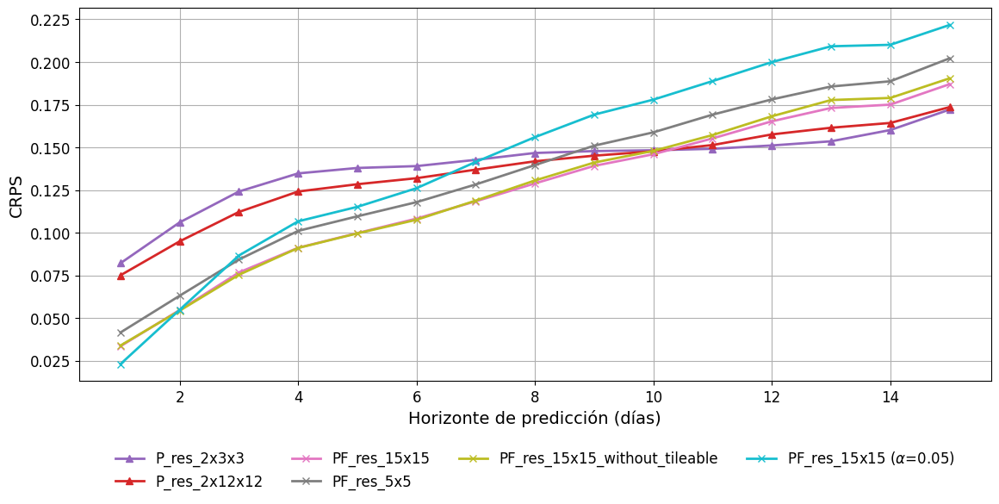

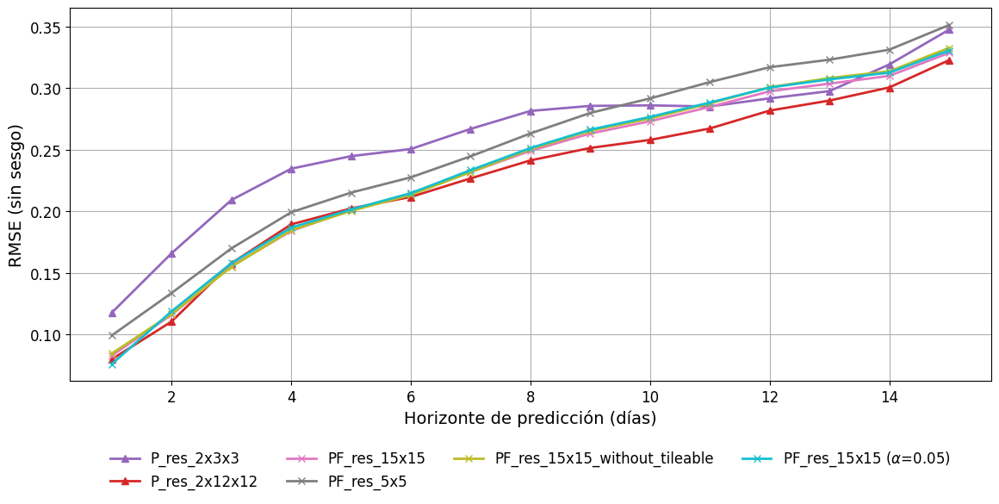

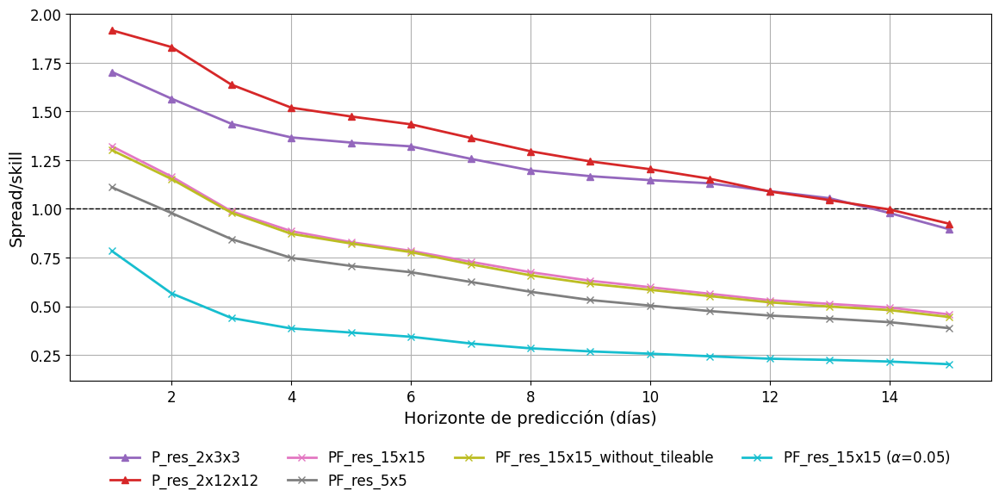

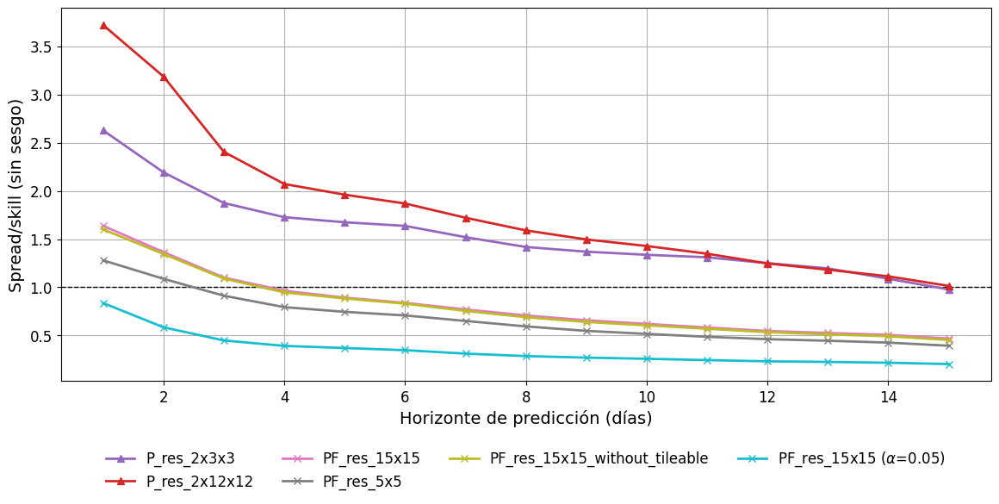

In [47]:
for metric in ["crps.sst_temperature", "rmse_unb.sst_temperature",
               "spread_skill_ratio.sst_temperature", "spread_skill_ratio_unb.sst_temperature"]:


    plt.figure(figsize=(12, 6))

    if metric == "spread_skill_ratio.sst_temperature" or metric == "spread_skill_ratio_unb.sst_temperature":
        plt.axhline(
            y=1,
            color="black",
            linestyle="--",
            linewidth=1,
        )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_3_3_ens_5[metric].mean(dim="init_time"),
        label="P_res_2x3x3",
        marker='^',
        color="#9467bd",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_ens_5[metric].mean(dim="init_time"),
        label="P_res_2x12x12",
        marker='^',
        color="#d62728",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_ens_5[metric].mean(dim="init_time"),
        label="PF_res_15x15",
        marker='x',
        color="#e377c2",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_5_5_ens_5[metric].mean(dim="init_time"),
        label="PF_res_5x5",
        marker='x',
        color="#7f7f7f",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5[metric].mean(dim="init_time"),
        label="PF_res_15x15_without_tileable",
        marker='x',
        color="#bcbd22",
        linewidth=2
    )
    
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5[metric].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.05)",
        marker='x',
        color="#17becf",
        linewidth=2
    )

    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/perlin/5_ens_prob_{metric.replace('.', '_')}_without_weight.svg", format='svg')
    plt.show()

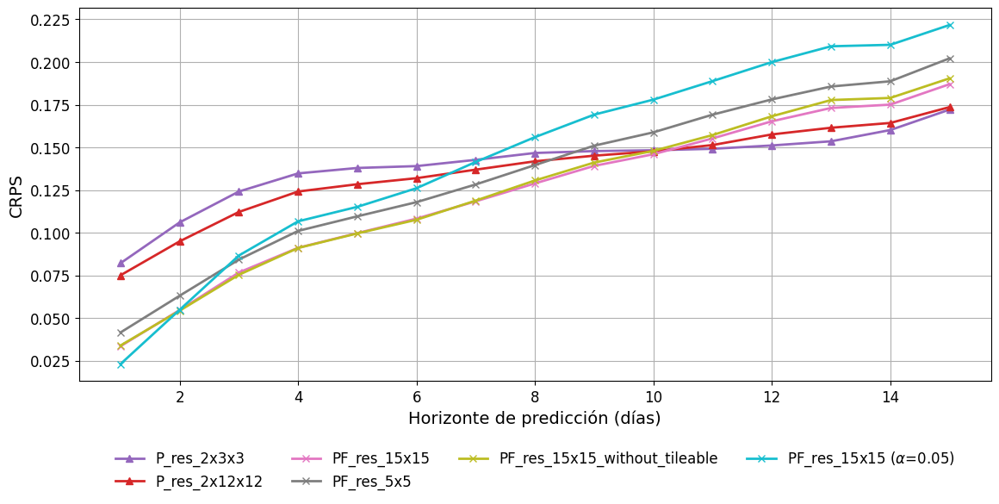

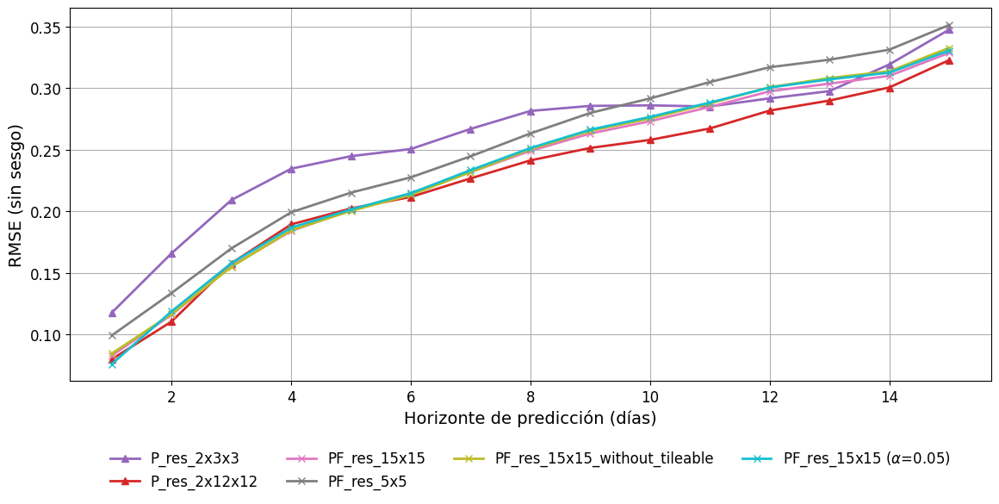

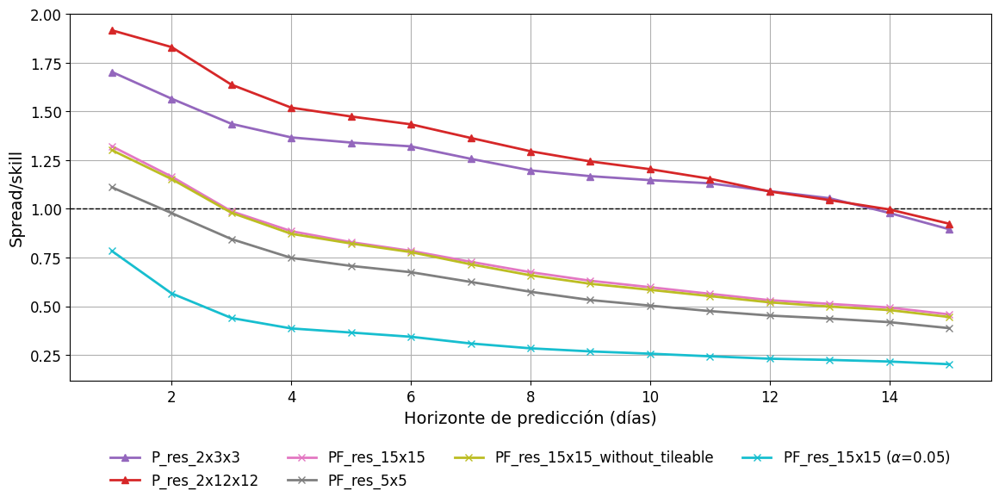

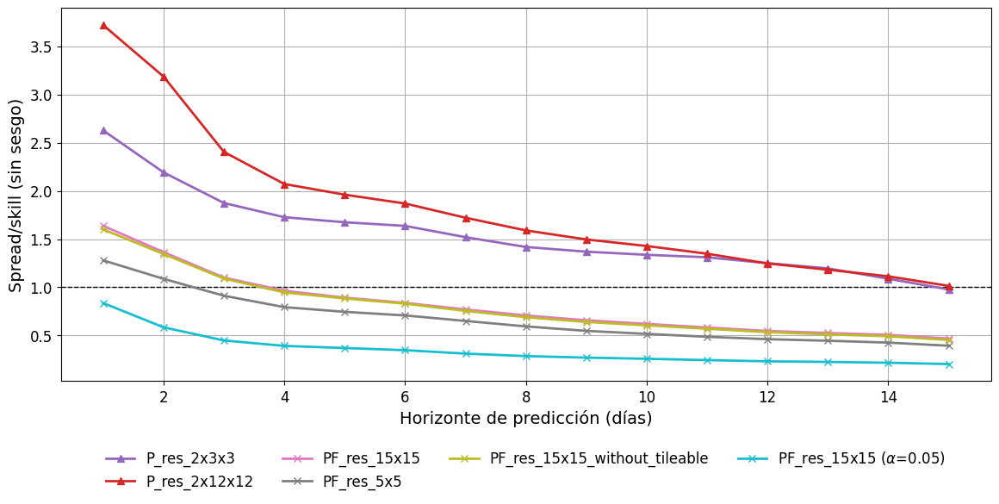

In [48]:
for metric in ["crps.sst_temperature", "rmse_unb.sst_temperature",
               "spread_skill_ratio.sst_temperature", "spread_skill_ratio_unb.sst_temperature"]:


    plt.figure(figsize=(12, 6))

    if metric == "spread_skill_ratio.sst_temperature" or metric == "spread_skill_ratio_unb.sst_temperature":
        plt.axhline(
            y=1,
            color="black",
            linestyle="--",
            linewidth=1,
        )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_3_3_ens_5_manual[metric].mean(dim="init_time"),
        label="P_res_2x3x3",
        marker='^',
        color="#9467bd",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_ens_5_manual[metric].mean(dim="init_time"),
        label="P_res_2x12x12",
        marker='^',
        color="#d62728",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_ens_5_manual[metric].mean(dim="init_time"),
        label="PF_res_15x15",
        marker='x',
        color="#e377c2",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_5_5_ens_5_manual[metric].mean(dim="init_time"),
        label="PF_res_5x5",
        marker='x',
        color="#7f7f7f",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5_manual[metric].mean(dim="init_time"),
        label="PF_res_15x15_without_tileable",
        marker='x',
        color="#bcbd22",
        linewidth=2
    )
    
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5_manual[metric].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.05)",
        marker='x',
        color="#17becf",
        linewidth=2
    )


    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/perlin/5_ens_prob_{metric.replace('.', '_')}_manual.svg", format='svg')
    plt.show()

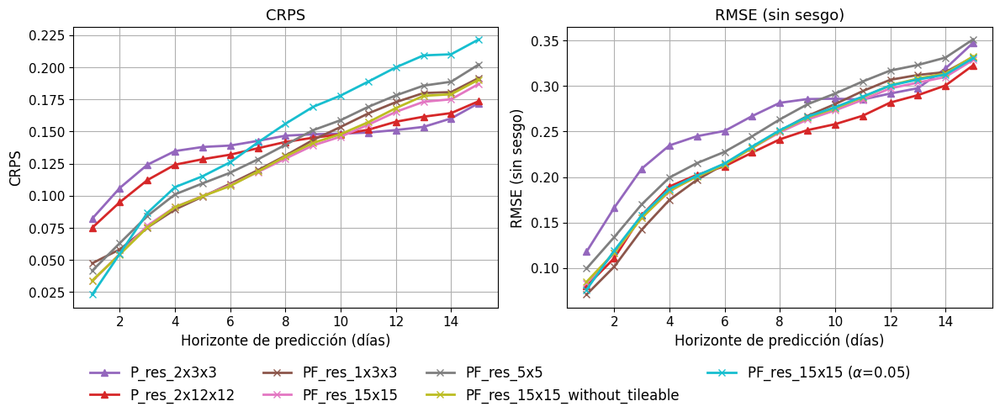

In [49]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

metrics = [
    ("crps.sst_temperature", "CRPS"),
    ("rmse_unb.sst_temperature", "RMSE (sin sesgo)"),
]

colors = {
    "P_res_2x3x3": "#9467bd",
    "P_res_2x12x12": "#d62728",
    "PF_res_1x3x3": "#8c564b",
    "PF_res_15x15": "#e377c2",
    "PF_res_5x5": "#7f7f7f",
    "PF_res_15x15_without_tileable": "#bcbd22",
    r"PF_res_15x15 ($\alpha$=0.05)": "#17becf",
}

datasets = {
    "P_res_2x3x3": dataset_metrics_perlin_3_3_ens_5,
    "P_res_2x12x12": dataset_metrics_perlin_ens_5,
    "PF_res_1x3x3": dataset_metrics_perlin_fractal_3d_ens_5,
    "PF_res_15x15": dataset_metrics_perlin_fractal_2d_ens_5,
    "PF_res_5x5": dataset_metrics_perlin_fractal_2d_5_5_ens_5,
    "PF_res_15x15_without_tileable": dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5,
    r"PF_res_15x15 ($\alpha$=0.05)": dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5,
}

markers = {
    "P_res_2x3x3": '^',
    "P_res_2x12x12": '^',
    "PF_res_1x3x3": 'x',
    "PF_res_15x15": 'x',
    "PF_res_5x5": 'x',
    "PF_res_15x15_without_tileable": 'x',
    r"PF_res_15x15 ($\alpha$=0.05)": 'x',
}

fig = plt.figure(figsize=(12, 5))
gs = gridspec.GridSpec(1, 2)

for idx, (metric, title) in enumerate(metrics):
    ax = fig.add_subplot(gs[0, idx])

    if "spread_skill_ratio" in metric:
        ax.axhline(y=1, color="black", linestyle="--", linewidth=1)

    for label, dataset in datasets.items():
        data = dataset[metric].mean(dim="init_time")
        ax.plot(
            lead_days,
            data,
            label=label,
            marker=markers[label],
            linewidth=2,
            color=colors[label],
        )

    ax.set_xlabel("Horizonte de predicción (días)", fontsize=12)
    ax.set_ylabel(dict_metric_names[metric], fontsize=12)
    ax.tick_params(axis='both', labelsize=11)
    ax.grid(True)
    ax.set_title(title, fontsize=13)

handles, labels = ax.get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='lower center',
    fontsize=12,
    ncol=4,
    frameon=False,
    bbox_to_anchor=(0.5, -0.05)
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])
plt.savefig("metrics/perlin/comparacion_metricas_probabilisticas.svg", format='svg')
plt.show()

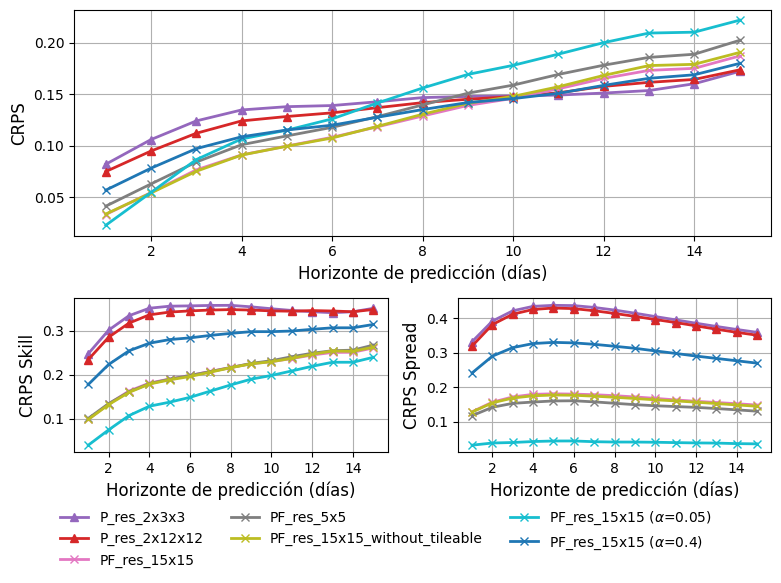

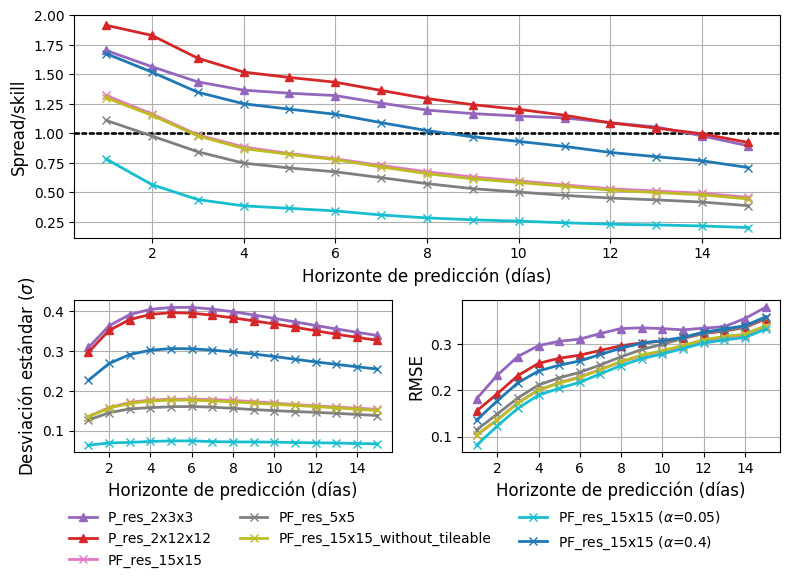

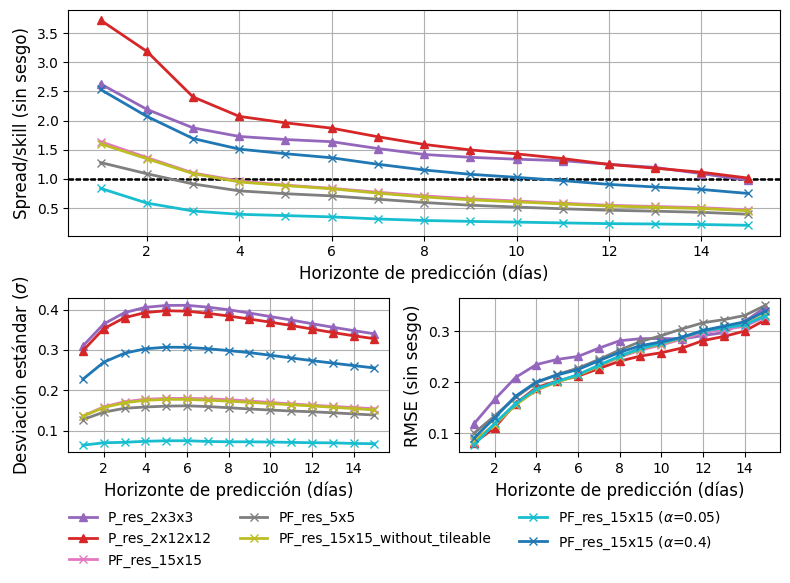

In [50]:
from matplotlib.ticker import MaxNLocator

for main_metric, stat_metrics in metrics_with_stats.items():
    if len(stat_metrics) < 2:
        continue
    
    n_stats = len(stat_metrics)

    fig = plt.figure(figsize=(4 * max(n_stats, 1), 6.5))
    gs = gridspec.GridSpec(2, n_stats, height_ratios=[2.2, 1.5], figure=fig)

    ax_main = fig.add_subplot(gs[0, :])
    for dataset, label, color, marker in [
        (dataset_metrics_perlin_3_3_ens_5, "P_res_2x3x3", "#9467bd", '^'),
        (dataset_metrics_perlin_ens_5, "P_res_2x12x12", "#d62728", '^'),
        (dataset_metrics_perlin_fractal_2d_ens_5, "PF_res_15x15", "#e377c2", 'x'),
        (dataset_metrics_perlin_fractal_2d_5_5_ens_5, "PF_res_5x5", "#7f7f7f", 'x'),
        (dataset_metrics_perlin_fractal_2d_15_15_f_f_ens_5, "PF_res_15x15_without_tileable", "#bcbd22", 'x'),
        (dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5, r"PF_res_15x15 ($\alpha$=0.05)", "#17becf", 'x'),
        (dataset_metrics_perlin_fractal_2d_15_15_f_t_04_ens_5, "PF_res_15x15 ($\alpha$=0.4)", "#1f77b4", 'x')
    ]:

        ax_main.plot(
            lead_days,
            dataset[main_metric].mean(dim="init_time"),
            label=label,
            marker=marker,
            color=color,
            linewidth=2,
            zorder = 5
        )

        if main_metric == "spread_skill_ratio.sst_temperature" or main_metric == "spread_skill_ratio_unb.sst_temperature":
            ax_main.axhline(y=1, color="black", linestyle="--", linewidth=1, zorder = 2)
            
    ax_main.set_ylabel(dict_metric_names[main_metric], fontsize=12)
    ax_main.set_xlabel("Horizonte de predicción (días)", fontsize=12)
    ax_main.grid()

    axs_stats = []
    for i, stat_metric in enumerate(stat_metrics):
        ax_stat = fig.add_subplot(gs[1, i])
        axs_stats.append(ax_stat)

        for dataset, label, color, marker in [
            (aggregation_state_perlin_3_3_ens_5.mean_statistics(), "P_res_2x3x3", "#9467bd", '^'),
            (aggregation_state_perlin_ens_5.mean_statistics(), "P_res_2x12x12", "#d62728", '^'),
            (aggregation_state_perlin_fractal_2d_ens_5.mean_statistics(), "PF_res_15x15", "#e377c2", 'x'),
            (aggregation_state_perlin_fractal_2d_5_5_ens_5.mean_statistics(), "PF_res_5x5", "#7f7f7f", 'x'),
            (aggregation_state_perlin_fractal_2d_15_15_f_f_ens_5.mean_statistics(), "PF_res_15x15_without_tileable", "#bcbd22", 'x'),
            (aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_5.mean_statistics(), r"PF_res_15x15 ($\alpha$=0.05)", "#17becf", 'x'),
            (aggregation_state_perlin_fractal_2d_15_15_f_t_04_ens_5.mean_statistics(), r"PF_res_15x15 ($\alpha$=0.4)", "#1f77b4", 'x')
        ]:
            
            values = dataset[stat_metric]["sst_temperature"].mean(dim="init_time")
            if stat_metric in sqrt_stats:
                values = np.sqrt(values)
            
            ax_stat.plot(
                lead_days,
                values,
                label=label,
                marker=marker,
                color=color,
                linewidth=2,
            )

        if "spread_skill_ratio" in stat_metric:
            ax_stat.axhline(y=1, color="black", linestyle="--", linewidth=1)
        
        ax_stat.xaxis.set_major_locator(MaxNLocator(integer=True))
        ax_stat.set_ylabel(dict_statistic_names[stat_metric], fontsize=12)
        ax_stat.grid()
        ax_stat.set_xlabel("Horizonte de predicción (días)", fontsize=12)
        ax_stat.tick_params(axis='both', labelsize=10)

    handles, labels = axs_stats[0].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    fig.legend(by_label.values(), by_label.keys(), loc='lower center', ncol=3, frameon=False, fontsize=10, bbox_to_anchor=(0.5, 0.05))

    plt.tight_layout(rect=[0, 0.15, 1, 0.95])

    plt.savefig(f"metrics/perlin/ensemble_metrics_{main_metric.split('.')[0]}_with_stats_separate.svg", format='svg')
    plt.show()

Procesando dataset: P_res_2x3x3
Procesando dataset: P_res_2x12x12
Procesando dataset: PF_res_1x3x3


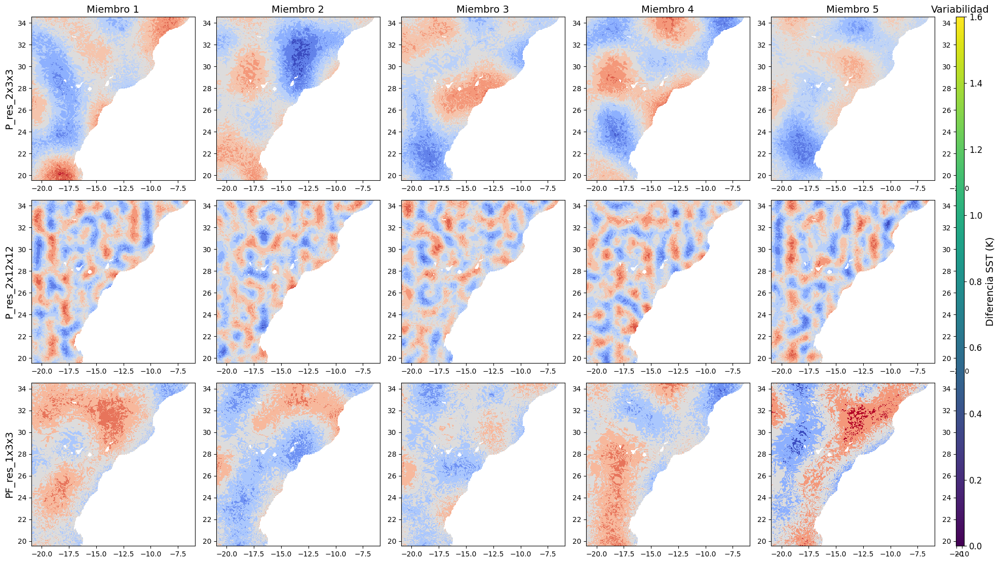

In [51]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

datasets = {
    "P_res_2x3x3": ensemble_perlin_3_3_dataset,
    "P_res_2x12x12": ensemble_perlin_dataset,
    "PF_res_1x3x3": ensemble_perlin_fractal_3d_dataset,
    #"PF_res_15x15": ensemble_perlin_fractal_2d_dataset,
    #"PF_res_5x5": ensemble_perlin_fractal_2d_5_5_dataset,
    #"PF_res_15x15_without_tileable": ensemble_perlin_fractal_2d_15_15_f_f_dataset,
    #r"PF_res_15x15 ($\alpha$=0.05)": #ensemble_perlin_fractal_2d_15_15_f_t_005_dataset
}

target = targets_dataset
target_sst = target["sst_temperature"].sel(lead_time="1 days")

n_ensembles = len(datasets)
n_members = 5

fig = plt.figure(figsize=(4 * n_members + 1, 4 * n_ensembles))
gs = gridspec.GridSpec(nrows=n_ensembles, ncols=n_members + 1, width_ratios=[1]*n_members + [0.05], figure=fig)

axes = []
for i in range(n_ensembles):
    row_axes = []
    for j in range(n_members):
        ax = fig.add_subplot(gs[i, j])
        row_axes.append(ax)
    axes.append(row_axes)

for row_idx, (label, ds) in enumerate(datasets.items()):
    print(f"Procesando dataset: {label}")
    sst = ds["sst_temperature"].sel(lead_time="1 days")
    is_ensemble = "number" in sst.dims

    ensemble_mean = sst.mean(dim="number")
    variabilidad = np.abs(sst - ensemble_mean).sum(dim="number")
    variabilidad_mean = variabilidad.mean(dim="init_time")

    for col_idx in range(n_members):
        ax = axes[row_idx][col_idx]

        if is_ensemble:
            member_data = sst.sel(number=col_idx)
            diff = target_sst - member_data
        else:
            diff = np.sqrt((sst - target_sst) ** 2)

        diff_mean = diff.mean(dim="init_time")

        im = diff_mean.plot(
            ax=ax,
            cmap="coolwarm",
            add_colorbar=False,
            add_labels=False,
        )

        ax.set_xlabel("")
        ax.set_ylabel("")

        if row_idx == 0:
            ax.set_title(f"Miembro {col_idx+1}", fontsize=14)
        if col_idx == 0:
            ax.set_ylabel(label, fontsize=14)

    ax_var = fig.add_subplot(gs[row_idx, n_members])
    im = variabilidad_mean.plot(
        ax=ax_var,
        cmap="viridis",
        add_colorbar=False,
        add_labels=False,
    )
    ax_var.set_xlabel("")
    ax_var.set_ylabel("")
    if row_idx == 0:
        ax_var.set_title("Variabilidad", fontsize=14)

cbar_ax = fig.add_subplot(gs[:, -1])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical', label="Diferencia SST (K)")
cbar.ax.yaxis.label.set_size(14)
cbar.ax.tick_params(labelsize=12)

plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

##### Comparación estadísticas

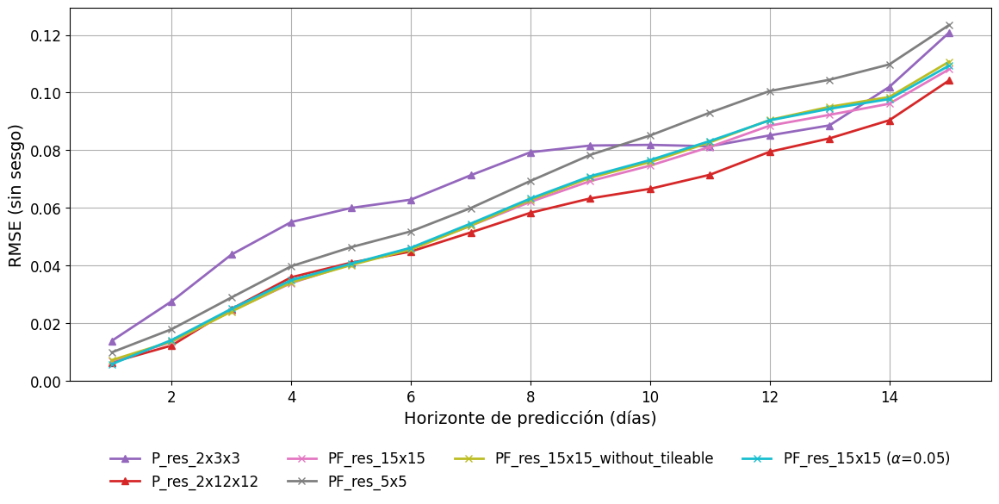

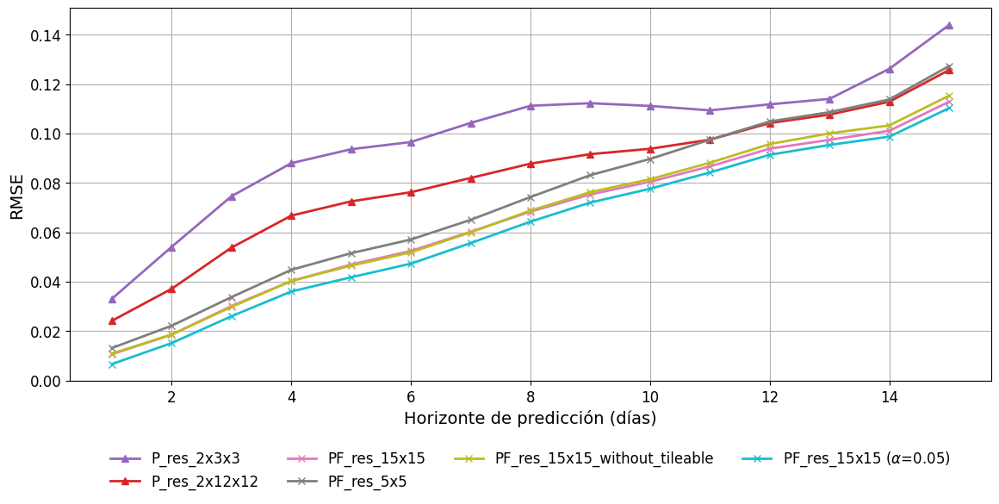

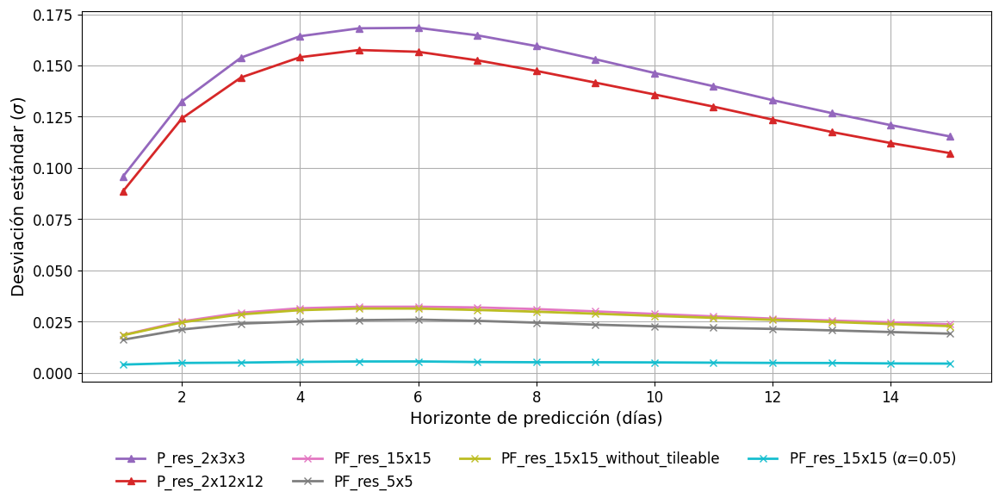

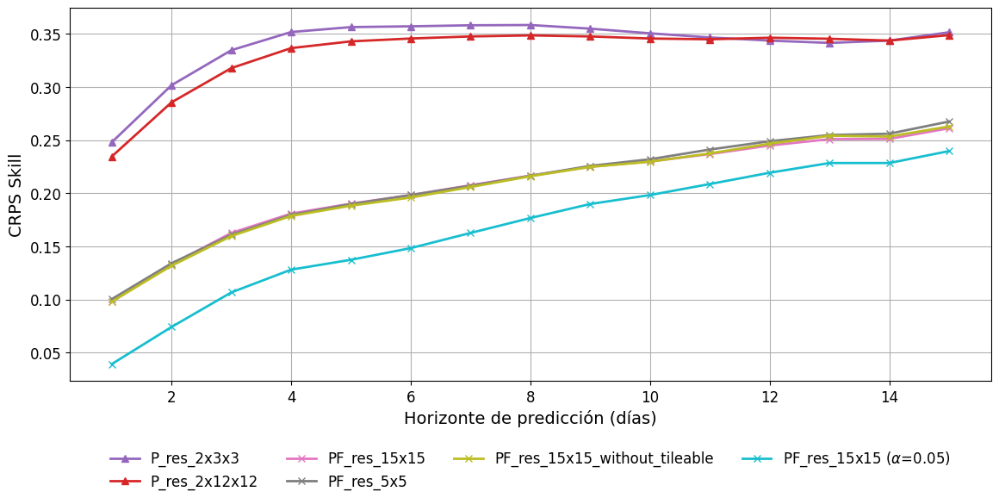

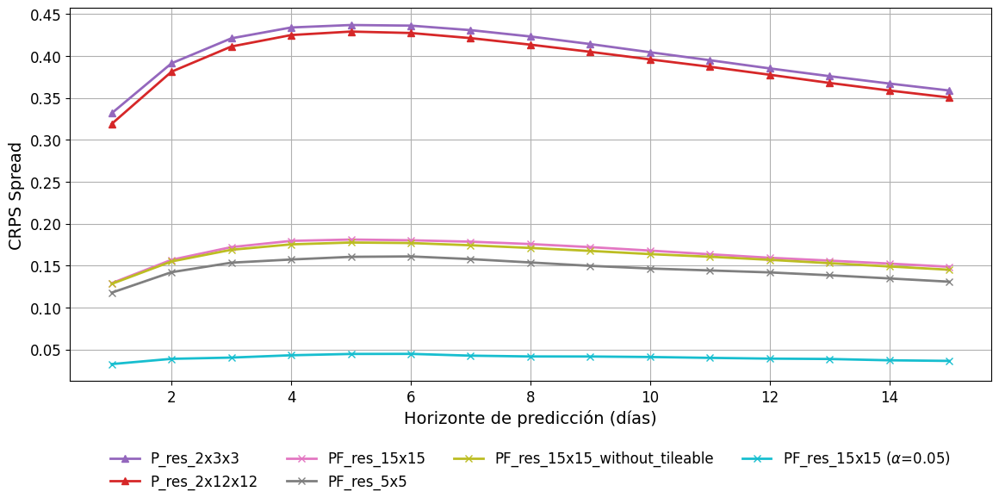

In [52]:
for statistic in ["UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True", "SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True", "EnsembleVariance_number_skipna_ensemble_True", "CRPSSkill_number", "CRPSSpread_number_fair_predictions"]:   

    plt.figure(figsize=(12, 6))

    plt.plot(
        lead_days,
        aggregation_state_perlin_3_3_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="P_res_2x3x3",
        marker='^',
        color="#9467bd",
        linewidth=2
    )

    plt.plot(
        lead_days,
        aggregation_state_perlin_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="P_res_2x12x12",
        marker='^',
        color="#d62728",
        linewidth=2
    )

    plt.plot(
        lead_days,
        aggregation_state_perlin_fractal_2d_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="PF_res_15x15",
        marker='x',
        color="#e377c2",
        linewidth=2
    )

    plt.plot(
        lead_days,
        aggregation_state_perlin_fractal_2d_5_5_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="PF_res_5x5",
        marker='x',
        color="#7f7f7f",
        linewidth=2
    )

    plt.plot(
        lead_days,
        aggregation_state_perlin_fractal_2d_15_15_f_f_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="PF_res_15x15_without_tileable",
        marker='x',
        color="#bcbd22",
        linewidth=2
    )

    plt.plot(
        lead_days,
        aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.05)",
        marker='x',
        color="#17becf",
        linewidth=2
    )

    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_statistic_names[statistic], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/perlin/5_ens_prob_{statistic.replace('.', '_')}_statistic.svg", format='svg')
    plt.show()   

##### Comparaciones para ruido gaussiano

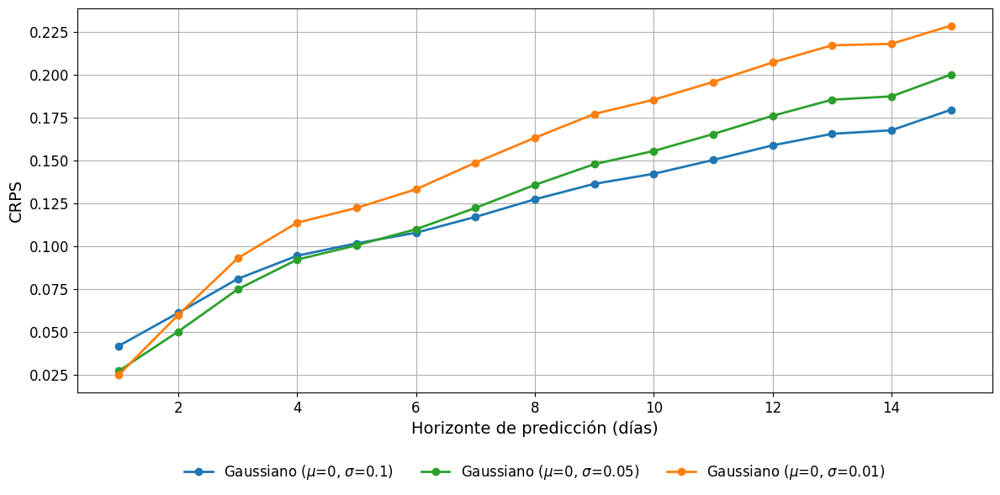

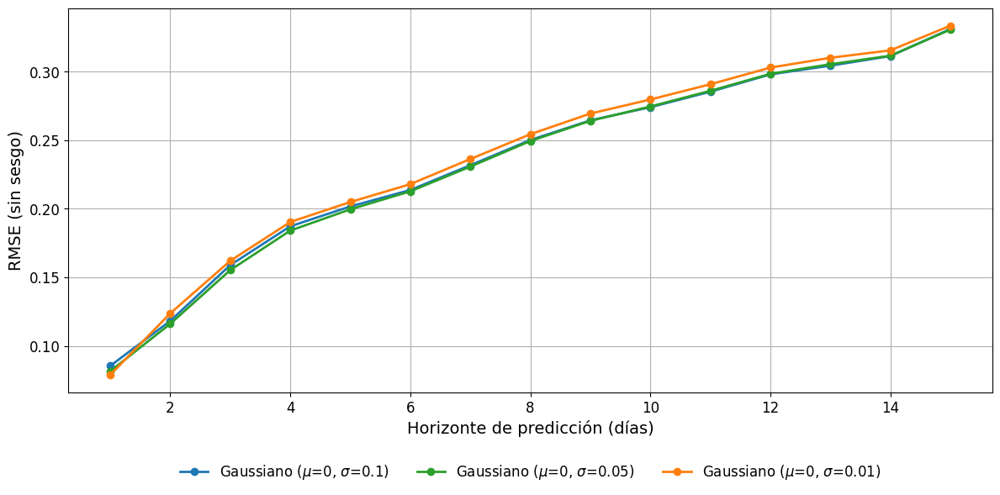

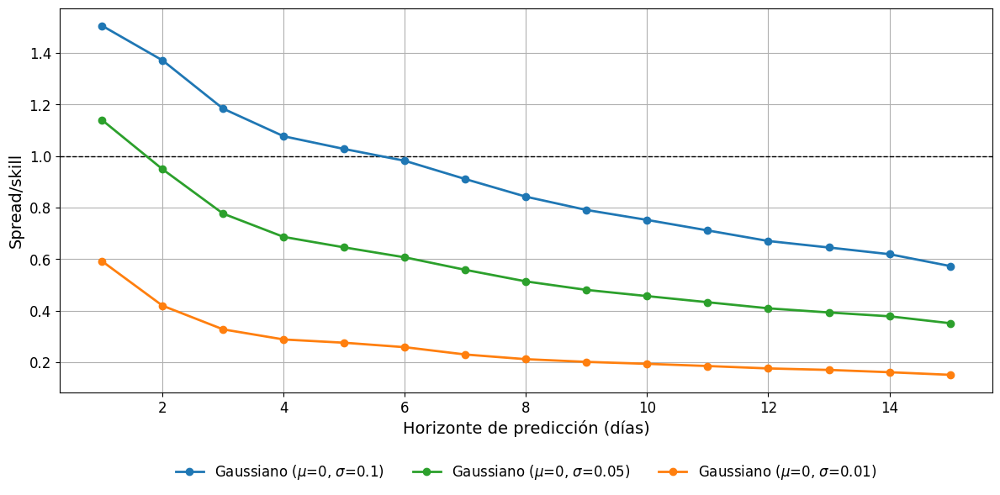

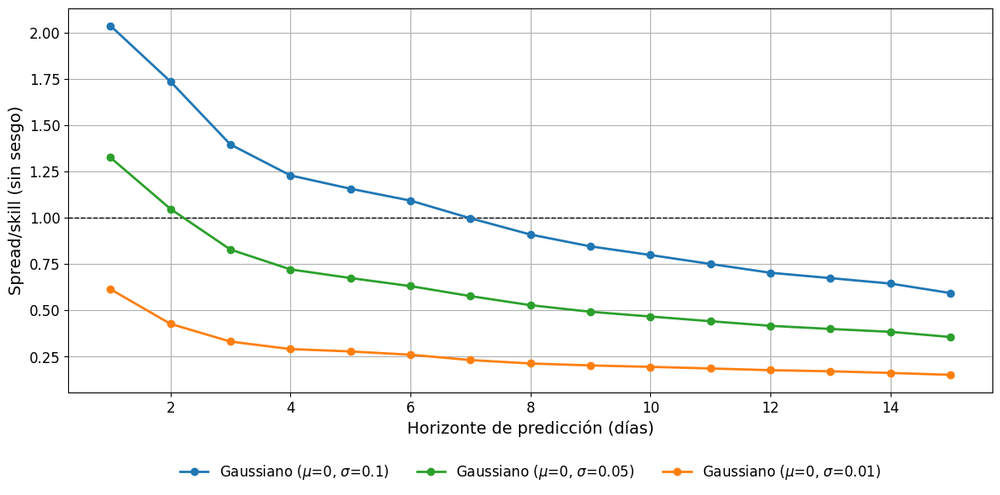

In [53]:
for metric in ["crps.sst_temperature", "rmse_unb.sst_temperature",
               "spread_skill_ratio.sst_temperature", "spread_skill_ratio_unb.sst_temperature"]:

    plt.figure(figsize=(12, 6))

    if metric == "spread_skill_ratio.sst_temperature" or metric == "spread_skill_ratio_unb.sst_temperature":
        plt.axhline(
            y=1,
            color="black",
            linestyle="--",
            linewidth=1,
        )

    plt.plot(
        lead_days,
        dataset_metrics_gaussian_01_ens_5[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.1)",
        marker='o',
        color="#1f77b4",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_005_ens_5[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.05)",
        marker='o',
        color="#2ca02c",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_001_ens_5[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.01)",
        marker='o',
        color="#ff7f0e",
        linewidth=2
    )


    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/gaussian/5_ens_prob_{metric.replace('.', '_')}_without_weight.svg", format='svg')
    plt.show()

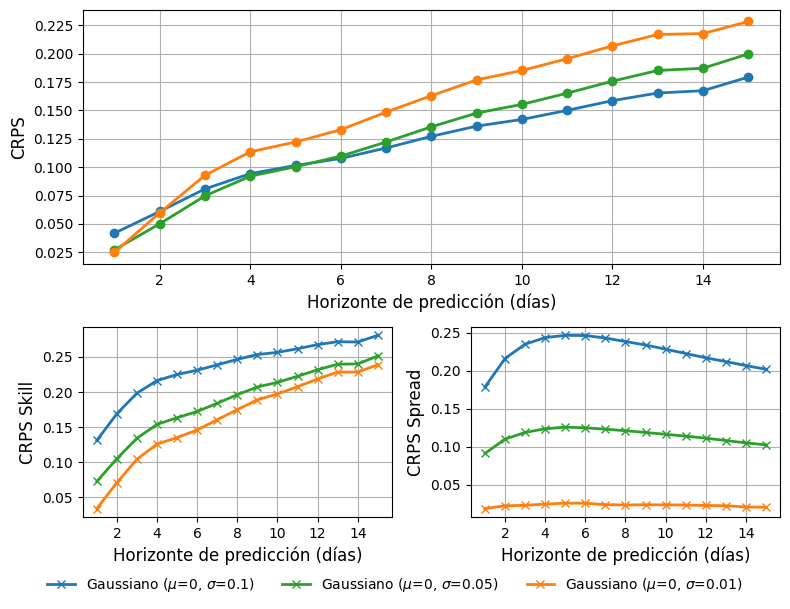

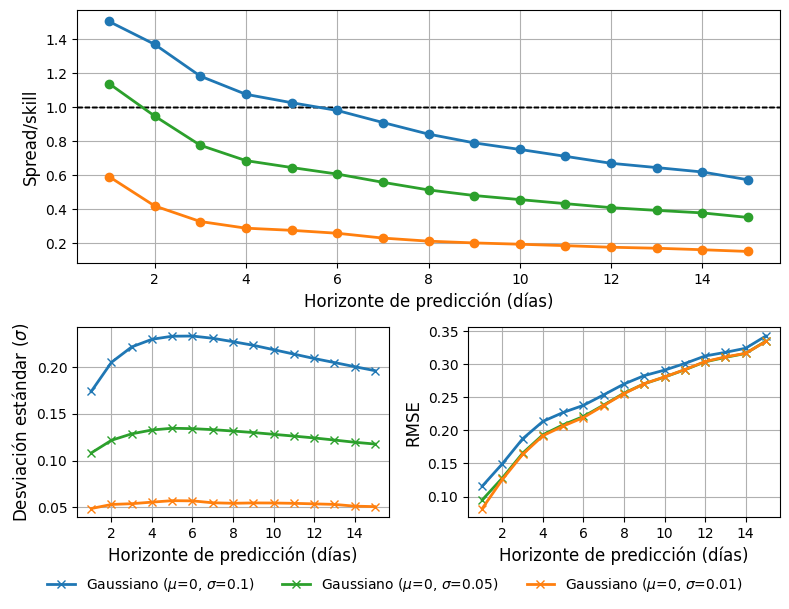

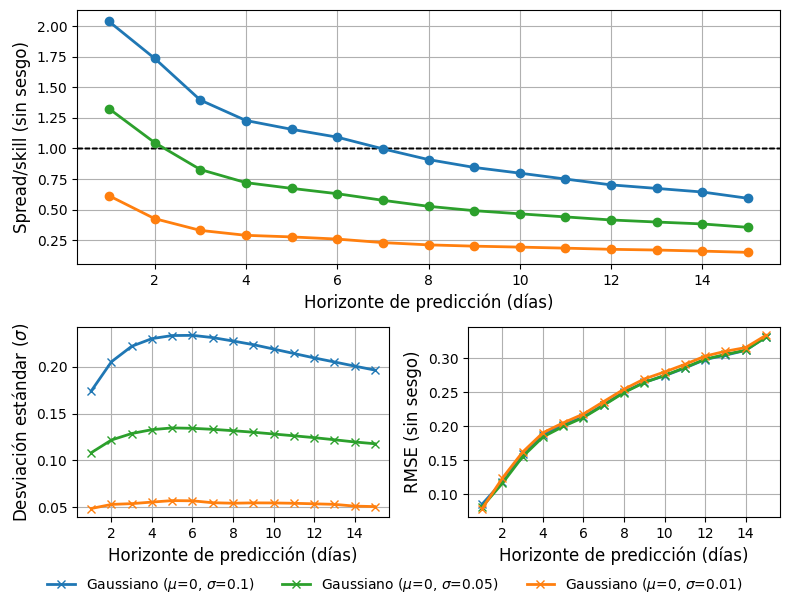

In [54]:
from matplotlib.ticker import MaxNLocator

for main_metric, stat_metrics in metrics_with_stats.items():
    if len(stat_metrics) < 2:
        continue
    
    n_stats = len(stat_metrics)

    fig = plt.figure(figsize=(4 * max(n_stats, 1), 6.5))
    gs = gridspec.GridSpec(2, n_stats, height_ratios=[2, 1.5], figure=fig)


    ax_main = fig.add_subplot(gs[0, :])
    for dataset, label, color in [
        (dataset_metrics_gaussian_01_ens_5, "Gaussiano ($\mu$=0, $\sigma$=0.1)", "#1f77b4"),
        (dataset_metrics_gaussian_005_ens_5, "Gaussiano ($\mu$=0, $\sigma$=0.05)", "#2ca02c"),
        (dataset_metrics_gaussian_001_ens_5, "Gaussiano ($\mu$=0, $\sigma$=0.01)", "#ff7f0e"),
    ]:
        if main_metric == "spread_skill_ratio.sst_temperature" or main_metric == "spread_skill_ratio_unb.sst_temperature":
            ax_main.axhline(y=1, color="black", linestyle="--", linewidth=1, zorder = 2)
            
        ax_main.plot(
            lead_days,
            dataset[main_metric].mean(dim="init_time"),
            label=label,
            marker='o',
            color=color,
            linewidth=2,
            zorder = 5
        )
    ax_main.set_ylabel(dict_metric_names[main_metric], fontsize=12)
    ax_main.set_xlabel("Horizonte de predicción (días)", fontsize=12)
    ax_main.grid()

    axs_stats = []
    for i, stat_metric in enumerate(stat_metrics):
        ax_stat = fig.add_subplot(gs[1, i])
        axs_stats.append(ax_stat)

        for dataset, label, color in [
            (aggregation_state_gaussian_01_ens_5.mean_statistics(), "Gaussiano ($\mu$=0, $\sigma$=0.1)", "#1f77b4"),
            (aggregation_state_gaussian_005_ens_5.mean_statistics(), "Gaussiano ($\mu$=0, $\sigma$=0.05)", "#2ca02c"),
            (aggregation_state_gaussian_001_ens_5.mean_statistics(), "Gaussiano ($\mu$=0, $\sigma$=0.01)", "#ff7f0e"),
        ]:
            values = dataset[stat_metric]["sst_temperature"].mean(dim="init_time")
            if stat_metric in sqrt_stats:
                values = np.sqrt(values)
                
            ax_stat.plot(
                lead_days,
                values,
                label=label,
                marker=marker,
                color=color,
                linewidth=2,
            )
        
        ax_stat.xaxis.set_major_locator(MaxNLocator(integer=True))
        ax_stat.set_ylabel(dict_statistic_names[stat_metric], fontsize=12)
        ax_stat.grid()
        ax_stat.set_xlabel("Horizonte de predicción (días)", fontsize=12)
        ax_stat.tick_params(axis='both', labelsize=10)

    handles, labels = axs_stats[0].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    fig.legend(by_label.values(), by_label.keys(), loc='lower center', ncol=3, frameon=False, fontsize=10, bbox_to_anchor=(0.5, 0.01))

    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.savefig(f"metrics/gaussian/ensemble_metrics_{main_metric.split('.')[0]}_with_stats_separate.svg", format='svg')
    plt.show()

In [55]:
get_skill_spread_ratio_manual

{'crps': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 30B
  array([[0.04175, 0.06097, 0.0808 , 0.0943 , 0.1015 , 0.1077 , 0.11694,
          0.1272 , 0.1362 , 0.1421 , 0.1501 , 0.1587 , 0.1654 , 0.1675 ,
          0.1794 ]], dtype=float16)
  Coordinates:
    * init_time   (init_time) datetime64[ns] 8B 2022-01-02
    * lead_time   (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
      valid_time  (init_time, lead_time) datetime64[ns] 120B 2022-01-03 ... 202...},
 'rmse_unb': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1, lead_time: 15)> Size: 120B
  array([[0.08542918, 0.11827333, 0.15896439, 0.18723777, 0.20170824,
          0.21373358, 0.23179547, 0.25017487, 0.26450716, 0.27409794,
          0.28540859, 0.29804955, 0.30440341, 0.31140596, 0.3311481 ]])
  Coordinates:
    * init_time   (init_time) datetime64[ns] 8B 2022-01-02
    * lead_time   (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days
  

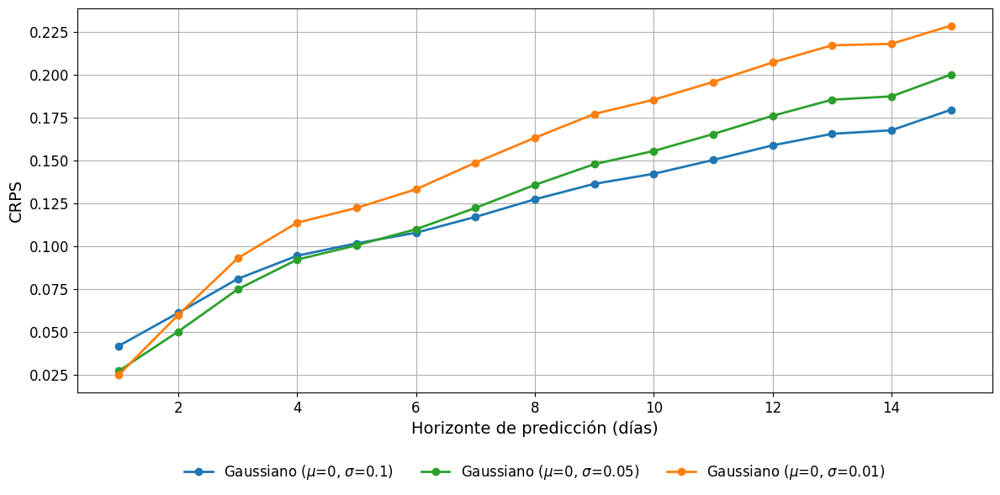

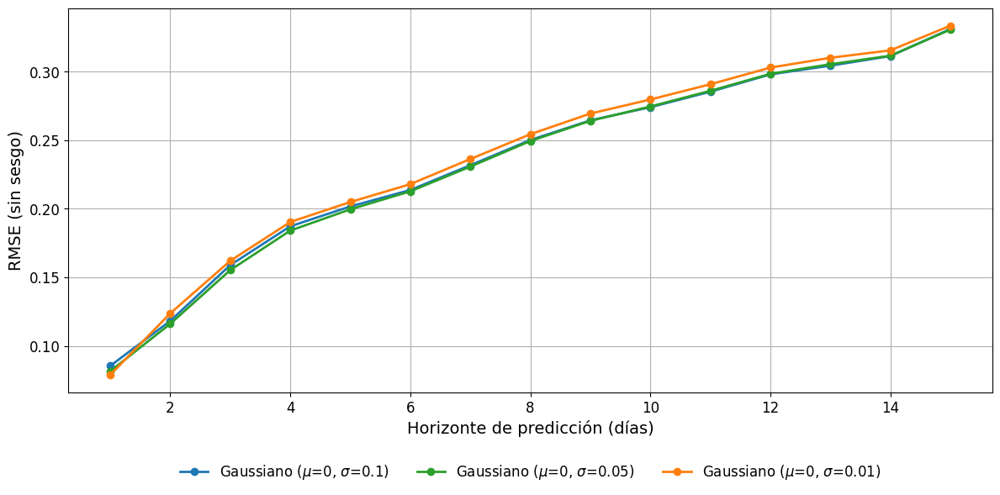

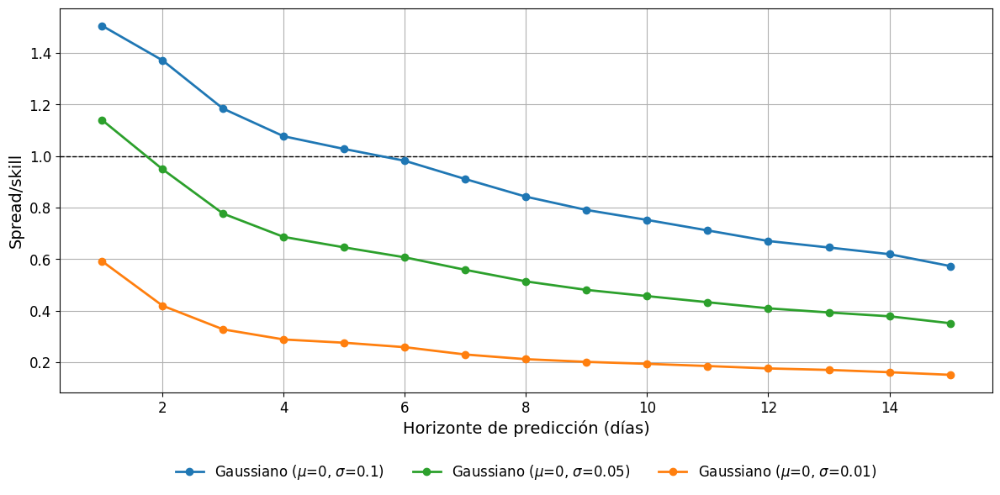

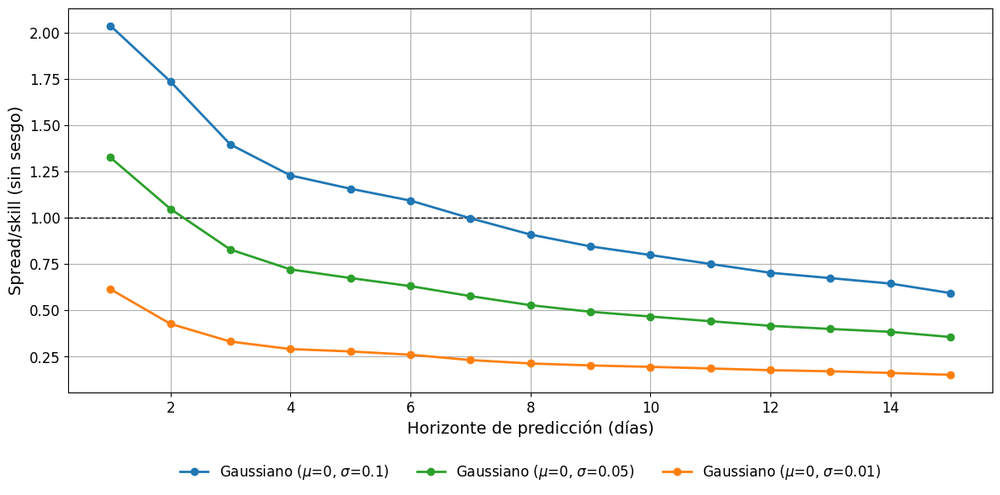

In [56]:
for metric in ["crps.sst_temperature", "rmse_unb.sst_temperature",
               "spread_skill_ratio.sst_temperature", "spread_skill_ratio_unb.sst_temperature"]:

    plt.figure(figsize=(12, 6))
    if metric == "spread_skill_ratio.sst_temperature" or metric == "spread_skill_ratio_unb.sst_temperature":
        plt.axhline(
            y=1,
            color="black",
            linestyle="--",
            linewidth=1,
        )

    plt.plot(
        lead_days,
        dataset_metrics_gaussian_01_ens_5_manual[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.1)",
        marker='o',
        color="#1f77b4",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_005_ens_5_manual[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.05)",
        marker='o',
        color="#2ca02c",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_001_ens_5_manual[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.01)",
        marker='o',
        color="#ff7f0e",
        linewidth=2
    )


    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/gaussian/5_ens_prob_{metric.replace('.', '_')}_manual.svg", format='svg')
    plt.show()

##### Comparación estadísticas

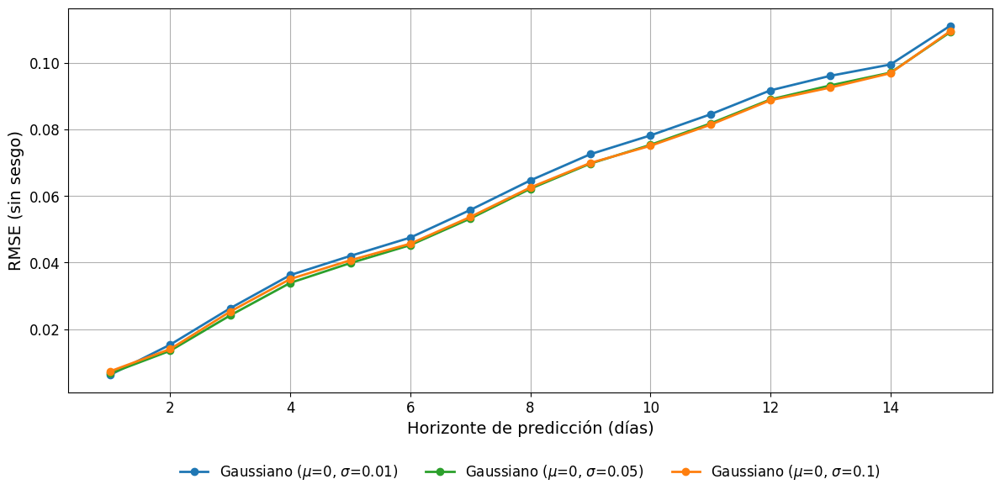

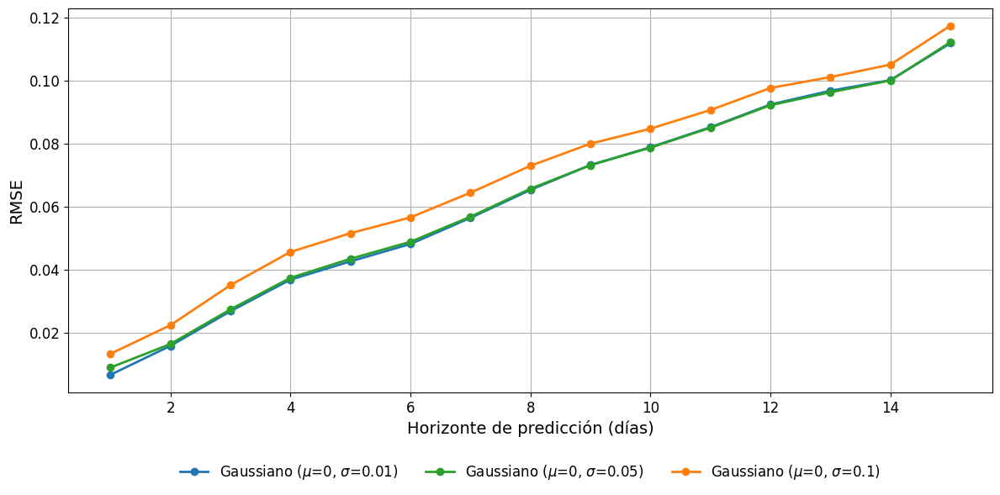

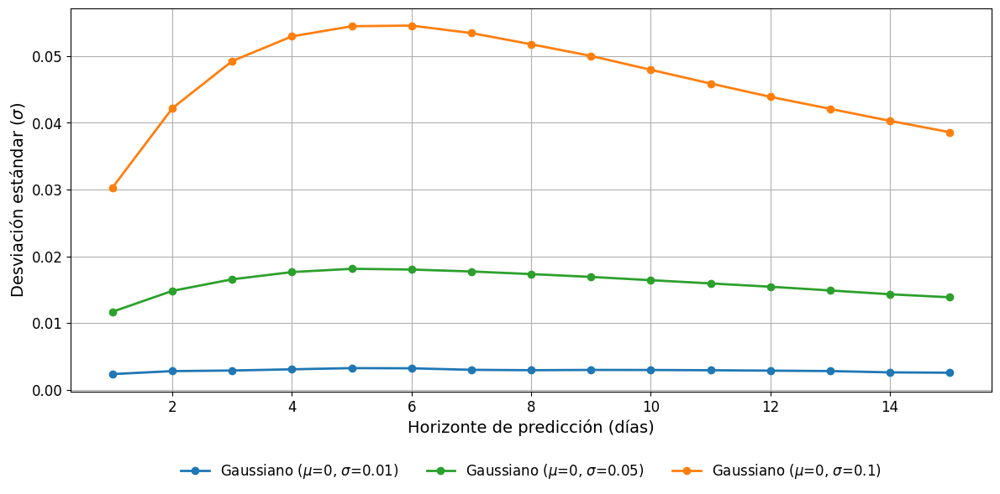

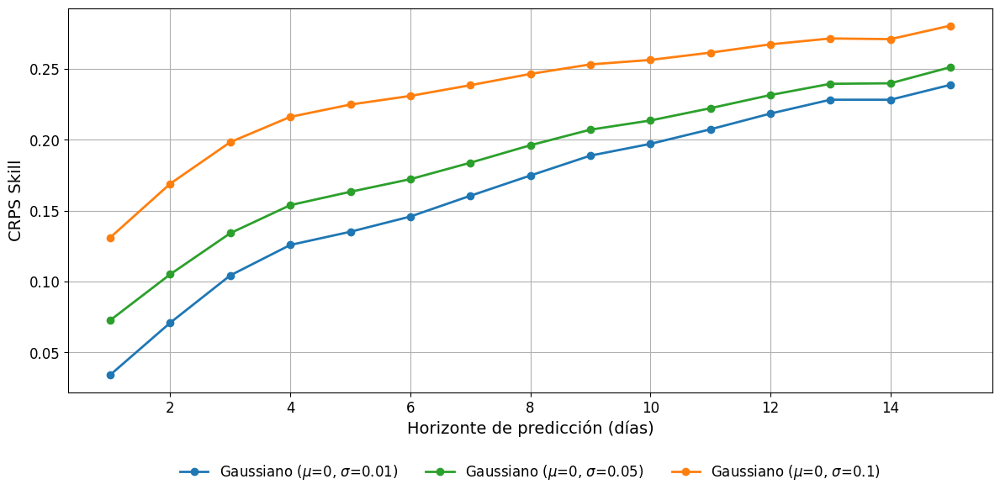

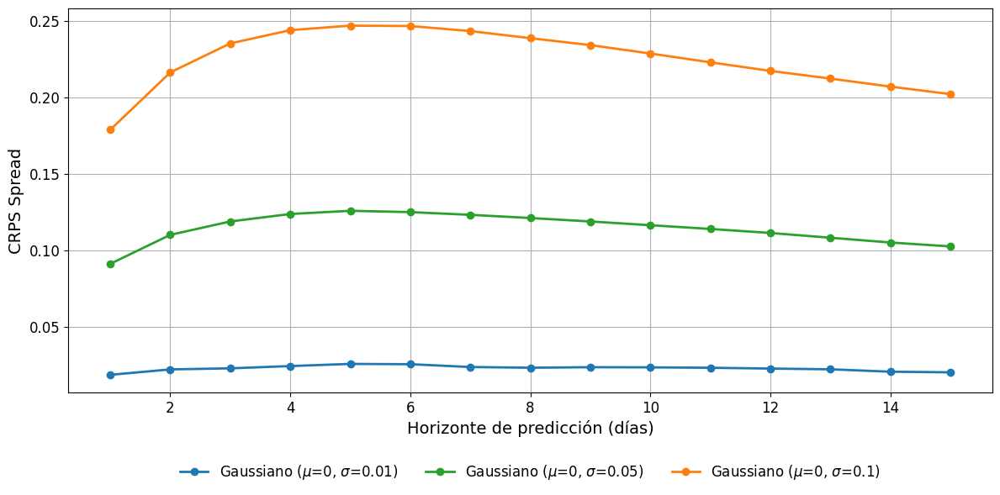

In [57]:
for statistic in ["UnbiasedEnsembleMeanSquaredError_number_skipna_ensemble_True", "SquaredError_predictions_ensemble_mean_self._ensemble_dim='number'_self._skipna=True", "EnsembleVariance_number_skipna_ensemble_True", "CRPSSkill_number", "CRPSSpread_number_fair_predictions"]:   

    plt.figure(figsize=(12, 6))

    plt.plot(
        lead_days,
        aggregation_state_gaussian_001_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.01)",
        marker='o',
        color="#1f77b4",
        linewidth=2
    )
    plt.plot(
        lead_days,
        aggregation_state_gaussian_005_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.05)",
        marker='o',
        color="#2ca02c",
        linewidth=2
    )
    plt.plot(
        lead_days,
        aggregation_state_gaussian_01_ens_5.mean_statistics()[statistic]['sst_temperature'].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.1)",
        marker='o',
        color="#ff7f0e",
        linewidth=2
    )

    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_statistic_names[statistic], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/gaussian/5_ens_prob_{statistic.replace('.', '_')}_statistic.svg", format='svg')

#### Ver predicción de ensemble de gaussiano

Procesando dataset: Gaussiano ($\mu$=0, $\sigma$=0.01)
Procesando dataset: Gaussiano ($\mu$=0, $\sigma$=0.05)
Procesando dataset: Gaussiano ($\mu$=0, $\sigma$=0.1)


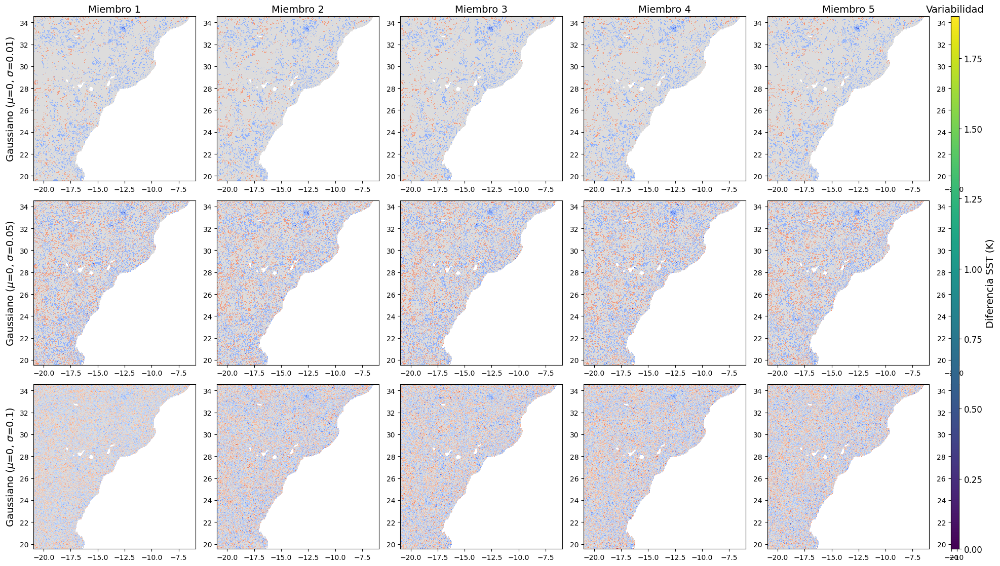

In [58]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

datasets = {
    "Gaussiano ($\\mu$=0, $\\sigma$=0.01)": ensemble_gaussian_001_dataset,
    "Gaussiano ($\\mu$=0, $\\sigma$=0.05)": ensemble_gaussian_005_dataset,
    "Gaussiano ($\\mu$=0, $\\sigma$=0.1)": ensemble_gaussian_01_dataset
}

target = targets_dataset
target_sst = target["sst_temperature"].sel(lead_time="1 days")

n_ensembles = len(datasets)
n_members = 5

fig = plt.figure(figsize=(4 * n_members + 1, 4 * n_ensembles))  # +1 para espacio barra color
gs = gridspec.GridSpec(nrows=n_ensembles, ncols=n_members + 1, width_ratios=[1]*n_members + [0.05], figure=fig)

axes = []
for i in range(n_ensembles):
    row_axes = []
    for j in range(n_members):
        ax = fig.add_subplot(gs[i, j])
        row_axes.append(ax)
    axes.append(row_axes)

for row_idx, (label, ds) in enumerate(datasets.items()):
    print(f"Procesando dataset: {label}")
    sst = ds["sst_temperature"].sel(lead_time="1 days")
    is_ensemble = "number" in sst.dims

    ensemble_mean = sst.mean(dim="number")
    variabilidad = np.abs(sst - ensemble_mean).sum(dim="number")
    variabilidad_mean = variabilidad.mean(dim="init_time")

    for col_idx in range(n_members):
        ax = axes[row_idx][col_idx]

        if is_ensemble:
            member_data = sst.sel(number=col_idx)
            diff = target_sst - member_data
        else:
            diff = np.sqrt((sst - target_sst) ** 2)

        diff_mean = diff.mean(dim="init_time")

        im = diff_mean.plot(
            ax=ax,
            cmap="coolwarm",
            add_colorbar=False,
            add_labels=False,
        )

        ax.set_xlabel("")
        ax.set_ylabel("")

        if row_idx == 0:
            ax.set_title(f"Miembro {col_idx+1}", fontsize=14)
        if col_idx == 0:
            ax.set_ylabel(label, fontsize=14)

    # Sexta columna: Variabilidad
    ax_var = fig.add_subplot(gs[row_idx, n_members])
    im = variabilidad_mean.plot(
        ax=ax_var,
        cmap="viridis",
        add_colorbar=False,
        add_labels=False,
    )
    ax_var.set_xlabel("")
    ax_var.set_ylabel("")
    if row_idx == 0:
        ax_var.set_title("Variabilidad", fontsize=14)

cbar_ax = fig.add_subplot(gs[:, -1])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical', label="Diferencia SST (K)")
cbar.ax.yaxis.label.set_size(14)
cbar.ax.tick_params(labelsize=12)

plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

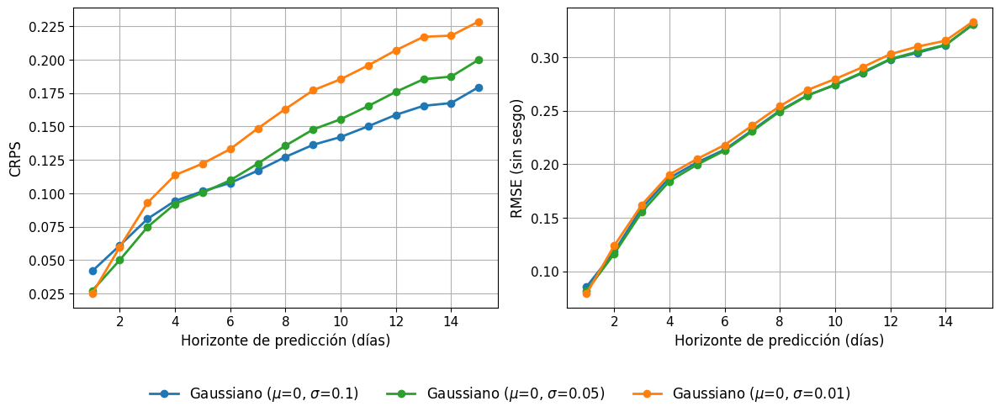

In [59]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

metrics = [
    ("crps.sst_temperature", "CRPS"),
    ("rmse_unb.sst_temperature", "RMSE (sin sesgo)"),
]

colors = {
    "Gaussiano ($\\mu$=0, $\\sigma$=0.1)": "#1f77b4",
    "Gaussiano ($\\mu$=0, $\\sigma$=0.05)": "#2ca02c",
    "Gaussiano ($\\mu$=0, $\\sigma$=0.01)": "#ff7f0e"
}

labels = list(colors.keys())

fig = plt.figure(figsize=(12, 5))
gs = gridspec.GridSpec(1, 2)  # Solo una fila, dos columnas

datasets = {
    "Gaussiano ($\\mu$=0, $\\sigma$=0.1)": dataset_metrics_gaussian_01_ens_5,
    "Gaussiano ($\\mu$=0, $\\sigma$=0.05)": dataset_metrics_gaussian_005_ens_5,
    "Gaussiano ($\\mu$=0, $\\sigma$=0.01)": dataset_metrics_gaussian_001_ens_5,
}

for idx, (metric, title) in enumerate(metrics):
    ax = fig.add_subplot(gs[0, idx])

    if "spread_skill_ratio" in metric:
        ax.axhline(y=1, color="black", linestyle="--", linewidth=1)

    for label in labels:
        data = datasets[label][metric].mean(dim="init_time")
        ax.plot(
            lead_days,
            data,
            label=label,
            marker='o',
            linewidth=2,
            color=colors[label]
        )

    ax.set_xlabel("Horizonte de predicción (días)", fontsize=12)
    ax.set_ylabel(dict_metric_names[metric], fontsize=12)
    ax.tick_params(axis='both', labelsize=11)
    ax.grid(True)

# Leyenda global
handles, labels = ax.get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='lower center',
    fontsize=12,
    ncol=3,
    frameon=False,
    bbox_to_anchor=(0.5, -0.05)
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])
plt.savefig("metrics/gaussian/comparacion_metricas_probabilisticas.svg", format='svg')
plt.show()

### Comparación unificación de ensemble

#### Definición de métricas

In [60]:
metrics = {
  'rmse': deterministic.RMSE(),
  'mae': deterministic.MAE(),
  'bias': deterministic.Bias()
}

aggregator = aggregation.Aggregator(
  reduce_dims=["latitude", "longitude"], skipna=True
)

#### Cargando datos Gaussiano std 0.1

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\unified\mean


C:\Users\Alejandro\AppData\Local\Temp\ipykernel_17256\299321428.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


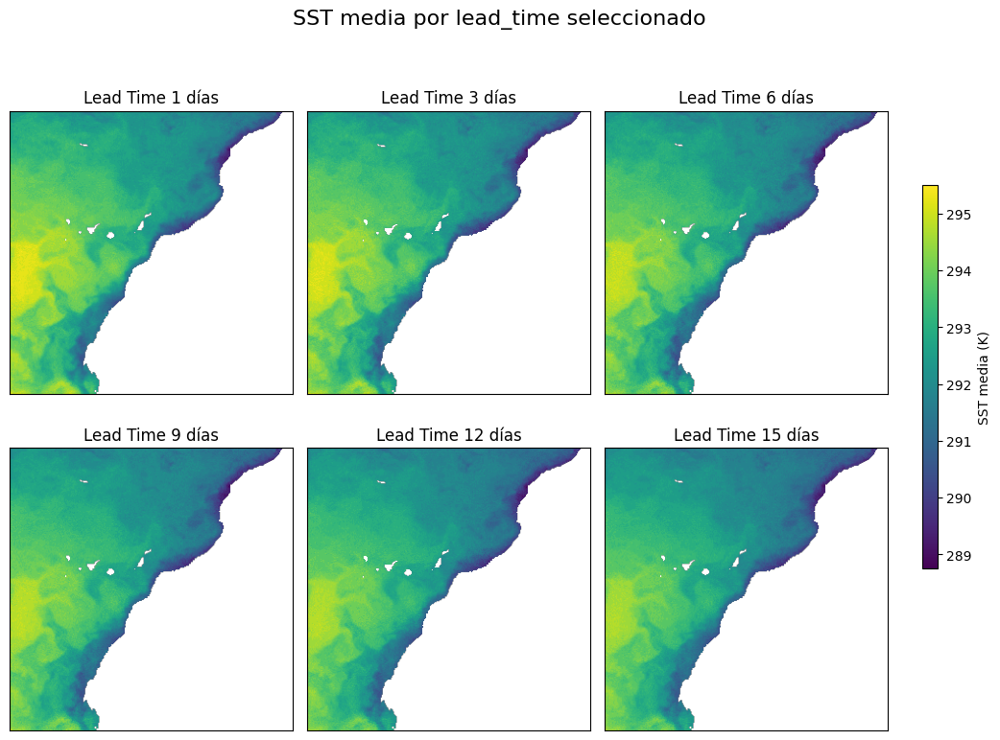

In [61]:
directory = r"data\atlantic\predictions mock\ensemble_5\gaussian_01\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_gaussian_01_mean = pred_loader.load_chunk()

statistics_gaussian_01 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_gaussian_01_mean, targets_dataset
)

aggregation_statistics_gaussian_01 = aggregator.aggregate_statistics(statistics_gaussian_01)
dataset_metrics_gaussian_01 = aggregation_statistics_gaussian_01.metric_values(metrics)
dataset_metrics_gaussian_01["lead_time"] = dataset_metrics_gaussian_01["lead_time"].astype("timedelta64[D]")

plot_mean_sst_for_lead_times(predictions_dataset_gaussian_01_mean, lead_times_to_plot=(1, 3, 6, 9, 12, 15))

#### Cargando datos gaussian 0.05

In [62]:
directory = r"data\atlantic\predictions mock\ensemble_5\gaussian_005\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_gaussian_005_mean = pred_loader.load_chunk()
statistics_gaussian_005 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_gaussian_005_mean, targets_dataset
)
aggregation_statistics_gaussian_005 = aggregator.aggregate_statistics(statistics_gaussian_005)
dataset_metrics_gaussian_005 = aggregation_statistics_gaussian_005.metric_values(metrics)
dataset_metrics_gaussian_005["lead_time"] = dataset_metrics_gaussian_005["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_005\unified\mean


#### Cargando datos gaussian 0.01

In [63]:
directory = r"data\atlantic\predictions mock\ensemble_5\gaussian_001\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_gaussian_001_mean = pred_loader.load_chunk()
statistics_gaussian_001 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_gaussian_001_mean, targets_dataset
)
aggregation_statistics_gaussian_001 = aggregator.aggregate_statistics(statistics_gaussian_001)
dataset_metrics_gaussian_001 = aggregation_statistics_gaussian_001.metric_values(metrics)
dataset_metrics_gaussian_001["lead_time"] = dataset_metrics_gaussian_001["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_001\unified\mean


#### Cargando datos Perlin (2, 12, 12)

In [64]:
directory = r"data\atlantic\predictions mock\ensemble_5\perlin\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_mean = pred_loader.load_chunk()
statistics_perlin = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_mean, targets_dataset
)
aggregation_statistics_perlin = aggregator.aggregate_statistics(statistics_perlin)
dataset_metrics_perlin = aggregation_statistics_perlin.metric_values(metrics)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin\unified\mean


#### Cargando datos Perlin Fractal (3d)

In [65]:
directory = r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_3d_mean = pred_loader.load_chunk()
statistics_perlin_fractal_3d = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_3d_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_3d = aggregator.aggregate_statistics(statistics_perlin_fractal_3d)
dataset_metrics_perlin_fractal_3d = aggregation_statistics_perlin_fractal_3d.metric_values(metrics)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_3d\unified\mean


#### Cargando datos Perlin (2, 3, 3)

In [66]:
directory = r"data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_metrics_perlin_3_3_mean = pred_loader.load_chunk()
statistics_perlin_3_3 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_metrics_perlin_3_3_mean, targets_dataset
)
aggregation_statistics_perlin_3_3 = aggregator.aggregate_statistics(statistics_perlin_3_3)
dataset_metrics_perlin_3_3 = aggregation_statistics_perlin_3_3.metric_values(metrics)
dataset_metrics_perlin_3_3["lead_time"] = dataset_metrics_perlin_3_3["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\perlin_3d_3_3\unified\mean


#### Cargando datos Perlin Fractal (2d) (15, 15) (False, True)

In [67]:
directory = r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_2d_mean = pred_loader.load_chunk()
statistics_perlin_fractal_2d = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_2d_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_2d = aggregator.aggregate_statistics(statistics_perlin_fractal_2d)
dataset_metrics_perlin_fractal_2d = aggregation_statistics_perlin_fractal_2d.metric_values(metrics)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d\unified\mean


#### Cargando datos Perlin Fractal (2d) (5,5) (False, True)

In [68]:
directory = r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_2d_5_5_mean = pred_loader.load_chunk()
statistics_perlin_fractal_2d_5_5 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_2d_5_5_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_2d_5_5 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_5_5)
dataset_metrics_perlin_fractal_2d_5_5 = aggregation_statistics_perlin_fractal_2d_5_5.metric_values(metrics)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_5_5\unified\mean


#### Cargando datos Perlin Fractal (2 d) (15, 15) (False, False)

In [69]:
directory = r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_2d_15_15_f_f_mean = pred_loader.load_chunk()
statistics_perlin_fractal_2d_15_15_f_f = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_2d_15_15_f_f_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_2d_15_15_f_f = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_f)
dataset_metrics_perlin_fractal_2d_15_15_f_f = aggregation_statistics_perlin_fractal_2d_15_15_f_f.metric_values(metrics)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_f\unified\mean


#### Carga datos Perlin Fractal (2d) (15, 15) (0.05 escalabilidad) (False, True)

In [70]:
directory = r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_2d_15_15_f_t_005_mean = pred_loader.load_chunk()
statistics_perlin_fractal_2d_15_15_f_t_005 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_2d_15_15_f_t_005_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_2d_15_15_f_t_005 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_t_005)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005 = aggregation_statistics_perlin_fractal_2d_15_15_f_t_005.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_t_005["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_005\unified\mean


#### Perlin Fractal (2d) (15, 15) (0.4 escalabilidad) (False, True)

In [71]:
directory = r"data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\unified\mean"
pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)
predictions_dataset_perlin_fractal_2d_15_15_f_t_04_mean = pred_loader.load_chunk()

statistics_perlin_fractal_2d_15_15_f_t_04 = metrics_base.compute_unique_statistics_for_all_metrics(
    metrics, predictions_dataset_perlin_fractal_2d_15_15_f_t_04_mean, targets_dataset
    )
aggregation_statistics_perlin_fractal_2d_15_15_f_t_04 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_t_04)
dataset_metrics_perlin_fractal_2d_15_15_f_t_04 = aggregation_statistics_perlin_fractal_2d_15_15_f_t_04.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_t_04["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_t_04["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\fractal_perlin_2d_15_15_f_t_04\unified\mean


### Comparación gráficas

##### Comparación entre Perlin

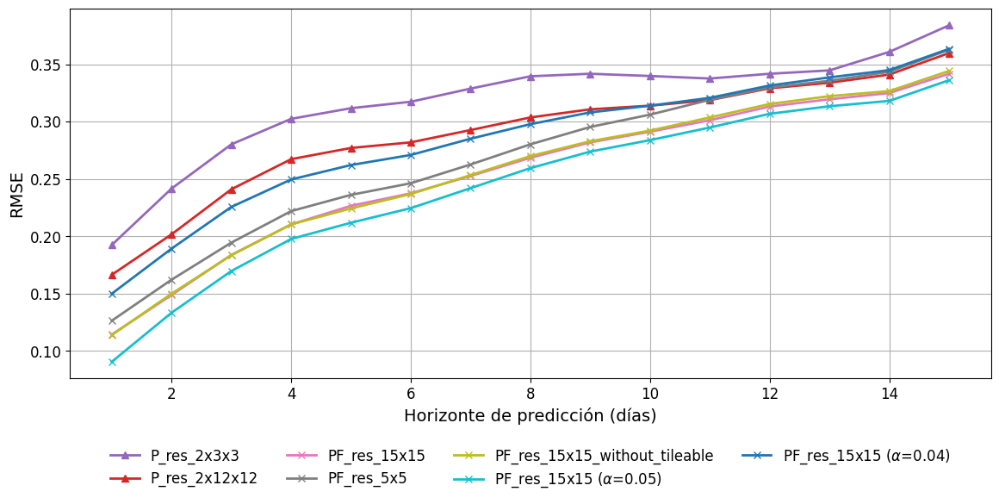

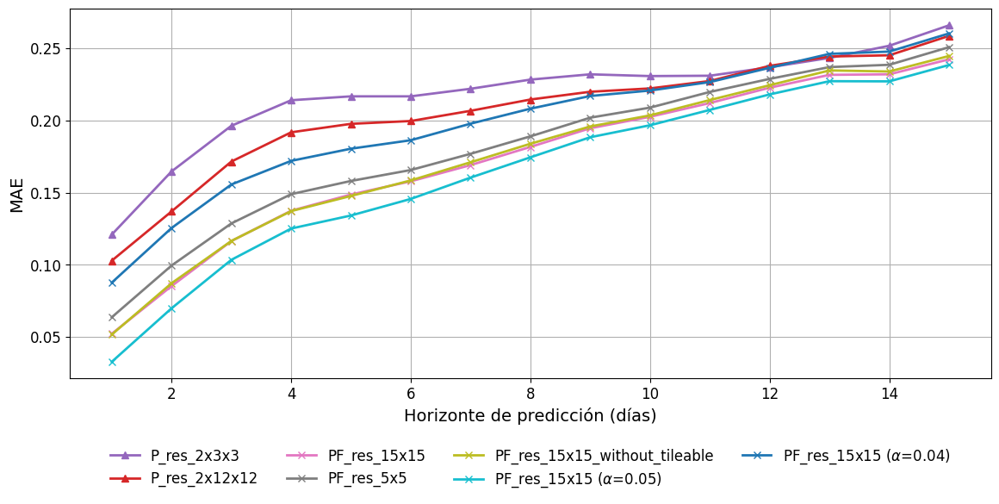

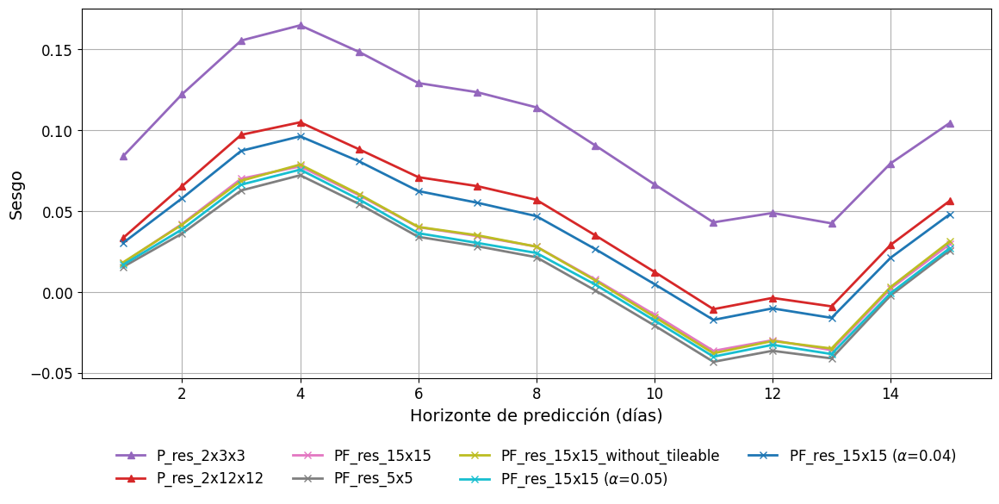

In [72]:
for metric in ["rmse.sst_temperature", "mae.sst_temperature", "bias.sst_temperature"]:

    plt.figure(figsize=(12, 6))
    plt.plot(
        lead_days,
        dataset_metrics_perlin_3_3[metric].mean(dim="init_time"),
        label="P_res_2x3x3",
        marker='^',
        color="#9467bd",
        linewidth=2.0
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin[metric].mean(dim="init_time"),
        label="P_res_2x12x12",
        marker='^',
        color="#d62728",
        linewidth=2.0
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d[metric].mean(dim="init_time"),
        label="PF_res_15x15",
        marker='x',
        color="#e377c2",
        linewidth=2.0
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_5_5[metric].mean(dim="init_time"),
        label="PF_res_5x5",
        marker='x',
        color="#7f7f7f",
        linewidth=2.0
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_f[metric].mean(dim="init_time"),
        label="PF_res_15x15_without_tileable",
        marker='x',
        color="#bcbd22",
        linewidth=2.0
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_t_005[metric].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.05)",
        marker='x',
        color="#17becf",
        linewidth=2.0
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_t_04[metric].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.04)",
        marker='x',
        color="#1f77b4",
        linewidth=2.0
    )

    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/perlin/5_ens_det_{metric.replace('.', '_')}.svg", format='svg')
    plt.show()

##### Comparaciones para ruido gaussiano

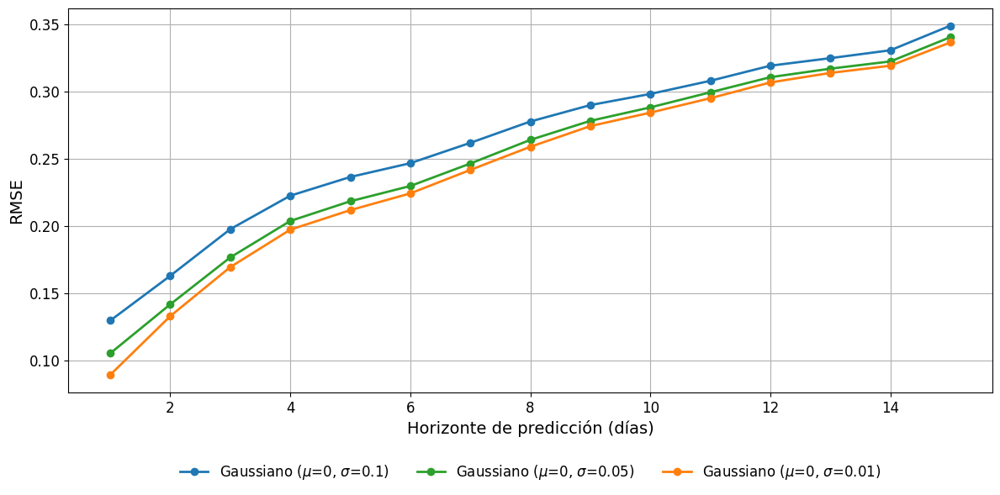

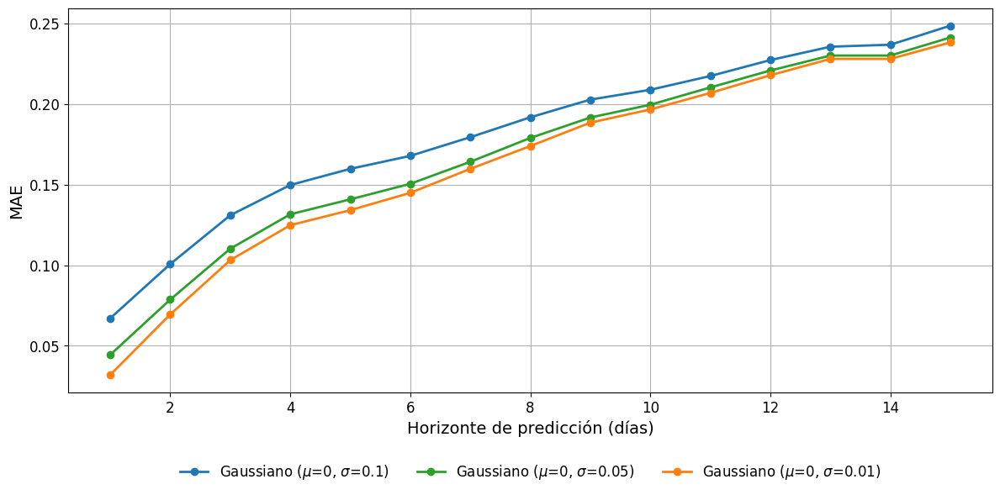

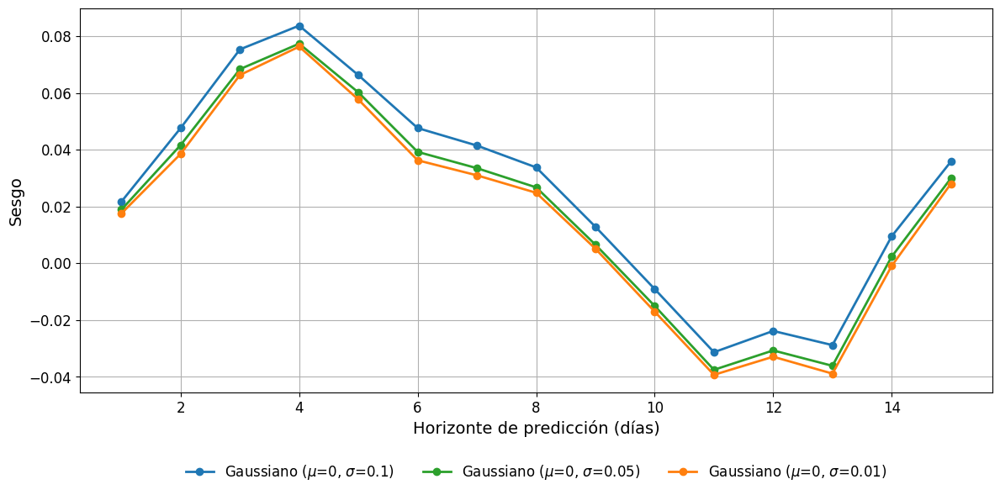

In [73]:
for metric in ["rmse.sst_temperature", "mae.sst_temperature", "bias.sst_temperature"]:

    plt.figure(figsize=(12, 6))
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_01[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.1)",
        marker='o',
        color="#1f77b4",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_005[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.05)",
        marker='o',
        color="#2ca02c",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_gaussian_001[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.01)",
        marker='o',
        color="#ff7f0e",
        linewidth=2
    )


    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/gaussian/5_ens_det_{metric.replace('.', '_')}.svg", format='svg')
    plt.show()


#### Gráfica de predicción ensemble resultados gaussiano unificado

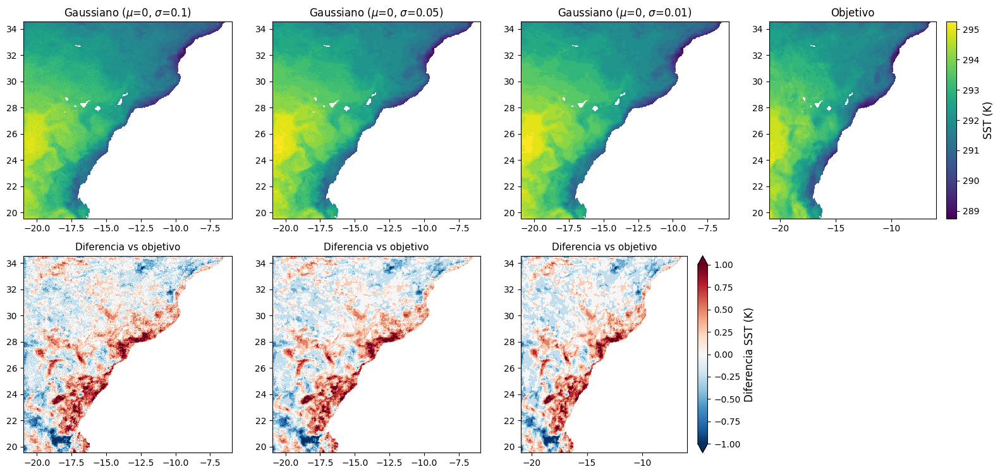

In [74]:
import matplotlib.pyplot as plt
import xarray as xr

datasets = {
    "Gaussiano ($\\mu$=0, $\\sigma$=0.1)": predictions_dataset_gaussian_01_mean,
    "Gaussiano ($\\mu$=0, $\\sigma$=0.05)": predictions_dataset_gaussian_005_mean,
    "Gaussiano ($\\mu$=0, $\\sigma$=0.01)": predictions_dataset_gaussian_001_mean,
}

target = targets_dataset

init_date = "2022-01-02"
lead_time = "15 days"

n_models = len(datasets)
fig, axes = plt.subplots(2, n_models + 1, figsize=(4 * (n_models + 1), 8))

sst_target = target["sst_temperature"].sel(init_time=init_date, lead_time=lead_time)

for i, (label, ds) in enumerate(datasets.items()):
    sst_pred = ds["sst_temperature"].sel(init_time=init_date, lead_time=lead_time)
    im = sst_pred.plot(ax=axes[0, i], cmap="viridis", add_colorbar=False)
    axes[0, i].set_title(label, fontsize=12)
    axes[0, i].set_xlabel("")
    axes[0, i].set_ylabel("")

im = sst_target.plot(ax=axes[0, -1], cmap="viridis", add_colorbar=True)
im.colorbar.set_label("SST (K)", fontsize=12)
axes[0, -1].set_title("Objetivo", fontsize=12)
axes[0, -1].set_xlabel("")
axes[0, -1].set_ylabel("")

for i, (label, ds) in enumerate(datasets.items()):
    sst_pred = ds["sst_temperature"].sel(init_time=init_date, lead_time=lead_time)
    diff = sst_pred - sst_target
    im_diff = diff.plot(
        ax=axes[1, i],
        cmap="RdBu_r",
        vmin=-1, vmax=1,
        add_colorbar=(i == n_models - 1)
    )
    if i == n_models - 1:
        im_diff.colorbar.set_label("Diferencia SST (K)", fontsize=12)
    axes[1, i].set_title(f"Diferencia vs objetivo", fontsize=11)
    axes[1, i].set_xlabel("")
    axes[1, i].set_ylabel("")

axes[1, -1].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## Mismas pruebas pero con 10 miembros

### Comparación de pruebas con tipos de ruido segun métricas probabilísticas

#### Definición de métricas

In [75]:
metrics = {
    "crps" : probabilistic.CRPSEnsemble(),
    "rmse_unb": probabilistic.UnbiasedEnsembleMeanRMSE(skipna_ensemble=True),
    "spread_skill_ratio": probabilistic.SpreadSkillRatio(skipna_ensemble=True),
    "spread_skill_ratio_unb": probabilistic.UnbiasedSpreadSkillRatio(skipna_ensemble=True),
}

aggregator = aggregation.Aggregator(
  reduce_dims=['latitude', 'longitude'], skipna=True
)

#### Cargando datos Gaussiano std 0.1

In [76]:
ensemble_gaussian_01_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_10\gaussian_01"))
ensemble_gaussian_01 = EnsembleFromNpLoaders(loaders=ensemble_gaussian_01_loaders)
ensemble_gaussian_01_dataset = ensemble_gaussian_01.build_ensemble()

statistics_gaussian_01_ens_10 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_gaussian_01_dataset, targets_dataset)
aggregation_state_gaussian_01_ens_10 = aggregator.aggregate_statistics(statistics_gaussian_01_ens_10)
dataset_metrics_gaussian_01_ens_10 = aggregation_state_gaussian_01_ens_10.metric_values(metrics)
dataset_metrics_gaussian_01_ens_10["lead_time"] = dataset_metrics_gaussian_01_ens_10["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250623_173928-gbp74pck\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250623_174214-r2ek9l48\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250623_174506-wbt22vo4\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250623_174831-3y0kvpx8\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250623_175100-02dtpyi1\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250624_113436-kuscyo2q\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250624_113930-8ecswcxj\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\run-20250624_11

#### Cargando datos gaussian 0.01

In [77]:
ensemble_gaussian_001_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_10\gaussian_001"))
ensemble_gaussian_001 = EnsembleFromNpLoaders(loaders=ensemble_gaussian_001_loaders)
ensemble_gaussian_001_dataset = ensemble_gaussian_001.build_ensemble()

statistics_gaussian_001_ens_10 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_gaussian_001_dataset, targets_dataset)
aggregation_state_gaussian_001_ens_10 = aggregator.aggregate_statistics(statistics_gaussian_001_ens_10)
dataset_metrics_gaussian_001_ens_10 = aggregation_state_gaussian_001_ens_10.metric_values(metrics)
dataset_metrics_gaussian_001_ens_10["lead_time"] = dataset_metrics_gaussian_001_ens_10["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_123345-ft79w4d1\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_123559-0rjpzm21\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_123821-058ew24z\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_124104-op1jj003\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_124309-8ilyerch\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_182916-yw3souuo\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-20250623_183123-4i6c6k5a\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\run-202

#### Cargando datos Perlin

In [78]:
ensemble_perlin_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_10\perlin"))
ensemble_perlin = EnsembleFromNpLoaders(loaders=ensemble_perlin_loaders)
ensemble_perlin_dataset = ensemble_perlin.build_ensemble()

statistics_perlin_ens_10 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_dataset, targets_dataset)
aggregation_state_perlin_ens_10 = aggregator.aggregate_statistics(statistics_perlin_ens_10)
dataset_metrics_perlin_ens_10 = aggregation_state_perlin_ens_10.metric_values(metrics)
dataset_metrics_perlin_ens_10["lead_time"] = dataset_metrics_perlin_ens_10["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250623_191234-80ahb5t8\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250623_191557-nwcbeibb\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250623_191933-poch6bwy\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250623_192326-2rwi63hv\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250623_192626-8g7dz33i\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250624_173855-mrmuf2tr\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250624_174313-n8v9pijw\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\run-20250624_174617-enlh5a95\files\predictions
Loaded 1

#### Cargando datos Perlin Fractal (3d)

In [79]:
ensemble_perlin_fractal_3d_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d"))
ensemble_perlin_fractal_3d = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_3d_loaders)
ensemble_perlin_fractal_3d_dataset = ensemble_perlin_fractal_3d.build_ensemble()

statistics_perlin_fractal_3d_ens_10 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_3d_dataset, targets_dataset)
aggregation_state_perlin_fractal_3d_ens_10 = aggregator.aggregate_statistics(statistics_perlin_fractal_3d_ens_10)
dataset_metrics_perlin_fractal_3d_ens_10 = aggregation_state_perlin_fractal_3d_ens_10.metric_values(metrics)
dataset_metrics_perlin_fractal_3d_ens_10["lead_time"] = dataset_metrics_perlin_fractal_3d_ens_10["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250623_193257-bl0e0qjh\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250623_193551-run48772\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250623_193826-gpyy7su3\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250623_194225-k5wobmu4\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250623_194851-e5q123cg\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250624_185822-4pedsp8e\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\run-20250624_190209-nbkybwte\files\predictions
Loaded 1 data entries from data\atlantic\predictions mo

#### Cargando datos Perlin (2, 3, 3)

In [80]:
ensemble_perlin_3_3_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3"))
ensemble_perlin_3_3 = EnsembleFromNpLoaders(loaders=ensemble_perlin_3_3_loaders)
ensemble_perlin_3_3_dataset = ensemble_perlin_3_3.build_ensemble()

statistics_perlin_3_3_ens_10 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_3_3_dataset, targets_dataset)
aggregation_state_perlin_3_3_ens_10 = aggregator.aggregate_statistics(statistics_perlin_3_3_ens_10)
dataset_metrics_perlin_3_3_ens_10 = aggregation_state_perlin_3_3_ens_10.metric_values(metrics)

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_133356-1n8na38d\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_133711-5piqciet\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_134004-69xhwdme\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_134345-rzh5rdd4\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_180013-moxqimoj\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_180255-wf18vc4j\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\run-20250624_180623-gwksfr4p\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3

#### Carga datos Perlin Fractal (2d) (15, 15) (0.05 escalabilidad) (False, True)

In [81]:
ensemble_perlin_fractal_2d_15_15_f_t_005_loaders = get_ensemble_dataset_loaders(get_directories(r"data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005"))
ensemble_perlin_fractal_2d_15_15_f_t_005 = EnsembleFromNpLoaders(loaders=ensemble_perlin_fractal_2d_15_15_f_t_005_loaders)
ensemble_perlin_fractal_2d_15_15_f_t_005_dataset = ensemble_perlin_fractal_2d_15_15_f_t_005.build_ensemble()

statistics_perlin_fractal_2d_15_15_f_t_005_ens_10 = metrics_base.compute_unique_statistics_for_all_metrics(metrics, ensemble_perlin_fractal_2d_15_15_f_t_005_dataset, targets_dataset)
aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_10 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_t_005_ens_10)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_10 = aggregation_state_perlin_fractal_2d_15_15_f_t_005_ens_10.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_10["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_10["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-20250624_110405-id7y39ch\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-20250624_111151-qctlgg5h\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-20250624_111446-d3bj7n50\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-20250624_111823-rqo7zw1u\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-20250624_112327-v0idukt5\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-20250624_183730-l4xc4bfq\files\predictions
Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\run-

In [82]:
lead_days = (dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_10["lead_time"] / np.timedelta64(1, "D")).values

### Comparación gráficas

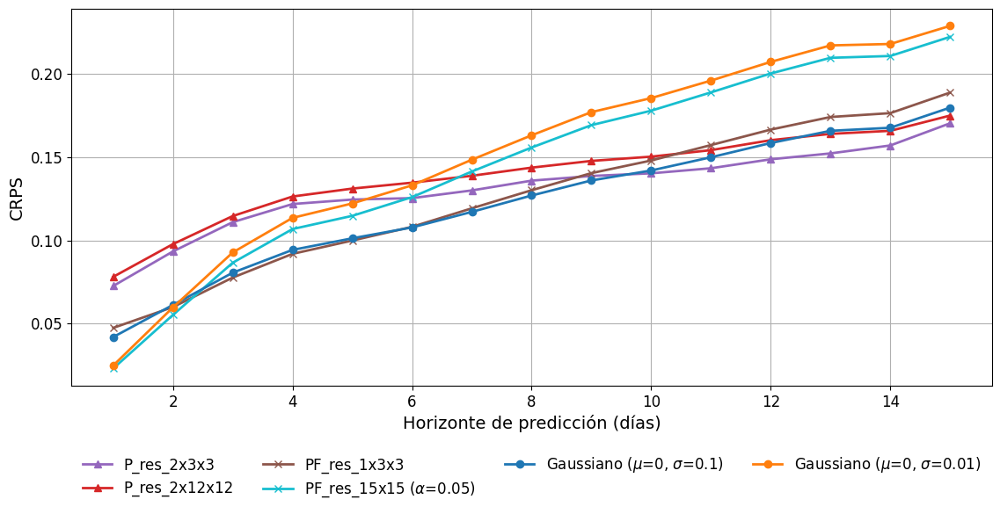

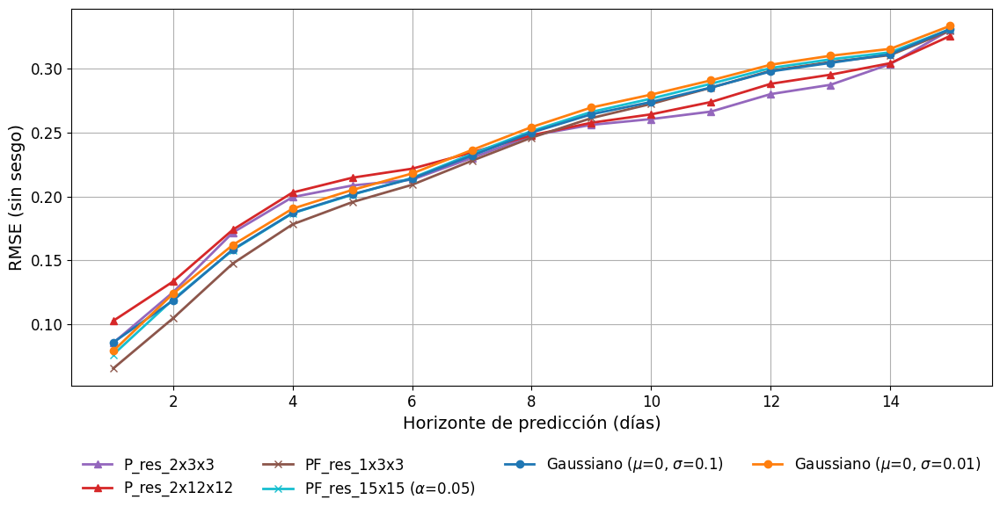

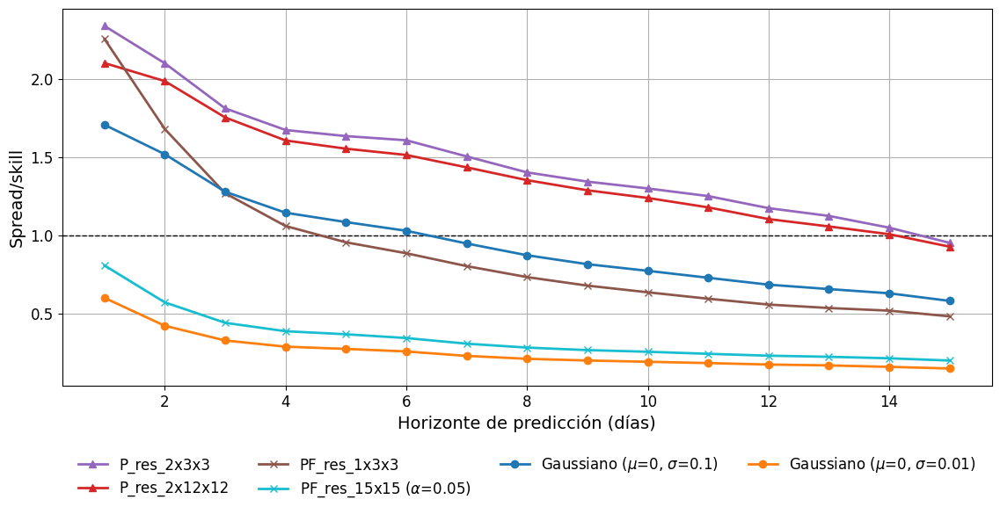

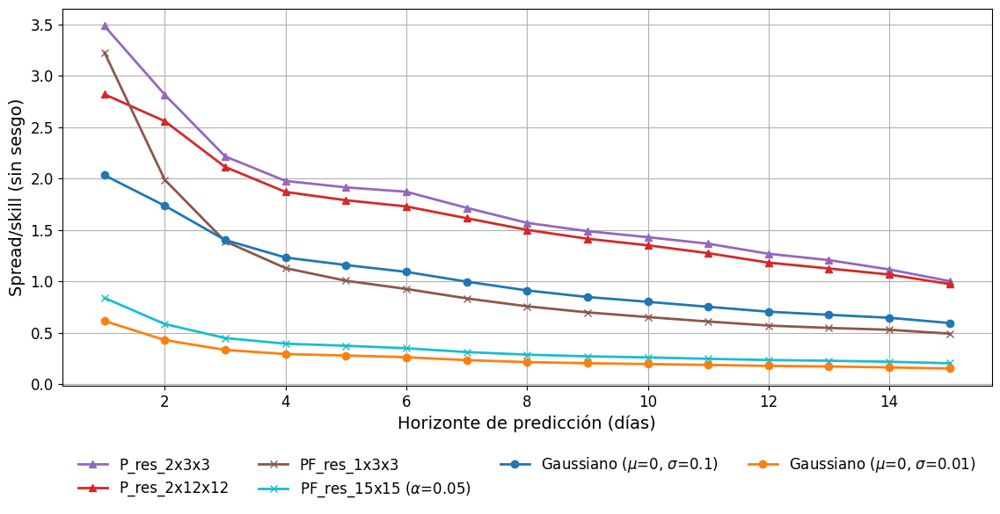

In [83]:
for metric in ["crps.sst_temperature", "rmse_unb.sst_temperature",
               "spread_skill_ratio.sst_temperature", "spread_skill_ratio_unb.sst_temperature"]:

    plt.figure(figsize=(12, 6))

    if metric == "spread_skill_ratio.sst_temperature":
        plt.axhline(
            y=1,
            color="black",
            linestyle="--",
            linewidth=1,
        )
    
    plt.plot(
        lead_days,
        dataset_metrics_perlin_3_3_ens_10[metric].mean(dim="init_time"),
        label="P_res_2x3x3",
        marker='^',
        color="#9467bd",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_ens_10[metric].mean(dim="init_time"),
        label="P_res_2x12x12",
        marker='^',
        color="#d62728",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_3d_ens_10[metric].mean(dim="init_time"),
        label="PF_res_1x3x3",
        marker='x',
        color="#8c564b",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_10[metric].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.05)",
        marker='x',
        color="#17becf",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_gaussian_01_ens_10[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.1)",
        marker='o',
        color="#1f77b4",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_gaussian_001_ens_10[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.01)",
        marker='o',
        color="#ff7f0e",
        linewidth=2
    )
    
    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/ensemble_10/10_ens_prob_{metric.replace('.', '_')}.svg", format='svg')
    plt.show()

In [84]:
import pandas as pd

lead_day_target = "15 days"

metrics = ["crps.sst_temperature", "rmse_unb.sst_temperature"]

datasets_ens10 = {
    "P_res_2x3x3": dataset_metrics_perlin_3_3_ens_10,
    "P_res_2x12x12": dataset_metrics_perlin_ens_10,
    "PF_res_1x3x3": dataset_metrics_perlin_fractal_3d_ens_10,
    "PF_res_15x15 (α=0.05)": dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_10,
    "Gauss (σ²=0.1)": dataset_metrics_gaussian_01_ens_10,
    "Gauss (σ²=0.01)": dataset_metrics_gaussian_001_ens_10,
}

datasets_ens5 = {
    "P_res_2x3x3": dataset_metrics_perlin_3_3_ens_5,
    "P_res_2x12x12": dataset_metrics_perlin_ens_5,
    "PF_res_1x3x3": dataset_metrics_perlin_fractal_3d_ens_5,
    "PF_res_15x15 (α=0.05)": dataset_metrics_perlin_fractal_2d_15_15_f_t_005_ens_5,
    "Gauss (σ²=0.1)": dataset_metrics_gaussian_01_ens_5,
    "Gauss (σ²=0.01)": dataset_metrics_gaussian_001_ens_5,
}

table_rows = []

for metric in metrics:
    for model_name in datasets_ens10:
        val_ens10 = datasets_ens10[model_name][metric].sel(lead_time=lead_day_target).mean(dim="init_time").item()
        val_ens5 = datasets_ens5[model_name][metric].sel(lead_time=lead_day_target).mean(dim="init_time").item()
        
        table_rows.append({
            "Métrica": dict_metric_names[metric],
            "Modelo": model_name,
            "Ensemble=10": val_ens10,
            "Ensemble=5": val_ens5,
            "Δ (10 - 5)": val_ens10 - val_ens5,
        })

df_comparison = pd.DataFrame(table_rows)

In [85]:
df_comparison[["Ensemble=10", "Ensemble=5", "Δ (10 - 5)"]] = df_comparison[["Ensemble=10", "Ensemble=5", "Δ (10 - 5)"]].round(4)

df_comparison.sort_values(by=["Métrica", "Modelo"], inplace=True)
df_comparison

,Métrica,Modelo,Ensemble=10,Ensemble=5,Δ (10 - 5)
5,CRPS,Gauss (σ²=0.01),0.2288,0.2285,0.0002
4,CRPS,Gauss (σ²=0.1),0.1797,0.1794,0.0002
3,CRPS,PF_res_15x15 (α=0.05),0.2222,0.2217,0.0005
2,CRPS,PF_res_1x3x3,0.1887,0.1917,-0.0029
1,CRPS,P_res_2x12x12,0.1749,0.1736,0.0013
0,CRPS,P_res_2x3x3,0.1703,0.1721,-0.0018
11,RMSE (sin sesgo),Gauss (σ²=0.01),0.3336,0.3336,0.0001
10,RMSE (sin sesgo),Gauss (σ²=0.1),0.3311,0.3311,-0.0001
9,RMSE (sin sesgo),PF_res_15x15 (α=0.05),0.3311,0.3307,0.0004
8,RMSE (sin sesgo),PF_res_1x3x3,0.3300,0.3319,-0.0019


### Comparación unificación de ensemble

#### Definición de métricas

In [86]:
metrics = {
  'rmse': deterministic.RMSE(),
  'mae': deterministic.MAE(),
  'bias': deterministic.Bias()
}

aggregator = aggregation.Aggregator(
  reduce_dims=["latitude", "longitude"], skipna=True
)

#### Sin ruido

In [87]:
statistics_without_noise = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_without_noise_dataset, targets_dataset
)

aggregation_statistics_without_noise = aggregator.aggregate_statistics(statistics_without_noise)
dataset_metrics_without_noise = aggregation_statistics_without_noise.metric_values(metrics)
dataset_metrics_without_noise["lead_time"] = dataset_metrics_without_noise["lead_time"].astype("timedelta64[D]")

In [88]:
directory = r"data\atlantic\predictions mock\ensemble_5\gaussian_01\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_gaussian_01_mean = pred_loader.load_chunk()

statistics_gaussian_01 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_gaussian_01_mean, targets_dataset
)

aggregation_statistics_gaussian_01 = aggregator.aggregate_statistics(statistics_gaussian_01)
dataset_metrics_gaussian_01 = aggregation_statistics_gaussian_01.metric_values(metrics)
dataset_metrics_gaussian_01["lead_time"] = dataset_metrics_gaussian_01["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_5\gaussian_01\unified\mean


#### Gaussian 0.1

In [89]:
directory = r"data\atlantic\predictions mock\ensemble_10\gaussian_01\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_gaussian_01_mean = pred_loader.load_chunk()

statistics_gaussian_01 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_gaussian_01_mean, targets_dataset
)

aggregation_statistics_gaussian_01 = aggregator.aggregate_statistics(statistics_gaussian_01)
dataset_metrics_gaussian_01 = aggregation_statistics_gaussian_01.metric_values(metrics)
dataset_metrics_gaussian_01["lead_time"] = dataset_metrics_gaussian_01["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_01\unified\mean


#### Gaussian 0.01

In [90]:
directory = r"data\atlantic\predictions mock\ensemble_10\gaussian_001\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_gaussian_001_mean = pred_loader.load_chunk()
statistics_gaussian_001 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_gaussian_001_mean, targets_dataset
)
aggregation_statistics_gaussian_001 = aggregator.aggregate_statistics(statistics_gaussian_001)
dataset_metrics_gaussian_001 = aggregation_statistics_gaussian_001.metric_values(metrics)
dataset_metrics_gaussian_001["lead_time"] = dataset_metrics_gaussian_001["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\gaussian_001\unified\mean


#### Perlin

In [91]:
directory = r"data\atlantic\predictions mock\ensemble_10\perlin\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_mean = pred_loader.load_chunk()
statistics_perlin = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_mean, targets_dataset
)
aggregation_statistics_perlin = aggregator.aggregate_statistics(statistics_perlin)
dataset_metrics_perlin = aggregation_statistics_perlin.metric_values(metrics)
dataset_metrics_perlin["lead_time"] = dataset_metrics_perlin["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin\unified\mean


#### Perlin Fractal 2d (15, 15) (f, f) (esc=0.05)

In [92]:
directory = r"data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_2d_15_15_f_t_005_mean = pred_loader.load_chunk()
statistics_perlin_fractal_2d_15_15_f_t_005 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_2d_15_15_f_t_005_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_2d_15_15_f_t_005 = aggregator.aggregate_statistics(statistics_perlin_fractal_2d_15_15_f_t_005)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005 = aggregation_statistics_perlin_fractal_2d_15_15_f_t_005.metric_values(metrics)
dataset_metrics_perlin_fractal_2d_15_15_f_t_005["lead_time"] = dataset_metrics_perlin_fractal_2d_15_15_f_t_005["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_2d_15_15_f_t_005\unified\mean


#### Perlin Fractal 3d

In [93]:
directory = r"data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlin_fractal_3d_mean = pred_loader.load_chunk()
statistics_perlin_fractal_3d = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlin_fractal_3d_mean, targets_dataset
)
aggregation_statistics_perlin_fractal_3d = aggregator.aggregate_statistics(statistics_perlin_fractal_3d)
dataset_metrics_perlin_fractal_3d = aggregation_statistics_perlin_fractal_3d.metric_values(metrics)
dataset_metrics_perlin_fractal_3d["lead_time"] = dataset_metrics_perlin_fractal_3d["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\fractal_perlin_3d\unified\mean


#### Perlin 3d (3, 3)

In [94]:
directory = r"data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\unified\mean"

pred_loader = PredictionsFromNumpy(
    path=directory,
    variables=variables,
    extra_variables=extra_variables,
    extra_files=extra_files
)

predictions_dataset_perlinl_3_3_mean = pred_loader.load_chunk()
statistics_perlin_3_3 = metrics_base.compute_unique_statistics_for_all_metrics(
  metrics, predictions_dataset_perlinl_3_3_mean, targets_dataset
)
aggregation_statistics_perlin_3_3 = aggregator.aggregate_statistics(statistics_perlin_3_3)
dataset_metrics_perlin_3_3 = aggregation_statistics_perlin_3_3.metric_values(metrics)
dataset_metrics_perlin_3_3["lead_time"] = dataset_metrics_perlin_3_3["lead_time"].astype("timedelta64[D]")

Loaded 1 data entries from data\atlantic\predictions mock\ensemble_10\perlin_3d_3_3\unified\mean


### Comparación de gráficas

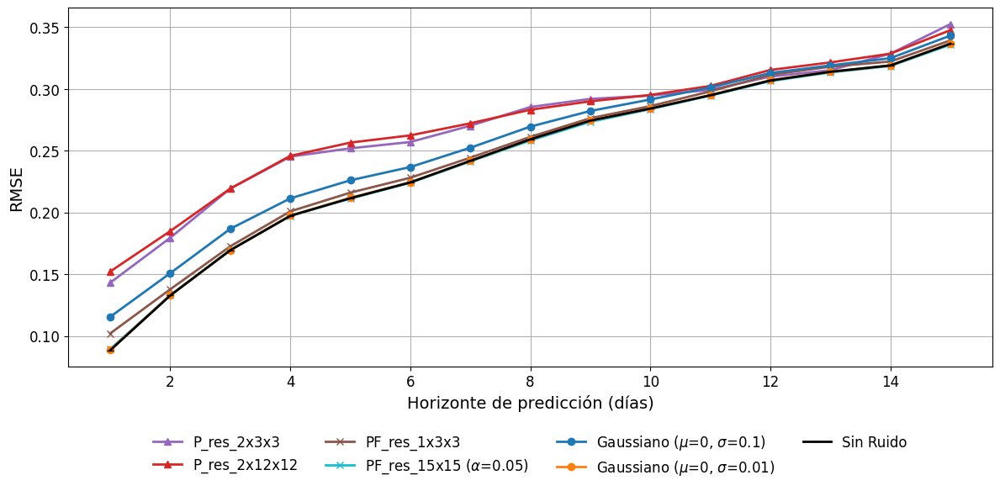

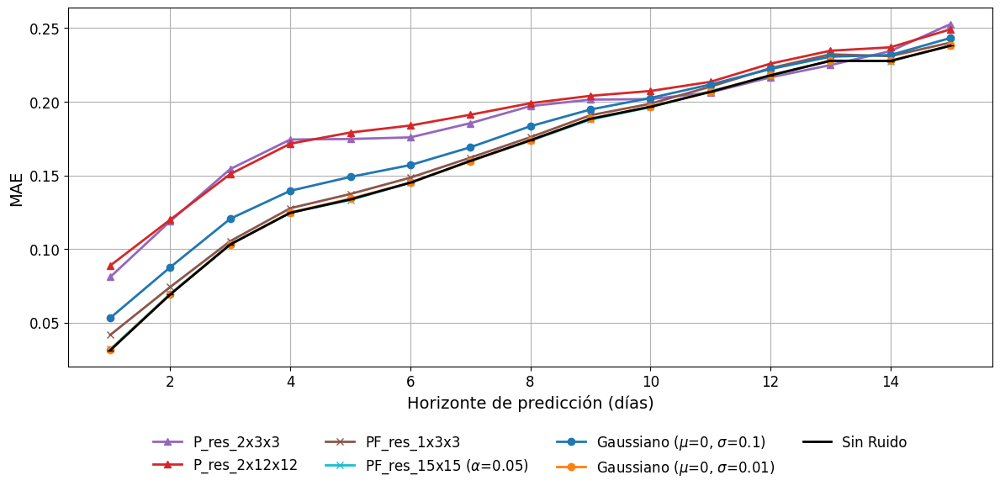

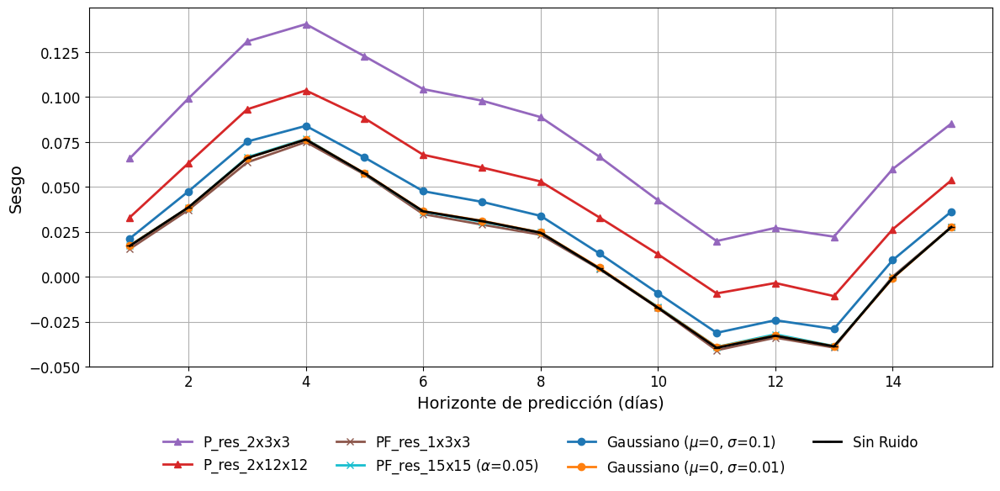

In [95]:
for metric in ["rmse.sst_temperature", "mae.sst_temperature", "bias.sst_temperature"]:

    plt.figure(figsize=(12, 6))
    plt.plot(
        lead_days,
        dataset_metrics_perlin_3_3[metric].mean(dim="init_time"),
        label="P_res_2x3x3",
        marker='^',
        color="#9467bd",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin[metric].mean(dim="init_time"),
        label="P_res_2x12x12",
        marker='^',
        color="#d62728",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_3d[metric].mean(dim="init_time"),
        label="PF_res_1x3x3",
        marker='x',
        color="#8c564b",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_perlin_fractal_2d_15_15_f_t_005[metric].mean(dim="init_time"),
        label=r"PF_res_15x15 ($\alpha$=0.05)",
        marker='x',
        color="#17becf",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_gaussian_01[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.1)",
        marker='o',
        color="#1f77b4",
        linewidth=2
    )

    plt.plot(
        lead_days,
        dataset_metrics_gaussian_001[metric].mean(dim="init_time"),
        label="Gaussiano ($\mu$=0, $\sigma$=0.01)",
        marker='o',
        color="#ff7f0e",
        linewidth=2
    )
    plt.plot(
        lead_days,
        dataset_metrics_without_noise[metric].mean(dim="init_time"),
        label="Sin Ruido",
        marker='_',
        color="#000000",
        linewidth=2
    )
    
    plt.xlabel("Horizonte de predicción (días)", fontsize=14)
    plt.ylabel(dict_metric_names[metric], fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid()
    plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15),  ncol=4, frameon=False)
    plt.tight_layout()
    plt.savefig(f"metrics/ensemble_10/10_ens_det_{metric.replace('.', '_')}.svg", format='svg')
    plt.show()